In [1]:
from google.colab import drive
import os
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
!pwd
%cd /content/drive/MyDrive/LSTM project/LSTM_Project/sector_analysis(food drug)/2016-2019(before covid)

/content
/content/drive/MyDrive/LSTM project/LSTM_Project/sector_analysis(food drug)/2016-2019(before covid)


In [ ]:
!pip list

In [3]:
# sector-> Food & Drug store(2016/01/01~2019/12/31) 
import pandas as pd
df1=pd.read_csv("SVNDY.csv", index_col=0) 
df2=pd.read_csv("WBA.csv", index_col=0)  
df3=pd.read_csv("MTRAF.csv", index_col=0)
df4=pd.read_csv("COOP.csv", index_col=0) 
df5=pd.read_csv("JSAIY.csv", index_col=0)  
df6=pd.read_csv("ADRNY.csv", index_col=0)  
df7=pd.read_csv("TSCDY.csv", index_col=0)  
df8=pd.read_csv("KR.csv", index_col=0)    
df9=pd.read_csv("AGHC.csv", index_col=0)  
df10=pd.read_csv("CRRFY.csv", index_col=0) 
df11=pd.read_csv("WNGRF.csv", index_col=0) 

all_data=[df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11]

print(df1.shape, df2.shape, df3.shape, df4.shape, df5.shape, df6.shape, df7.shape, df8.shape, df9.shape, df10.shape, df11.shape)

(1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7) (1006, 7)


In [ ]:
# 統計データ
concat = pd.concat([df1.iloc[:,2], df2.iloc[:,2], df3.iloc[:,2], df4.iloc[:,2], df5.iloc[:,2], df6.iloc[:,2],df7.iloc[:,2],
               df8.iloc[:,2], df9.iloc[:,2], df10.iloc[:,2], df11.iloc[:,2]], axis=1) 

# df.set_axis(['Col_1', 'Col_2', 'Col_3'], axis='columns')
concat  = concat.set_axis(['Seven & I Holdings', 'Walgreens Boots Alliance', 'Metro', 'Coop Group', 'J. Sainsbury',
                 'Royal Ahold Delhaize', 'Tesco', 'Kroger', 'AEON', 'Carrefour', 'George Weston'], axis='columns').round(2)
concat.describe().round(2)

,Seven & I Holdings,Walgreens Boots Alliance,Metro,Coop Group,J. Sainsbury,Royal Ahold Delhaize,Tesco,Kroger,AEON,Carrefour,George Weston
count,1006.00,1006.00,1006.00,1006.00,1006.00,1006.00,1006.00,1006.00,1006.00,1006.00,1006.00
mean,20.49,72.85,34.12,17.03,13.50,23.02,10.35,29.01,1.61,4.36,81.76
std,1.50,10.66,3.58,6.56,2.03,2.05,1.39,4.97,1.36,0.71,6.09
min,16.74,49.99,26.76,6.97,8.85,17.80,7.68,20.23,0.03,3.04,63.84
25%,19.70,65.13,31.69,12.43,12.26,21.84,9.15,24.80,0.43,3.81,76.85
50%,20.74,75.82,33.22,15.84,13.26,23.13,10.25,28.92,1.05,4.15,82.95
75%,21.62,81.93,36.07,19.20,14.77,24.39,11.37,32.16,2.93,4.96,86.76
max,23.80,89.69,43.81,31.68,17.70,30.00,13.21,42.42,6.75,6.03,91.56


In [ ]:
# 標準化による数値圧縮を可視化 2016/1/4
# concat1 = pd.concat([df1.iloc[0, :], df2.iloc[0, :], df3.iloc[0, :], df4.iloc[0, :], df5.iloc[0, :], df6.iloc[0, :], 
#                      df7.iloc[0, :], df8.iloc[0, :], df9.iloc[0, :], df10.iloc[0, :], df11.iloc[0, :]], axis=1)
# print(concat1)
# concat1 = concat1.set_axis(['Seven & I Holdings', 'Walgreens Boots Alliance', 'Metro', 'Coop Group', 'J. Sainsbury',
#                  'Royal Ahold Delhaize', 'Tesco', 'Kroger', 'AEON', 'Carrefour', 'George Weston'], axis='columns').round(2)
          
# concat1  = concat1.loc[(['Open', 'High', 'Low', 'Close', 'Volume']), :]
# print(concat1)

# from sklearn.preprocessing import StandardScaler
# s=StandardScaler()
# concat1=s.fit_transform(concat1)
# concat1

# Make models (train)

In [4]:
from keras.layers import *
def make_models(all_data, company_list, input_category=['High'], input_vars=[2], output_category=['High'], 
                output_vars=[2],  outputs_company=1, train_size=754, time_step=60, epochs=30, 
                units=50, batch_size=64, volume_switch=False): 
  import warnings
  warnings.simplefilter('ignore')
  import math
  import seaborn as sns
  import matplotlib.pyplot as plt
  import keras
  import pandas as pd
  import numpy as np
  from keras.models import Sequential
  from keras.layers import Dense
  from keras.layers import LSTM
  from keras.layers import Dropout
  from sklearn.preprocessing import MinMaxScaler
  from sklearn.preprocessing import StandardScaler
  from sklearn.metrics import mean_squared_error
  from sklearn.metrics import mean_absolute_error
  from sklearn.model_selection import train_test_split
  from keras.callbacks import EarlyStopping
  from sklearn.decomposition import PCA

  # Show arguments
  inputs=['-', 'Open', 'High', 'Low', 'Close', '-', 'Volume']
  print(f"[Arguments]") 
  print(f"num_company={len(company_list)}社 {company_list}")
  print(f"input_variables={input_category}, ====> output_variables={output_category}")
  print(f"train_size={train_size}, time_step={time_step}, num_epoch={epochs}, num_units(neurons)={units}, batch_size={batch_size}")
  print("")

  print("~~Make models~~")
  #1. prepare train_data
  train_data=[]
  for i in range(len(all_data)):
    train_data.append(all_data[i].iloc[: train_size, input_vars].values)
  print(f"train_data={np.array(train_data).shape}")

  #2. normalise data
  #3. prepare both training_data and label depending on the number of inputs and outputs
  X_train=[]
  y_trains=[]
  
  training_set_all=np.hstack((data[:,:] for data in train_data))
  print(f"training_set_all={training_set_all.shape}") # (754, company_list * input_vars)

  ss=StandardScaler()
  ss_all=ss.fit_transform(training_set_all)
  concat=ss_all
  print(f"concat={concat.shape}")

  index=[]
  for i in range(len(output_vars)):
    index+=[j for j in range(input_vars.index(output_vars[i]), len(all_data)*(len(input_vars)), len(input_vars))] 
  print(f"index={index}, len={len(index)}")
  
  for l in range(time_step, train_size):
    X_train.append(concat[l-time_step: l, :])
    for m in range(len(index)):
      y_trains.append(concat[l, index[m]])

  X_train=np.array(X_train)
  y_trains=np.array(y_trains)
  print(f"X_train={X_train.shape}, y_trains={y_trains.shape}")

  #4. modify y_train based on the number of companies
  y_trains2=[]
  
  if len(output_vars) != 1:
    for x in range(len(all_data)*len(output_vars)):
      x_tr=np.array([y_trains[i] for i in range(x, len(y_trains), len(all_data*len(output_vars)))])
      y_trains2.append(x_tr)

  else: # len(output_i)==1
    for y in range(len(all_data)):
      y_tr=np.array([y_trains[i] for i in range(y, len(y_trains), len(all_data))])
      y_trains2.append(y_tr)

  y_trains2=np.array(y_trains2)
  print(f"y_trains2={y_trains2.shape}")

  model_lists = []
  
  #5. make models

  for l in range(outputs_company):
    print(f"{l+1}/{outputs_company}")

    model = Sequential()

    model.add(LSTM(units = units, return_sequences = True, input_shape=(X_train.shape[1], X_train.shape[2] )))
    model.add(Dropout(0.2))

    model.add(LSTM(units = units, return_sequences = True))
    model.add(Dropout(0.2))

    model.add(LSTM(units = units, return_sequences = True))
    model.add(Dropout(0.2))

    model.add(LSTM(units = units, return_sequences = False))
    model.add(Dropout(0.2))

    model.add(Dense(units = 1))

    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    model.fit(X_train, y_trains2[l], epochs=epochs, batch_size=batch_size)
    model_lists.append(model)
    print("")

  return model_lists, y_trains2[:outputs_company]

# Make predictions (test)


In [5]:
# Make predictions
def make_preds(model_lists, y_trains2, all_data, company_list, input_category=['High'], input_vars=[2], output_category=['High'], 
               output_vars=[2], train_size=754, time_step=60, cm_switch=False, volume_switch=False):
  import warnings
  warnings.simplefilter('ignore')
  import math
  import seaborn as sns
  import matplotlib.pyplot as plt
  import keras
  import pandas as pd
  import numpy as np
  from keras.models import Sequential
  from keras.layers import Dense
  from keras.layers import LSTM
  from keras.layers import Dropout
  from sklearn.preprocessing import MinMaxScaler
  from sklearn.preprocessing import StandardScaler
  from sklearn.metrics import mean_squared_error
  from sklearn.metrics import mean_absolute_error
  from sklearn.model_selection import train_test_split
  from keras.callbacks import EarlyStopping
  
  print("~~Make predctions~~")

  #1. prepare test_data 

  test_data=[]
  for i in range(len(all_data)):
    test_data.append(all_data[i].iloc[train_size:, input_vars].values)
  print(f"test_data={np.array(test_data).shape}")

  inputs = []
  for m in range(len(all_data)): 
    inputs.append(all_data[m].iloc[:, input_vars][len(all_data[m])-len(test_data[m])-time_step:].values)
  inputs = np.array(inputs)

  #2. normalise
  """ scale_iverse purpose """
  variables=[]
  s_lists=[]
  for i in range(len(all_data)):
    for j in range(len(input_vars)): 
      m=inputs[i, :, j].reshape(-1, 1) 
      s=StandardScaler()
      t=s.fit_transform(m)
      variables.append(m)
      s_lists.append(s)

  inputs2=np.hstack(variables)
  ss=StandardScaler()
  inputs2=ss.fit_transform(inputs2)

  X_test = []
  # Use all components as imputs for testing
  for n in range(time_step, np.array(test_data).shape[1]+time_step):
    X_test.append(inputs2[n-time_step:n, :])
  X_test = np.array(X_test)

  #3. make predictiions
  preds = [] 
  for o in range(len(y_trains2)):
    preds.append(model_lists[o].predict(X_test))
  preds=np.array(preds)

  #4. scale_back normalise
  ind=[i for i in range(input_vars.index(output_vars[0]), len(all_data)*len(input_vars), len(input_vars))]
  print(f"ind={ind}")
  for p in range(len(y_trains2)):
    preds[p] = s_lists[ind[p]].inverse_transform(preds[p]) 
  preds = np.array(preds)

  #5. plot actual vs preds
  """ df ={"Date":0, "Open":1, "High":2, "Low":3, "Close":4, "Adj Close":5, "Volume":6] """
  actual_lists_test=[]
  actual_lists_train=[]
  for dd in range(len(output_vars)):
    actual_lists_test+=[sc.iloc[train_size:,output_vars[dd]] for sc in all_data]
    actual_lists_train+=[sc.iloc[:train_size,output_vars[dd]] for sc in all_data]
  
  if len(output_vars) > 1:
    R2=company_list*len(output_vars) # lists of companies
  else: R2=company_list
  
  print(f"actual_lists_train={np.array(actual_lists_train).shape}, actual_lists_test={np.array(actual_lists_test).shape}, preds_list={np.array(preds).shape}")

  R=0
  r=[r for r in range(len(all_data)-1, len(R2), len(all_data))]

  plt.figure(figsize=(18, 30))
  scores_list=[]
  for p in range(len(R2)):
    if len(company_list) >=9: plt.subplot(6, 2, p+1)
    else: plt.subplot(4, 2, p+1) 
    plt.plot(all_data[0].loc[:train_size-1,'Date'], actual_lists_train[p], color='black', label='Real(Trainning)')
    plt.plot(all_data[0].loc[train_size:,'Date'], actual_lists_test[p], color='red', label='Real(Test)')
    plt.plot(all_data[0].loc[train_size:,'Date'], preds[p], color='blue', label='Predict')
    plt.xticks(np.arange(0, 1006, 251))
    plt.xlabel('Date')
    if output_vars[0]==2: plt.ylabel('High')
    else: plt.ylabel(output_category[0])
    
    from sklearn.metrics import r2_score
    r2=round(r2_score(actual_lists_test[p], preds[p].flatten()), 4)
    scores_list.append(r2)
    plt.title(f"R2: {R2[p]}={round(r2_score(actual_lists_test[p], preds[p].flatten()), 4)}")

    R +=r2_score(actual_lists_test[p], preds[p].flatten())
    plt.legend()
  plt.show()

  # calcurate R2_average 
  if p in r:
    scores_list.append(round(R/len(all_data), 4))
    print(f"R2-{len(all_data)}companies_average={round(R/len(all_data), 4)}")
    R=0
  print(f"R2_scores_lists={scores_list}")
  print("")

  #6. Make confusion matrix
  columns = company_list # labeling 
  
  if cm_switch==True:
    for p in range(len(output_vars)):
      print(f"Preds_Heatmap='{output_category[p]}' correlation")
      prd=[preds[p] for p in range(len(company_list)*p, len(company_list)+p*len(company_list))]
      Preds= pd.DataFrame(np.concatenate(prd, axis=1))
      Preds.columns = columns
    
      plt.figure(figsize=(8, 6))
      cmap=sns.diverging_palette(220, 20, as_cmap=True)
      sns.heatmap(Preds.corr(method='spearman'), vmin=-1, vmax=1, center=0, cmap=cmap, annot=True) 
      plt.show()

  # return preds[p].flatten() 


# 8月4日以降　


## ALL in ALL Function

In [6]:
def multivariate_LSTM(original_all_data, num_company=11, input_category=['High'], input_vars=[2], output_category=['High'], output_vars=[2], outputs_company=11, 
               train_size=754, time_step=60, epochs=20, units=50, batch_size=64, cm_switch=False, uni_regression1=False, uni_regression2=False):
  
  """Define variables
  original_all_data: Financial data of all companies used
  num_company: Number of companies to be randomly selected from all companies
  input_vars: The item number of the variable to be used as input (More than one can be specified)
  output_caategory: Category name of the variable to be output (More than one can be specified)
  output_vars: The item number of the variable to be used as outputs (More than one can be specified)
  """

  all_companies_list=["Seven & I Holdings (Japan)", "Walgreens Boots Alliance (USA)", "Metro (Canada)", 
                      'Coop Group (Switzerland)', 'J.Sainsbury(Britain)', "Royal Ahold Delhaize(Netherlands)", 
                      "Tesco(Britain)", "Kroger(USA)", "AEON(Japan)", "Carrefour(France)", "George Weston(Canada)"]

  # Pick up companies rondomly
  import random
  company_list=random.sample(all_companies_list, num_company) 
  all_data=[]
  for n in range(num_company):
    ind = all_companies_list.index(company_list[n])
    all_data.append(original_all_data[ind])
  if uni_regression1 != False: 
    company_list=[uni_regression1]
    all_data=[uni_regression2]

  # 　Check if the specified variable has "Volume" for training
  if 6 not in input_vars: volume_switch=False
  else: volume_switch=True
  
  for iter in range(len(output_vars)):
    _output_vars=[output_vars[iter]]
    _output_category=[output_category[iter]]
  # Make Models
    model_lists, y_trains = make_models(all_data, company_list, input_category, input_vars, _output_category, 
                                        _output_vars, outputs_company, train_size, time_step, epochs, units, batch_size, volume_switch)
    # Make Predictions           
    make_preds(model_lists, y_trains, all_data, company_list, input_category, input_vars, 
              _output_category, _output_vars, train_size, time_step, cm_switch, volume_switch)

# 関数完成チェック用(final)

In [ ]:
""" items={"Date":0, "Open":1, "High":2, "Low":3, "Close":4, "Adj Close":5, "Volume":6} """

' items={"Date":0, "Open":1, "High":2, "Low":3, "Close":4, "Adj Close":5, "Volume":6} '

# High & Low & Volume -> High, Low, & Volume

In [10]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=2, input_category=['High', 'Low', 'Volume'], input_vars=[2, 3, 6], output_category=['High', 'Low', 'Volume'], 
                    output_vars=[2, 3, 6], outputs_company=2, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [7]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=3, input_category=['High', 'Low', 'Volume'], input_vars=[2, 3, 6], output_category=['High', 'Low', 'Volume'], 
                    output_vars=[2, 3, 6], outputs_company=3, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [8]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=4, input_category=['High', 'Low', 'Volume'], input_vars=[2, 3, 6], output_category=['High', 'Low', 'Volume'], 
                    output_vars=[2, 3, 6], outputs_company=4, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [8]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=5, input_category=['High', 'Low', 'Volume'], input_vars=[2, 3, 6], output_category=['High', 'Low', 'Volume'], 
                    output_vars=[2, 3, 6], outputs_company=5, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [9]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=6, input_category=['High', 'Low', 'Volume'], input_vars=[2, 3, 6], output_category=['High', 'Low', 'Volume'], 
                    output_vars=[2, 3, 6], outputs_company=6, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [7]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=7, input_category=['High', 'Low', 'Volume'], input_vars=[2, 3, 6], output_category=['High', 'Low', 'Volume'], 
                    output_vars=[2, 3, 6], outputs_company=7, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=True)

Output hidden; open in https://colab.research.google.com to view.

# Result(High, Low & Volume -> High, Low & Volume)

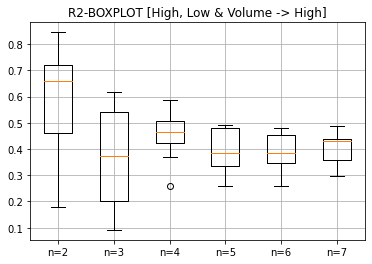

In [11]:
import matplotlib.pyplot as plt
# experiment data
R2=[0.8035, 0.8452, 0.6281, 0.7267, 0.4981, 0.3669, 0.7072, 0.6915, 0.1806, 0.4512]
R3=[0.5723, 0.5963, 0.6183, 0.1488, 0.3252, 0.4439, 0.0916, 0.1849, 0.2512, 0.4209]
R4=[0.5812, 0.414, 0.446, 0.369, 0.4887, 0.5148, 0.2596, 0.5869, 0.4591, 0.4677]
R5=[0.4856, 0.3821, 0.4803, 0.3869, 0.3688, 0.3245, 0.2588, 0.4919, 0.4748, 0.2593]
R6=[0.4789, 0.356, 0.474, 0.3113, 0.2588, 0.3435, 0.4176, 0.4632, 0.372, 0.4013]
R7=[0.4338, 0.4888, 0.4399, 0.4526, 0.3819, 0.2961, 0.4254, 0.3518, 0.3427, 0.4374]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT [High, Low & Volume -> High]')
plt.grid()
plt.show()

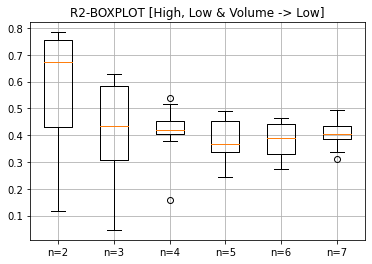

In [12]:
import matplotlib.pyplot as plt
# experiment data
R2=[0.7808, 0.7557, 0.6275, 0.7839, 0.3071, 0.4306, 0.7535, 0.7207, 0.1184, 0.4325]
R3=[0.5762, 0.5927, 0.6296, 0.0462, 0.4489, 0.4179, 0.2753, 0.5857, 0.2248, 0.3981]
R4=[0.5399, 0.4136, 0.5166, 0.3791, 0.4319, 0.4025, 0.1594, 0.4231, 0.4582, 0.4181]
R5=[0.4743, 0.3353, 0.3618, 0.3362, 0.3707, 0.4563, 0.2827, 0.4902, 0.4357, 0.2445]
R6=[0.3927, 0.3888, 0.4633, 0.2739, 0.3269, 0.3372, 0.4458, 0.4413, 0.313, 0.4382]
R7=[0.3894, 0.4029, 0.4407, 0.4024, 0.479, 0.3098, 0.4923, 0.3352, 0.3852, 0.4177]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT [High, Low & Volume -> Low]')
plt.grid()
plt.show()

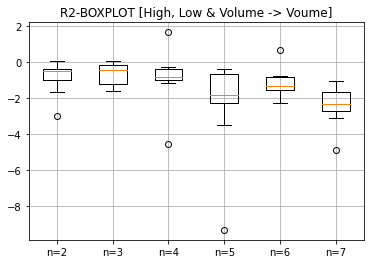

In [13]:
import matplotlib.pyplot as plt
# experiment data
R2=[-0.0357, -0.4409, -2.9931, 0.0654, -0.4821, -0.7905, -0.3591, -1.0482, -1.6699, -0.4704]
R3=[-0.3549, 0.0718, -0.1785, -0.6222, -0.0495, -1.6218, -1.4619, -0.5258, -1.4238, -0.1148]
R4=[-0.2646, -0.9777, 1.6724, -0.7675, -1.1487, -0.9416, -4.5692, -0.8396, -0.2373, -0.7793]
R5=[0-2.2527, -3.4678, -1.659, -0.5806, -0.4001, -2.273, -1.9919, -0.616, -0.7833, -9.3298]
R6=[-0.806, -0.7452, -1.4859, -1.7108, -0.8788, 0.6752, -1.1875, -2.2633, -1.5965, -1.4358]
R7=[-4.9041, -2.0515, -2.1309, -2.4646, -1.417, -2.6222, -1.5278, -3.1101, -1.0176, -2.7113]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT [High, Low & Volume -> Voume]')
plt.grid()
plt.show()

# High & Volume -> High & Volume

1回目
[Arguments]
num_company=2社 ['Seven & I Holdings (Japan)', 'Walgreens Boots Alliance (USA)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.7604
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 0.3868
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.3116
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.2621
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.2517
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.2135
Epoch 7/50
22/22 [==============================] - 0s 14ms/step - loss: 0.1757
Epoch 8/50
22/22 [============

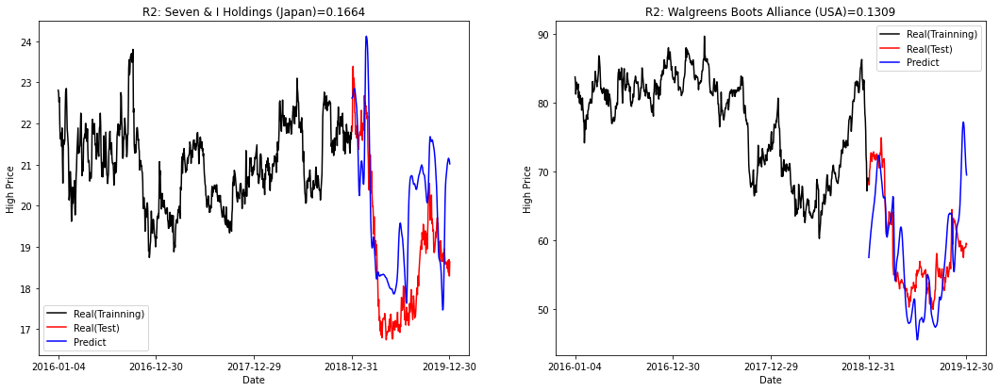

R2-2companies_average=0.1487
R2_scores_lists=[0.1664, 0.1309, 0.1487]

[Arguments]
num_company=2社 ['Seven & I Holdings (Japan)', 'Walgreens Boots Alliance (USA)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 14ms/step - loss: 0.8233
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7290
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8381
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 1.9082
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.6765
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8387
Epoch 7/50
22/22 [=======================

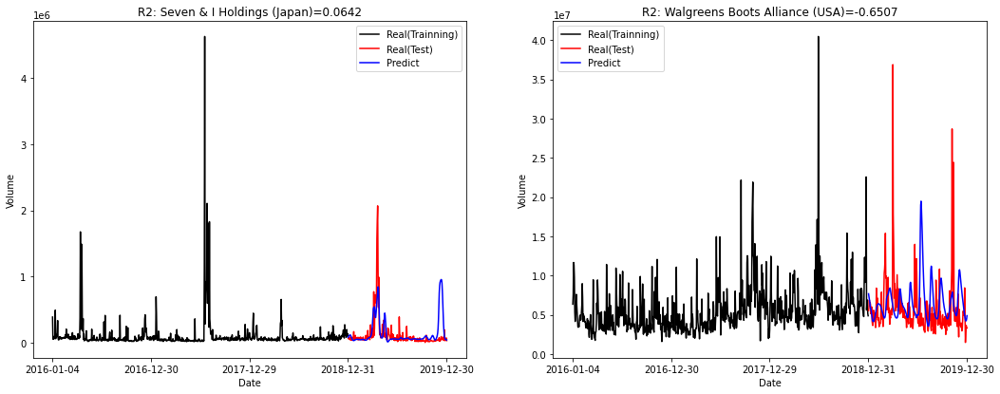

R2-2companies_average=-0.2933
R2_scores_lists=[0.0642, -0.6507, -0.2933]

2回目
[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Coop Group (Switzerland)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.4969
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1577
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1220
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1200
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1093
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1022
Epoch 7/50
22/22 [==============================

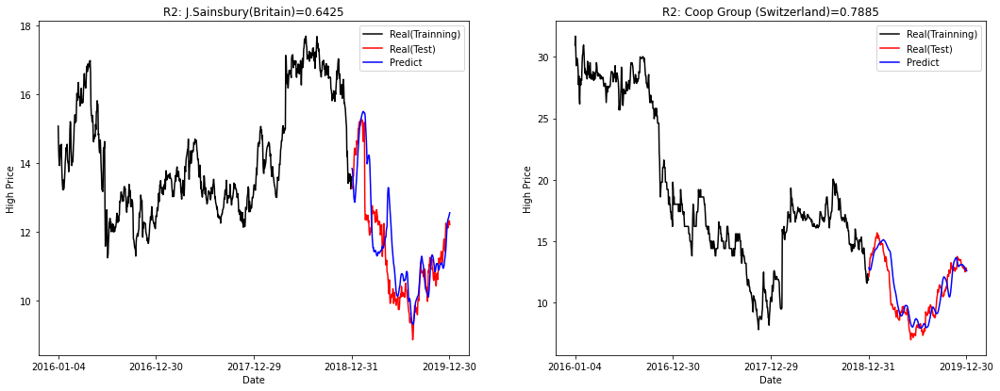

R2-2companies_average=0.7155
R2_scores_lists=[0.6425, 0.7885, 0.7155]

[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Coop Group (Switzerland)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.5699
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 1.7473
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 2.1620
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7265
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.3346
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7253
Epoch 7/50
22/22 [==============================] - 0

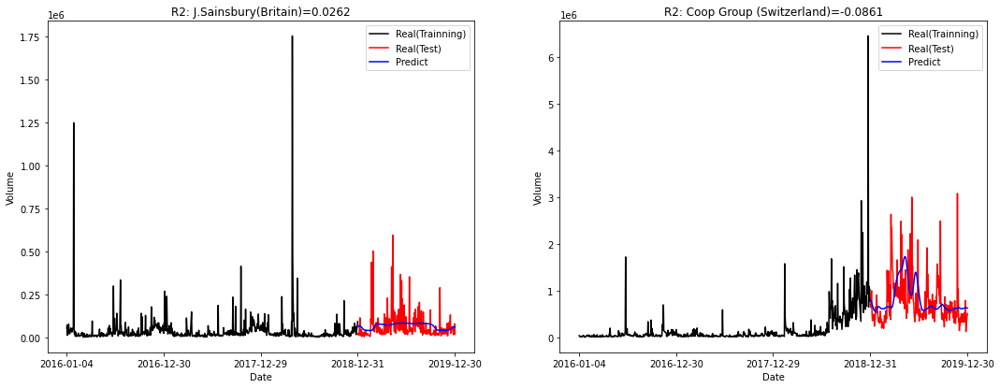

R2-2companies_average=-0.0299
R2_scores_lists=[0.0262, -0.0861, -0.0299]

3回目
[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Metro (Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 14ms/step - loss: 0.4528
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1466
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.1171
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1007
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1015
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0897
Epoch 7/50
22/22 [==============================] - 0s 15m

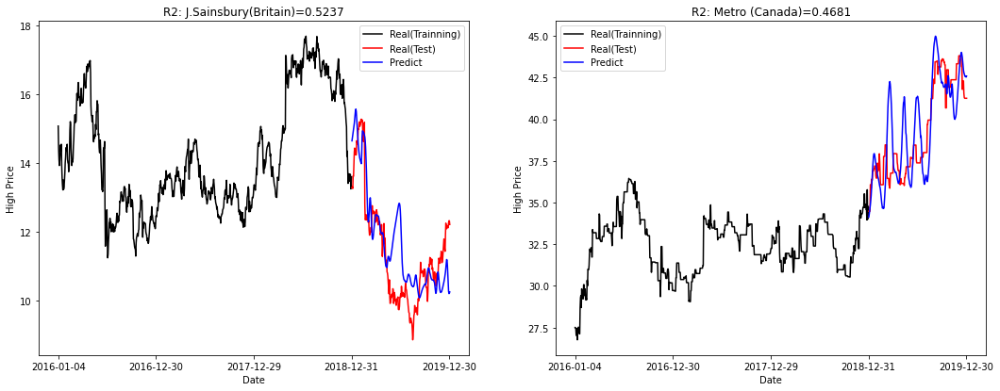

R2-2companies_average=0.4959
R2_scores_lists=[0.5237, 0.4681, 0.4959]

[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Metro (Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.5998
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7832
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8008
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 1.6197
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8697
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.4036
Epoch 7/50
22/22 [==============================] - 0s 15ms/ste

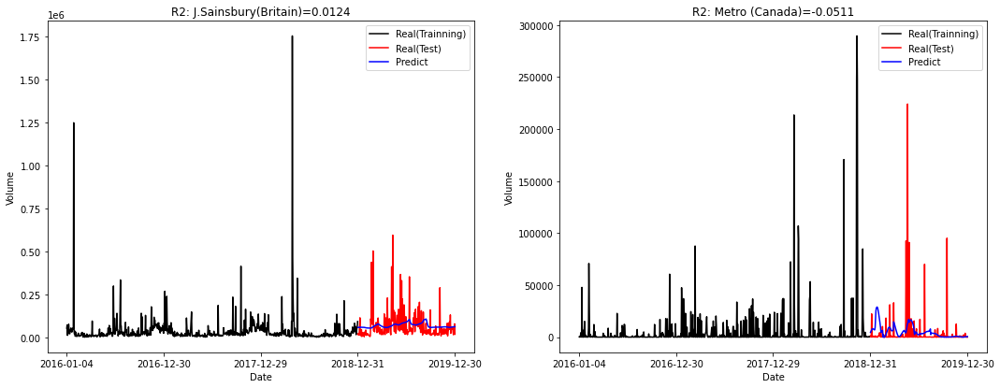

R2-2companies_average=-0.0193
R2_scores_lists=[0.0124, -0.0511, -0.0193]

4回目
[Arguments]
num_company=2社 ['Tesco(Britain)', 'AEON(Japan)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.4178
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1013
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0843
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.0744
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.0635
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0542
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - 

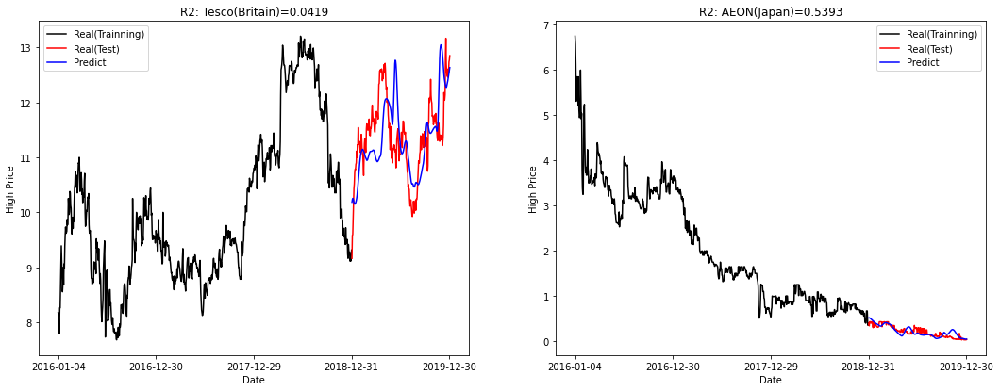

R2-2companies_average=0.2906
R2_scores_lists=[0.0419, 0.5393, 0.2906]

[Arguments]
num_company=2社 ['Tesco(Britain)', 'AEON(Japan)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.9797
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7472
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 1.2317
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8843
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8374
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8213
Epoch 7/50
22/22 [==============================] - 0s 16ms/step - loss:

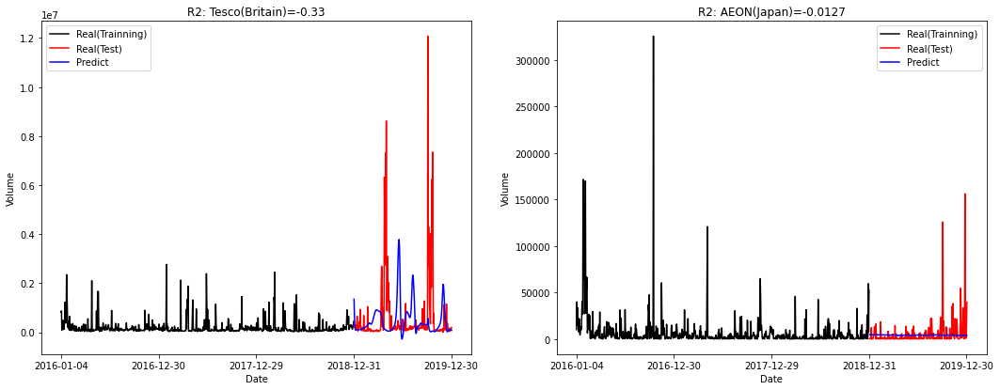

R2-2companies_average=-0.1713
R2_scores_lists=[-0.33, -0.0127, -0.1713]

5回目
[Arguments]
num_company=2社 ['Seven & I Holdings (Japan)', 'George Weston(Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.7090
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.3883
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.3158
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.2609
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.2279
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2105
Epoch 7/50
22/22 [============================

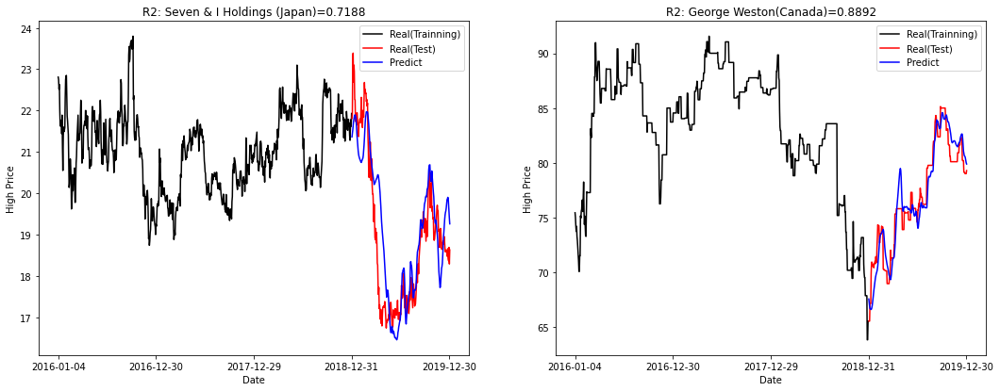

R2-2companies_average=0.804
R2_scores_lists=[0.7188, 0.8892, 0.804]

[Arguments]
num_company=2社 ['Seven & I Holdings (Japan)', 'George Weston(Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 15ms/step - loss: 1.2460
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8956
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.4844
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 2.0419
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 1.5401
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 2.0179
Epoch 7/50
22/22 [==============================] - 

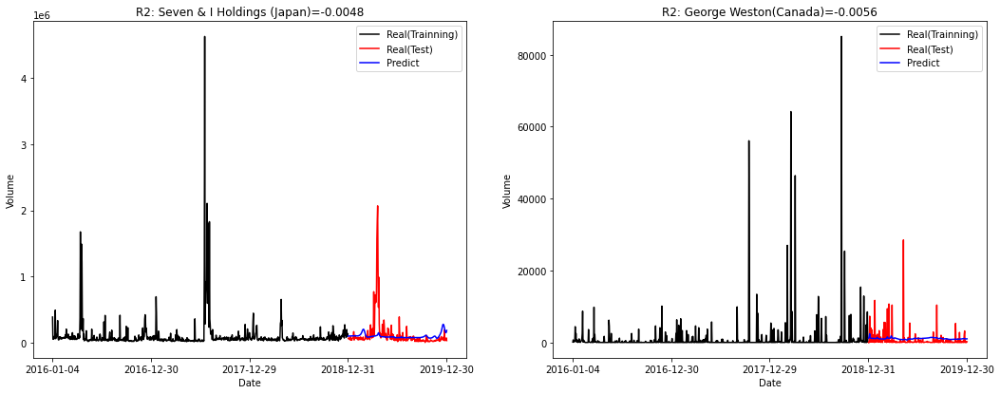

R2-2companies_average=-0.0052
R2_scores_lists=[-0.0048, -0.0056, -0.0052]

6回目
[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.4788
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1474
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1182
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1157
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1158
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0937
Epoch 7/50
22/22 [====================

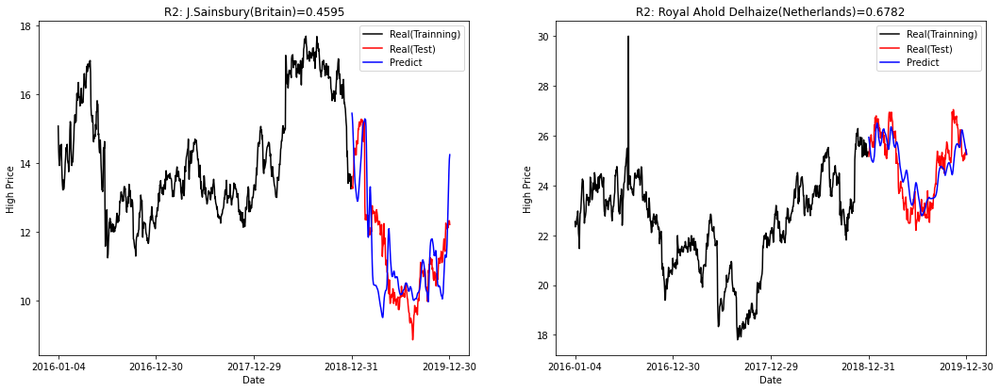

R2-2companies_average=0.5689
R2_scores_lists=[0.4595, 0.6782, 0.5689]

[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.8388
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 1.2778
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6413
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3331
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 1.0927
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9841
Epoch 7/50
22/22 [==========================

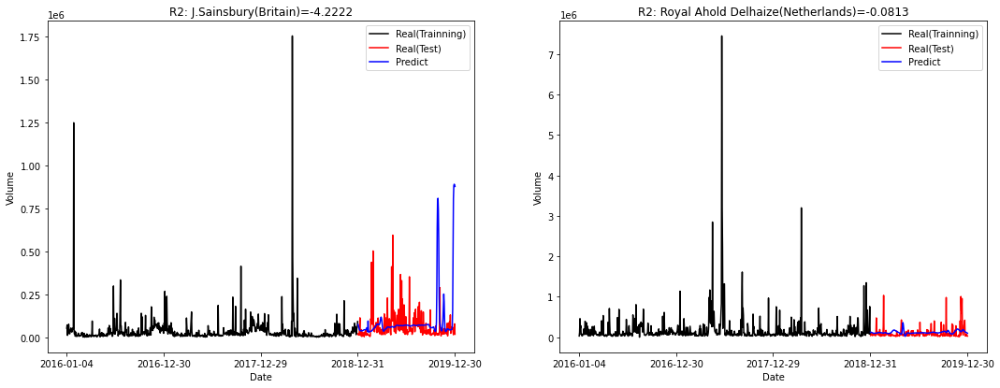

R2-2companies_average=-2.1518
R2_scores_lists=[-4.2222, -0.0813, -2.1518]

7回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'Kroger(USA)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 15ms/step - loss: 0.4261
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.2077
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1833
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1609
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1279
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1165
Epoch 7/50
22/22 [==============================] - 0s 16ms/step -

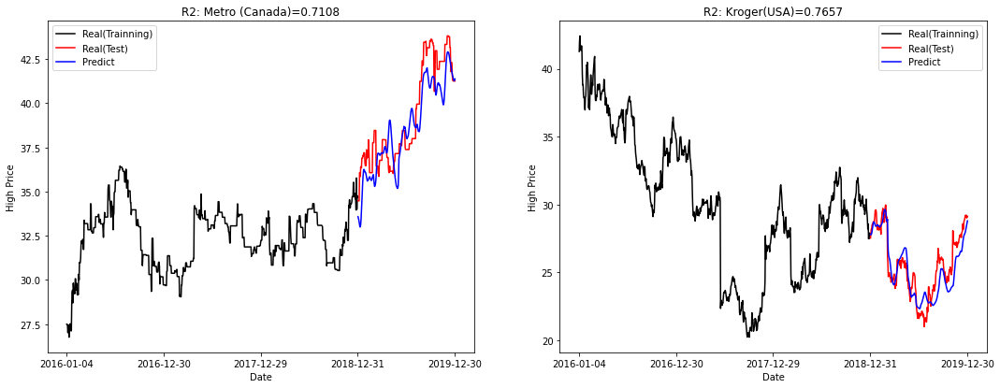

R2-2companies_average=0.7382
R2_scores_lists=[0.7108, 0.7657, 0.7382]

[Arguments]
num_company=2社 ['Metro (Canada)', 'Kroger(USA)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 1.2640
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.5545
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6509
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9002
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 1.0244
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 1.1547
Epoch 7/50
22/22 [==============================] - 0s 18ms/step - loss:

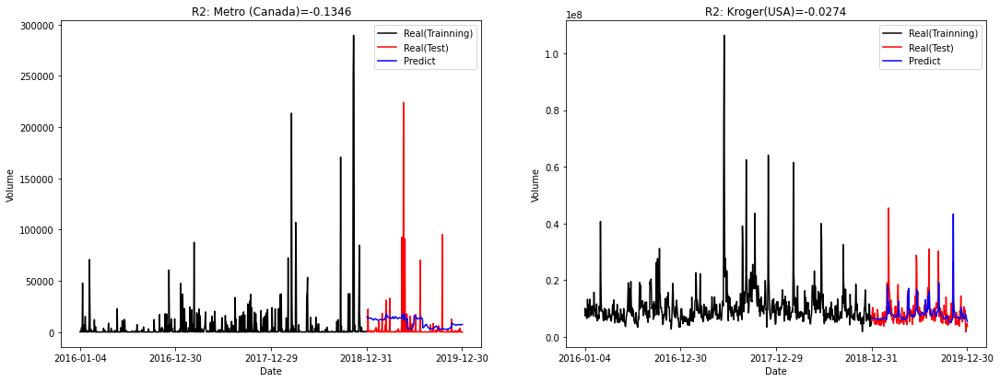

R2-2companies_average=-0.081
R2_scores_lists=[-0.1346, -0.0274, -0.081]

8回目
[Arguments]
num_company=2社 ['Seven & I Holdings (Japan)', 'George Weston(Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.7127
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3746
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2878
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2674
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2528
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2064
Epoch 7/50
22/22 [============================

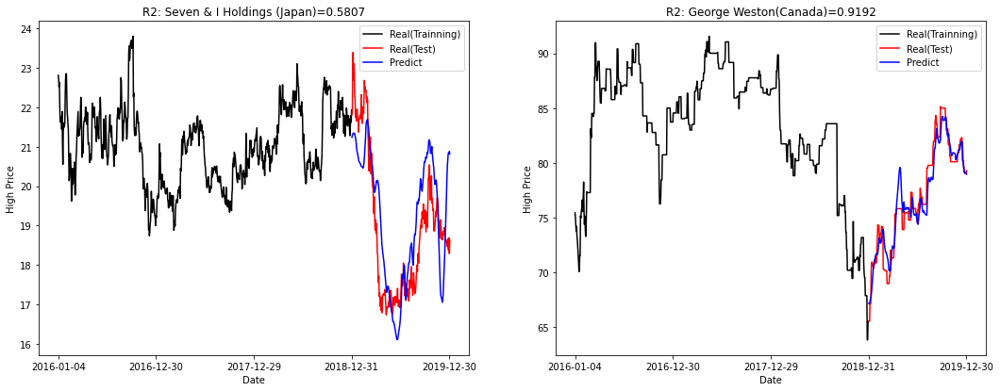

R2-2companies_average=0.75
R2_scores_lists=[0.5807, 0.9192, 0.75]

[Arguments]
num_company=2社 ['Seven & I Holdings (Japan)', 'George Weston(Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 17ms/step - loss: 0.4430
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7573
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6306
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.4538
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.3746
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8028
Epoch 7/50
22/22 [==============================] - 0s

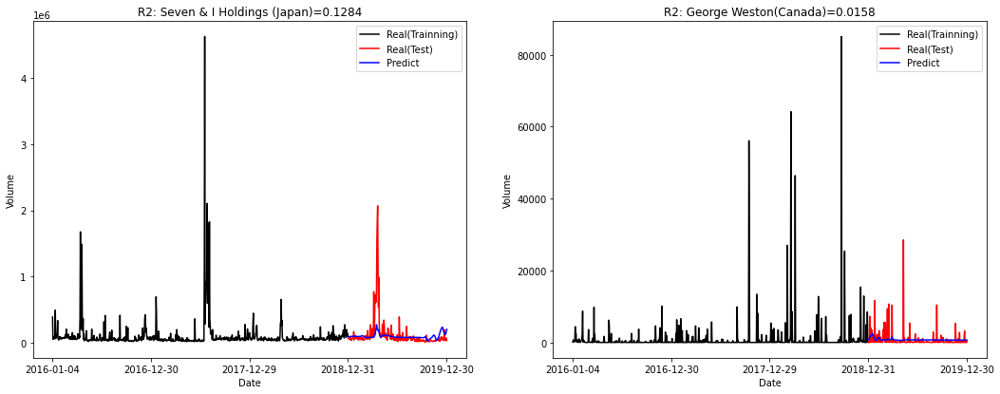

R2-2companies_average=0.0721
R2_scores_lists=[0.1284, 0.0158, 0.0721]

9回目
[Arguments]
num_company=2社 ['Walgreens Boots Alliance (USA)', 'Metro (Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.5753
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1452
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0965
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.0931
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0774
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.0808
Epoch 7/50
22/22 [==============================] -

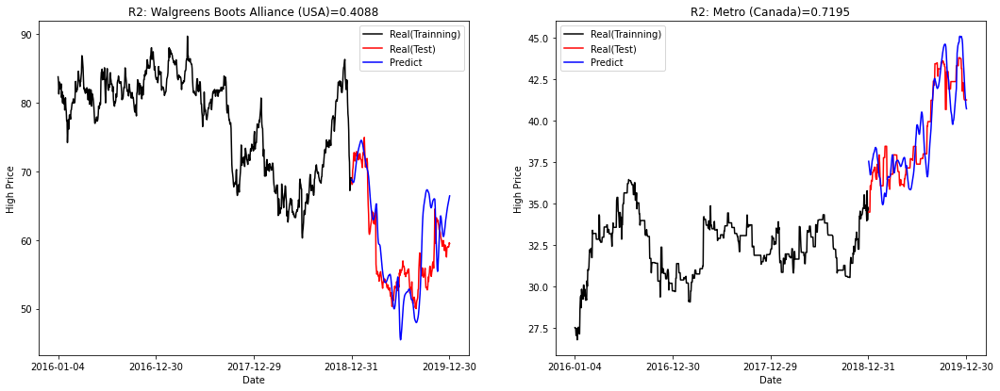

R2-2companies_average=0.5642
R2_scores_lists=[0.4088, 0.7195, 0.5642]

[Arguments]
num_company=2社 ['Walgreens Boots Alliance (USA)', 'Metro (Canada)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 17ms/step - loss: 1.0222
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8333
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8601
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8297
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8974
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1920
Epoch 7/50
22/22 [==============================] - 0

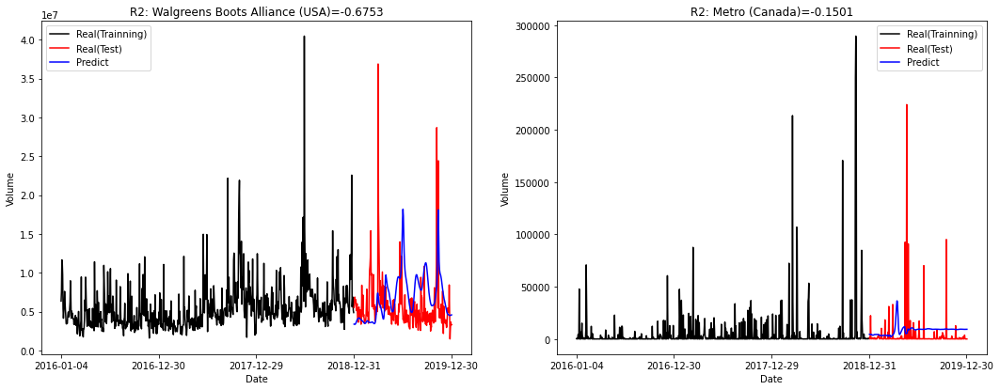

R2-2companies_average=-0.4127
R2_scores_lists=[-0.6753, -0.1501, -0.4127]

10回目
[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Seven & I Holdings (Japan)']
input_variables=['High', 'Volume'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[0, 2], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.5627
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1634
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1239
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.1250
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1008
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1014
Epoch 7/50
22/22 [==========================

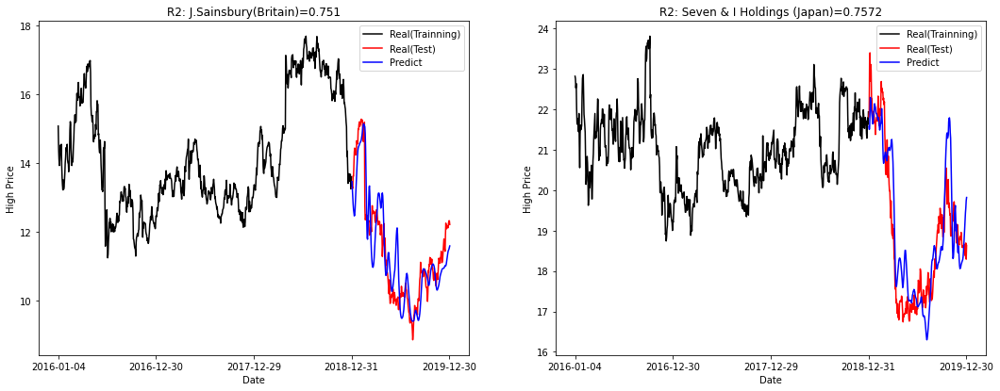

R2-2companies_average=0.7541
R2_scores_lists=[0.751, 0.7572, 0.7541]

[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Seven & I Holdings (Japan)']
input_variables=['High', 'Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 2)
training_set_all=(754, 4)
concat=(754, 4)
index=[1, 3], len=2
X_train=(694, 60, 4), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.5845
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 1.0701
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3401
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 1.3726
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 1.1699
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.2815
Epoch 7/50
22/22 [==============================] - 

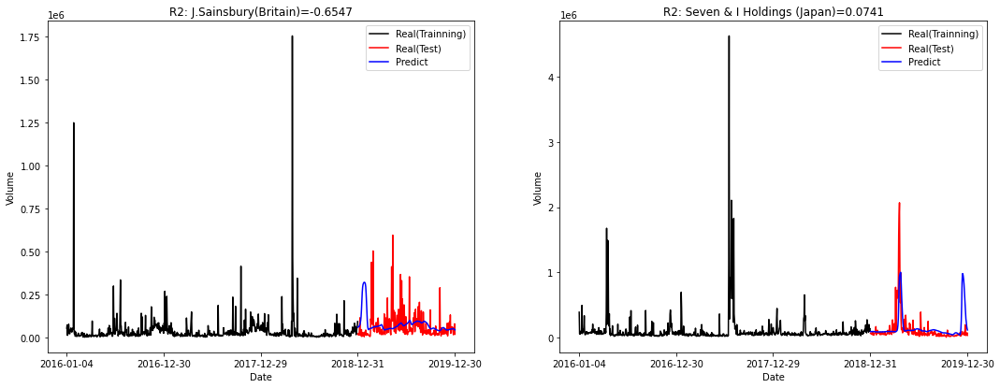

R2-2companies_average=-0.2903
R2_scores_lists=[-0.6547, 0.0741, -0.2903]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=2, input_category=['High', 'Volume'], input_vars=[2, 6], output_category=['High', 'Volume'], 
                    output_vars=[2, 6], outputs_company=2, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=3, input_category=['High', 'Volume'], input_vars=[2, 6], output_category=['High', 'Volume'], 
                    output_vars=[2, 6], outputs_company=3, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=4, input_category=['High', 'Volume'], input_vars=[2, 6], output_category=['High', 'Volume'], 
                    output_vars=[2, 6], outputs_company=4, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [7]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=5, input_category=['High', 'Volume'], input_vars=[2, 6], output_category=['High', 'Volume'], 
                    output_vars=[2, 6], outputs_company=5, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [8]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=6, input_category=['High', 'Volume'], input_vars=[2, 6], output_category=['High', 'Volume'], 
                    output_vars=[2, 6], outputs_company=6, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [9]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=7, input_category=['High', 'Volume'], input_vars=[2, 6], output_category=['High', 'Volume'], 
                    output_vars=[2, 6], outputs_company=7, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=True)

Output hidden; open in https://colab.research.google.com to view.

# Result(High & Volume -> High & Volume)

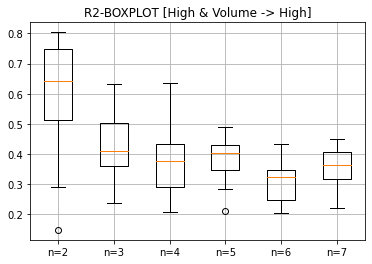

In [8]:
import matplotlib.pyplot as plt
# experiment data
R2=[0.1487, 0.7155, 0.4959, 0.2906, 0.804, 0.5689, 0.7382, 0.75, 0.5642, 0.7541]
R3=[0.458, 0.2364, 0.261, 0.5203, 0.3815, 0.4192, 0.6281, 0.6333, 0.3545, 0.3987]
R4=[0.5348, 0.281, 0.6353, 0.2617, 0.4105, 0.4113, 0.441, 0.3435, 0.3264, 0.2094]
R5=[0.442, 0.331, 0.3933, 0.4383, 0.4092, 0.4048, 0.2849, 0.4902, 0.4052, 0.2104]
R6=[0.2528, 0.3304, 0.2444, 0.4332, 0.4349, 0.3544, 0.3276, 0.2154, 0.2044, 0.3183]
R7=[0.3971, 0.3839, 0.3335, 0.2635, 0.4512, 0.3444, 0.4122, 0.3115, 0.2197, 0.4132]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT [High & Volume -> High]')
plt.grid()
plt.show()

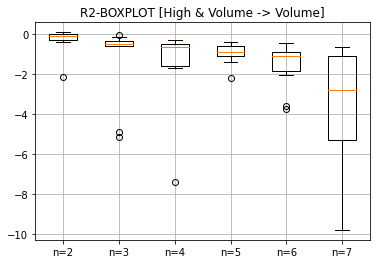

In [9]:
import matplotlib.pyplot as plt
# experiment data
R2=[-0.2933, -0.0299, -0.0193, -0.1713, -0.0052, -2.1518, -0.081, 0.0721, -0.4127, -0.2903]
R3=[-5.1574, -0.5339, -0.5961, -0.0418, -0.3579, -0.4347, -0.5725, -4.9211, -0.4888, -0.1847]
R4=[-1.5542, -1.636, -0.5169, -1.6938, -0.7005, -7.3918, -0.3038, -0.552, -0.5812, -0.4922]
R5=[-1.1183, -0.5695, -0.5056, -0.9602, -2.2208, -1.0966, -1.4223, -0.6793, -0.8826, -0.4133]
R6=[-3.627, -0.6546, -1.1832, -0.9277, -0.909, -0.4802, -3.7297, -2.0538, -1.0449, -1.2089]
R7=[-0.6404, -5.5089, -4.6011, -5.5863, -1.3448, -1.0428, -9.7759, -2.8225, -0.8988, -2.8105]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT [High & Volume -> Volume]')
plt.grid()
plt.show()

# High -> High 

1回目
[Arguments]
num_company=2社 ['J.Sainsbury(Britain)', 'Tesco(Britain)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 17ms/step - loss: 0.4537
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1403
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1174
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1177
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.1112
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1051
Epoch 7/50
22/22 [==============================] - 0s 16ms/step - loss: 0.0967
Epoch 8/50
22/22 [==============================] - 0s 17ms/step - loss: 0.

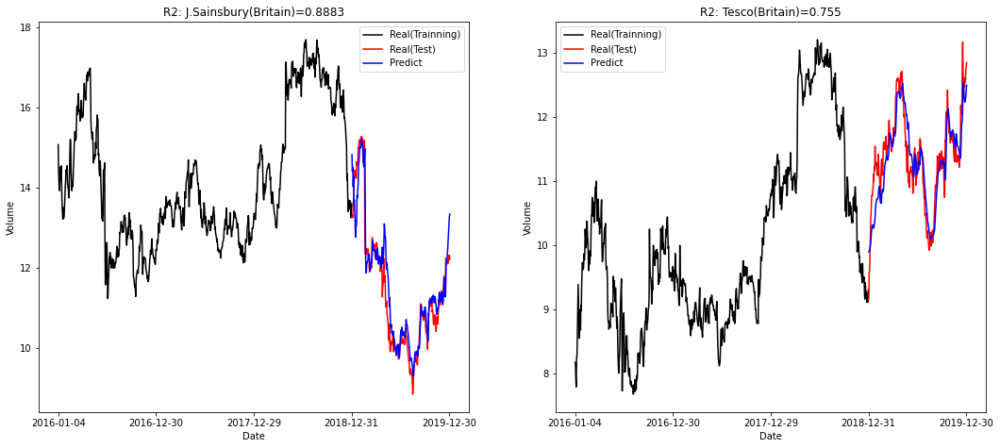

R2-2companies_average=0.8217
R2_scores_lists=[0.8883, 0.755, 0.8217]

2回目
[Arguments]
num_company=2社 ['Coop Group (Switzerland)', 'Seven & I Holdings (Japan)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 17ms/step - loss: 0.3766
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0713
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0582
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0458
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0483
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0451
Epoch 7/50
22/22 [==============================] - 0s 17ms/step - lo

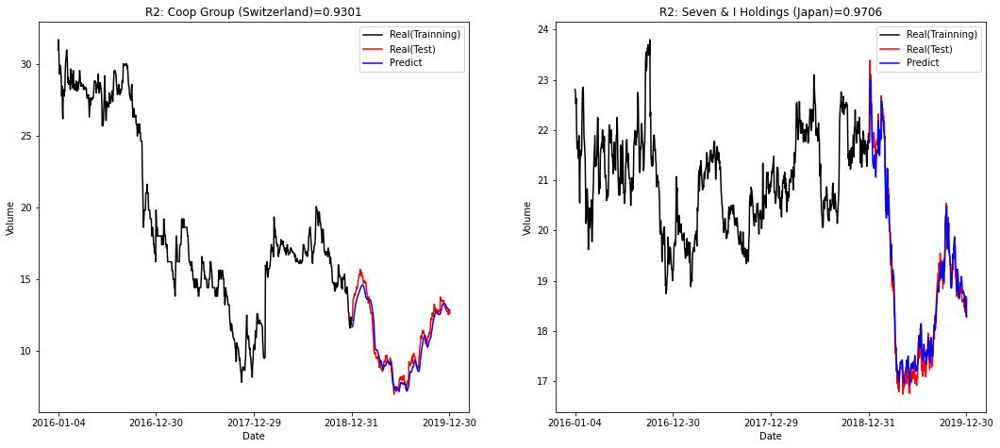

R2-2companies_average=0.9503
R2_scores_lists=[0.9301, 0.9706, 0.9503]

3回目
[Arguments]
num_company=2社 ['Kroger(USA)', 'Walgreens Boots Alliance (USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.4268
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1203
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0976
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0879
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0769
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0670
Epoch 7/50
22/22 [==============================] - 0s 17ms/step - loss: 0.07

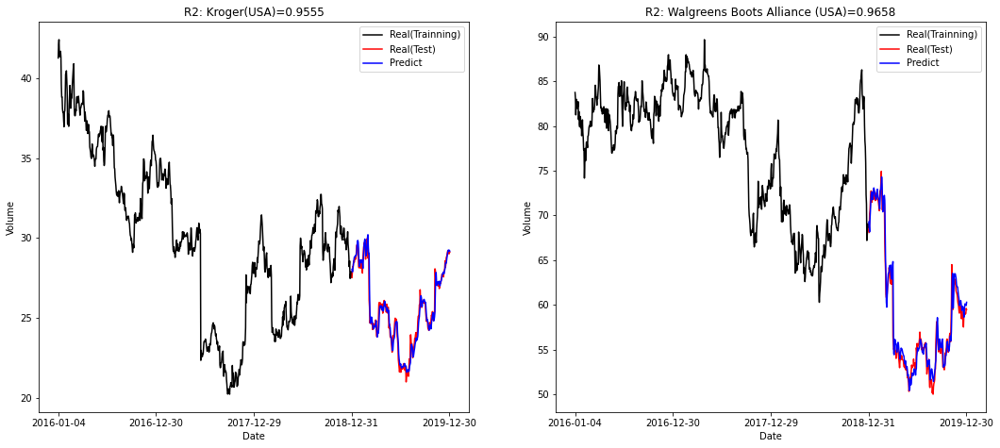

R2-2companies_average=0.9607
R2_scores_lists=[0.9555, 0.9658, 0.9607]

4回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'George Weston(Canada)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 8s 18ms/step - loss: 0.5040
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1987
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1826
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1585
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1749
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1468
Epoch 7/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1328
Epo

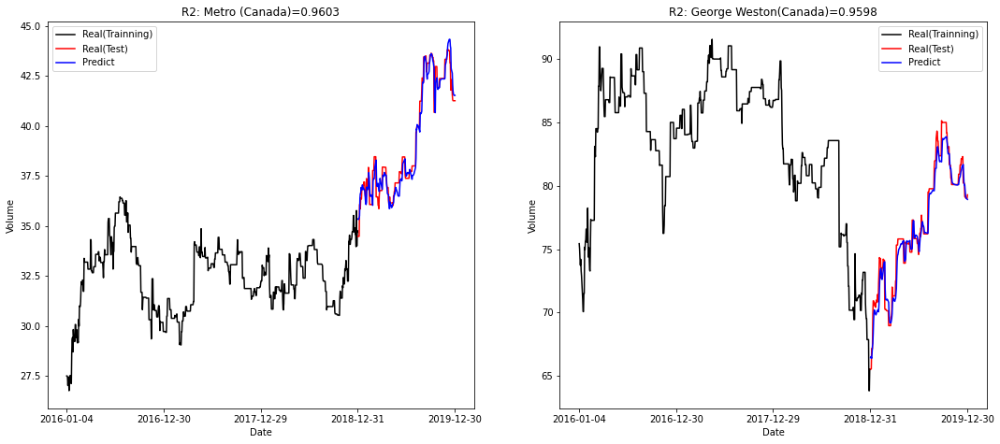

R2-2companies_average=0.96
R2_scores_lists=[0.9603, 0.9598, 0.96]

5回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'Carrefour(France)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 0.3921
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.2021
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1773
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1662
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1693
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1506
Epoch 7/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1368
Epoch 8/50


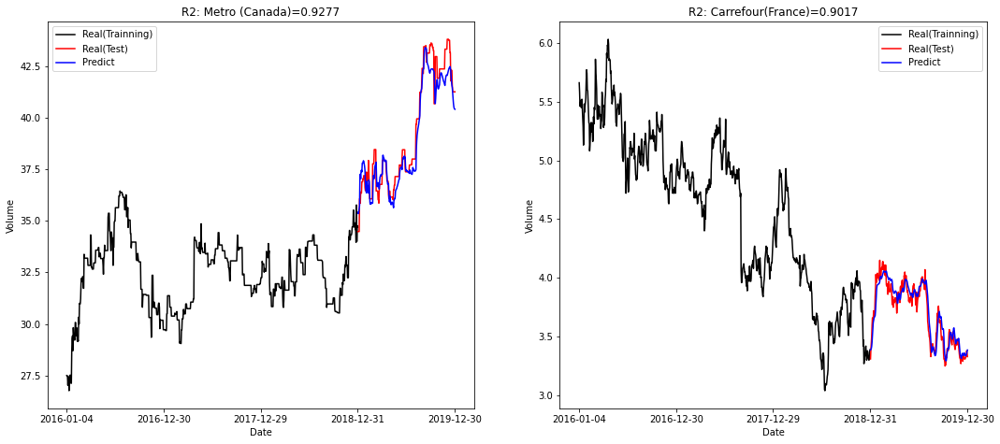

R2-2companies_average=0.9147
R2_scores_lists=[0.9277, 0.9017, 0.9147]

6回目
[Arguments]
num_company=2社 ['Coop Group (Switzerland)', 'Walgreens Boots Alliance (USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 8s 19ms/step - loss: 0.3616
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0664
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0595
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0573
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0630
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0502
Epoch 7/50
22/22 [==============================] - 0s 19ms/step

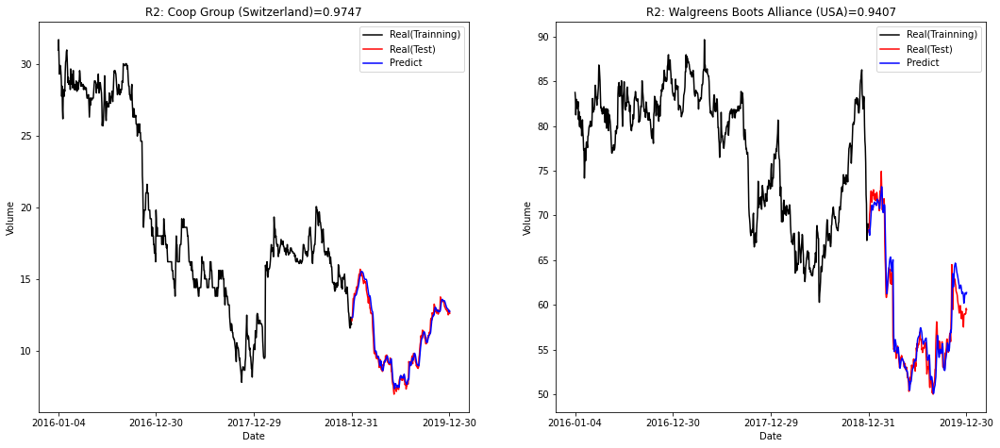

R2-2companies_average=0.9577
R2_scores_lists=[0.9747, 0.9407, 0.9577]

7回目
[Arguments]
num_company=2社 ['Kroger(USA)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 0.3019
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0865
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0888
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0755
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0693
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0657
Epoch 7/50
22/22 [==============================] - 0s 19ms/step - loss: 0

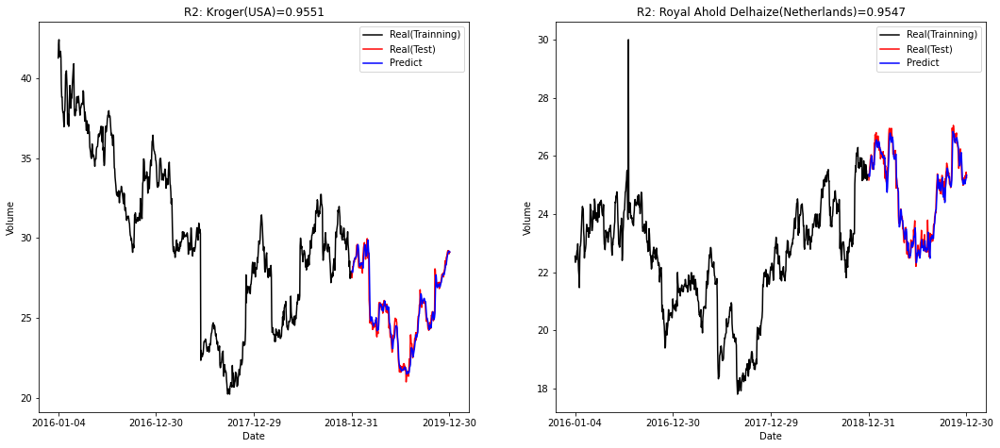

R2-2companies_average=0.9549
R2_scores_lists=[0.9551, 0.9547, 0.9549]

8回目
[Arguments]
num_company=2社 ['Coop Group (Switzerland)', 'Kroger(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 8s 20ms/step - loss: 0.4159
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0814
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0525
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0524
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0467
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0506
Epoch 7/50
22/22 [==============================] - 0s 21ms/step - loss: 0.0468
Epo

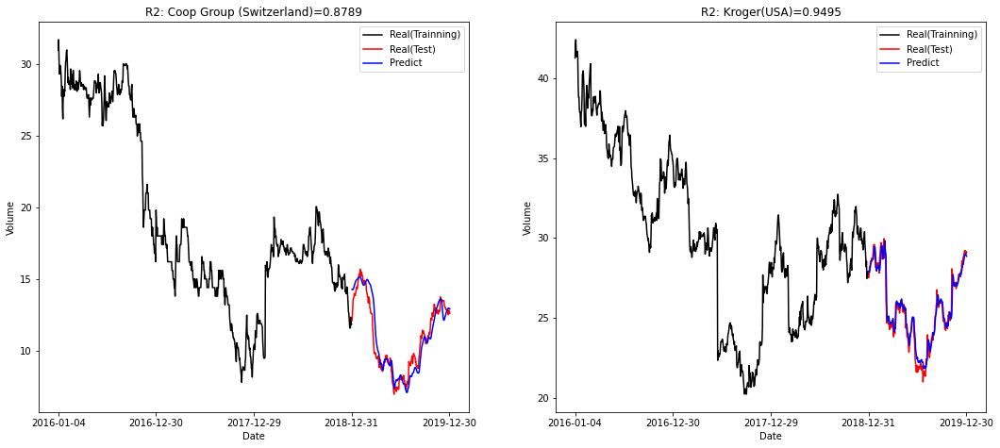

R2-2companies_average=0.9142
R2_scores_lists=[0.8789, 0.9495, 0.9142]

9回目
[Arguments]
num_company=2社 ['Royal Ahold Delhaize(Netherlands)', 'Tesco(Britain)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 0.4793
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.2039
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1505
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1742
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1365
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1110
Epoch 7/50
22/22 [==============================] - 0s 20ms/step - loss

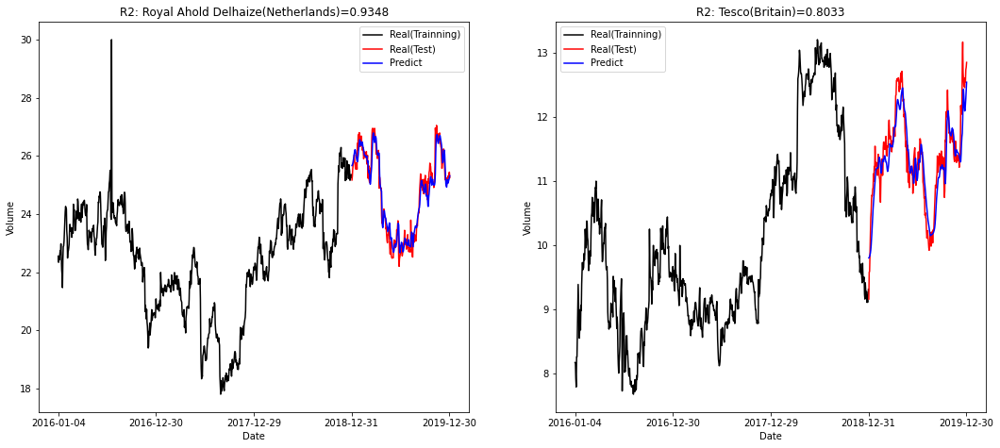

R2-2companies_average=0.8691
R2_scores_lists=[0.9348, 0.8033, 0.8691]

10回目
[Arguments]
num_company=2社 ['AEON(Japan)', 'Kroger(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 7s 21ms/step - loss: 0.2572
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0570
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0470
Epoch 4/50
22/22 [==============================] - 0s 21ms/step - loss: 0.0478
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0426
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0318
Epoch 7/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0418
Epoch 8/50
22/2

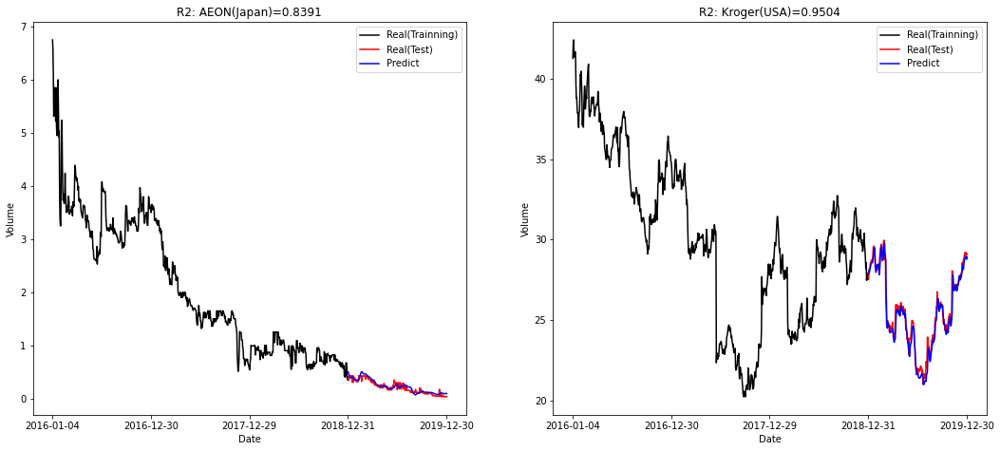

R2-2companies_average=0.8948
R2_scores_lists=[0.8391, 0.9504, 0.8948]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=2, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=2, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

1回目
[Arguments]
num_company=3社 ['Tesco(Britain)', 'Walgreens Boots Alliance (USA)', 'George Weston(Canada)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.4048
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0876
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0724
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0705
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.0748
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0557
Epoch 7/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0697
Epoch 8/50
22/22 [===================

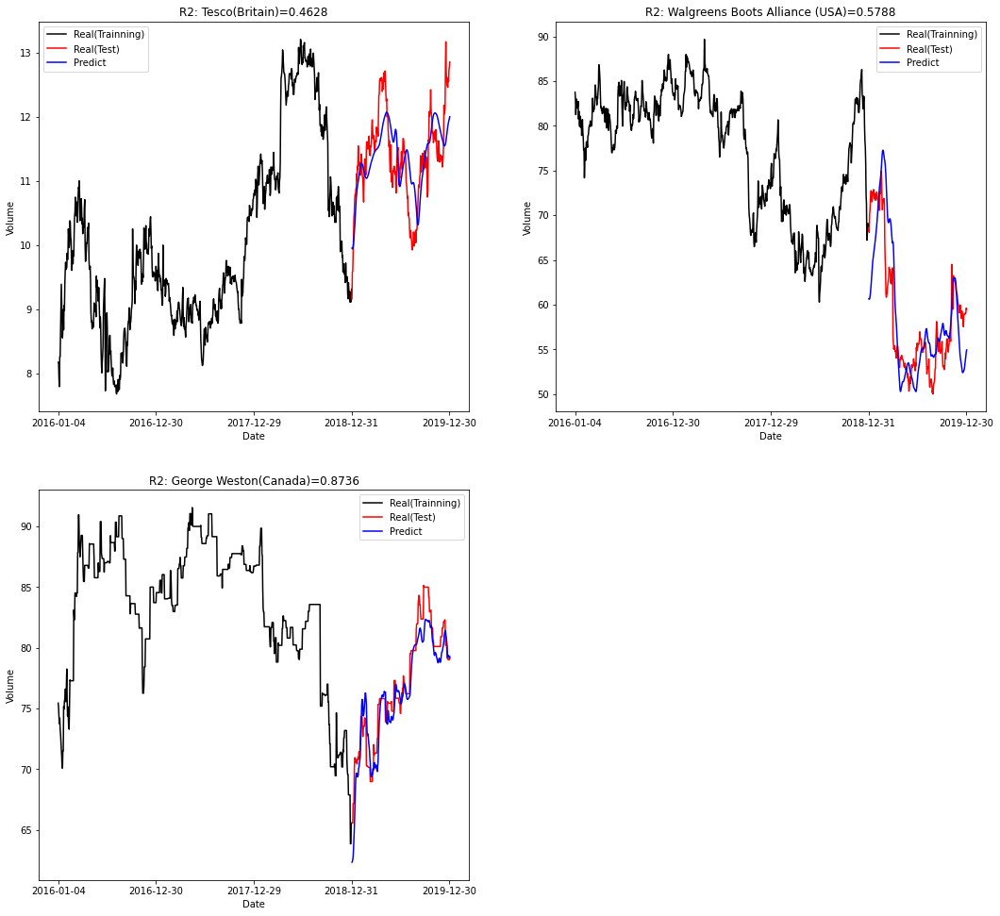

R2-3companies_average=0.6384
R2_scores_lists=[0.4628, 0.5788, 0.8736, 0.6384]

2回目
[Arguments]
num_company=3社 ['J.Sainsbury(Britain)', 'AEON(Japan)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.5010
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1862
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1284
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0945
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1060
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0960
Epoch 7/50
22/22 [=====================

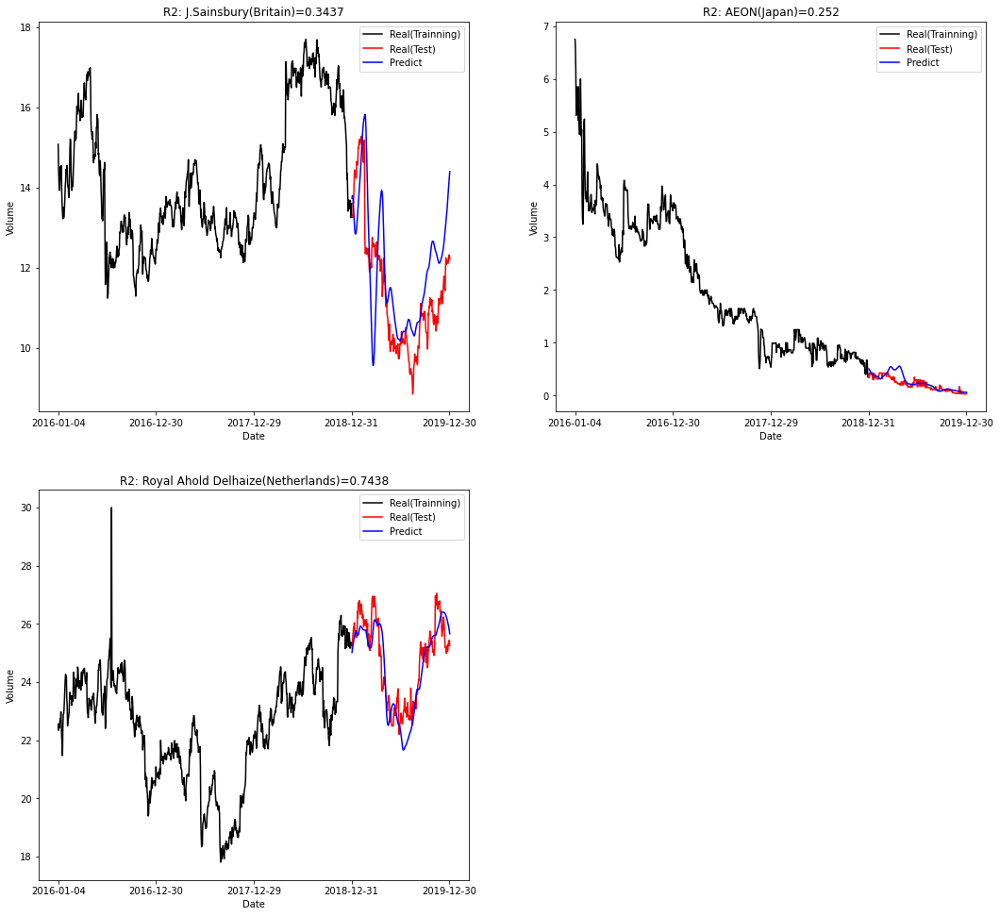

R2-3companies_average=0.4465
R2_scores_lists=[0.3437, 0.252, 0.7438, 0.4465]

3回目
[Arguments]
num_company=3社 ['J.Sainsbury(Britain)', 'Royal Ahold Delhaize(Netherlands)', 'George Weston(Canada)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 19ms/step - loss: 0.5045
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1579
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1147
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1096
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0990
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0912
Epoch 7/50
22/22 [============

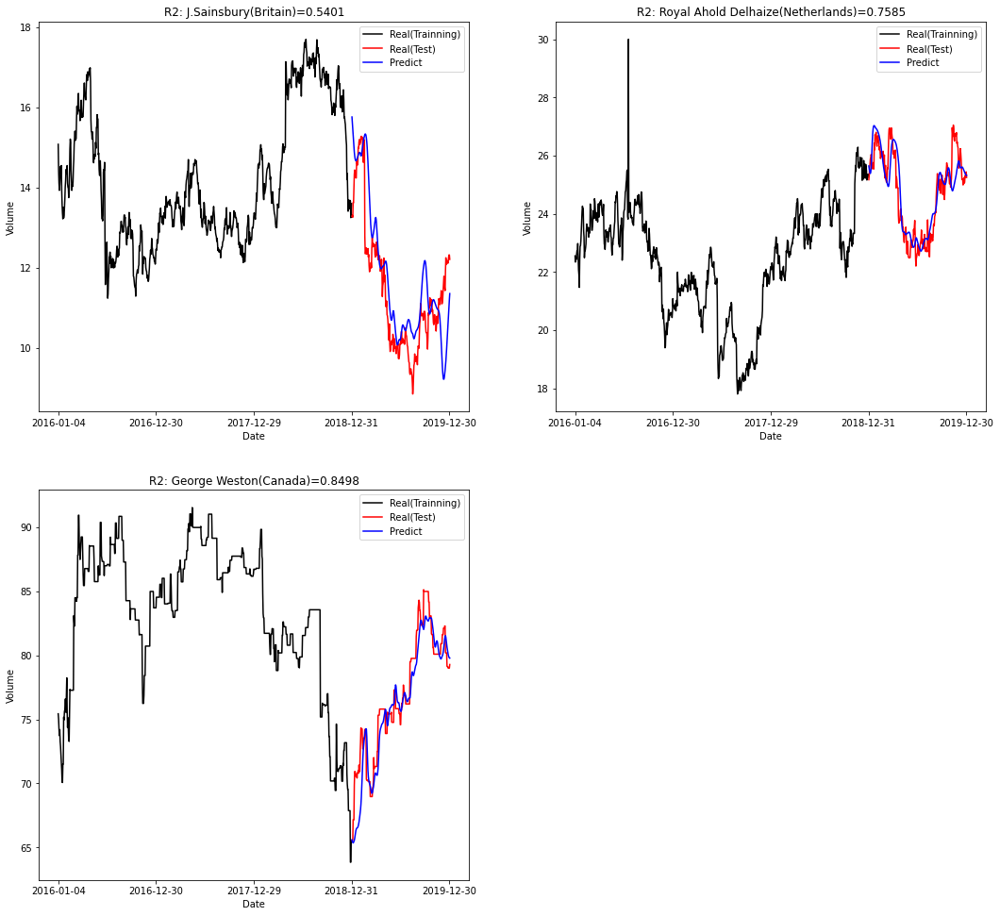

R2-3companies_average=0.7161
R2_scores_lists=[0.5401, 0.7585, 0.8498, 0.7161]

4回目
[Arguments]
num_company=3社 ['Metro (Canada)', 'Kroger(USA)', 'Tesco(Britain)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.4971
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1836
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1846
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1594
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1538
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1393
Epoch 7/50
22/22 [==============================] - 0s 18ms/step

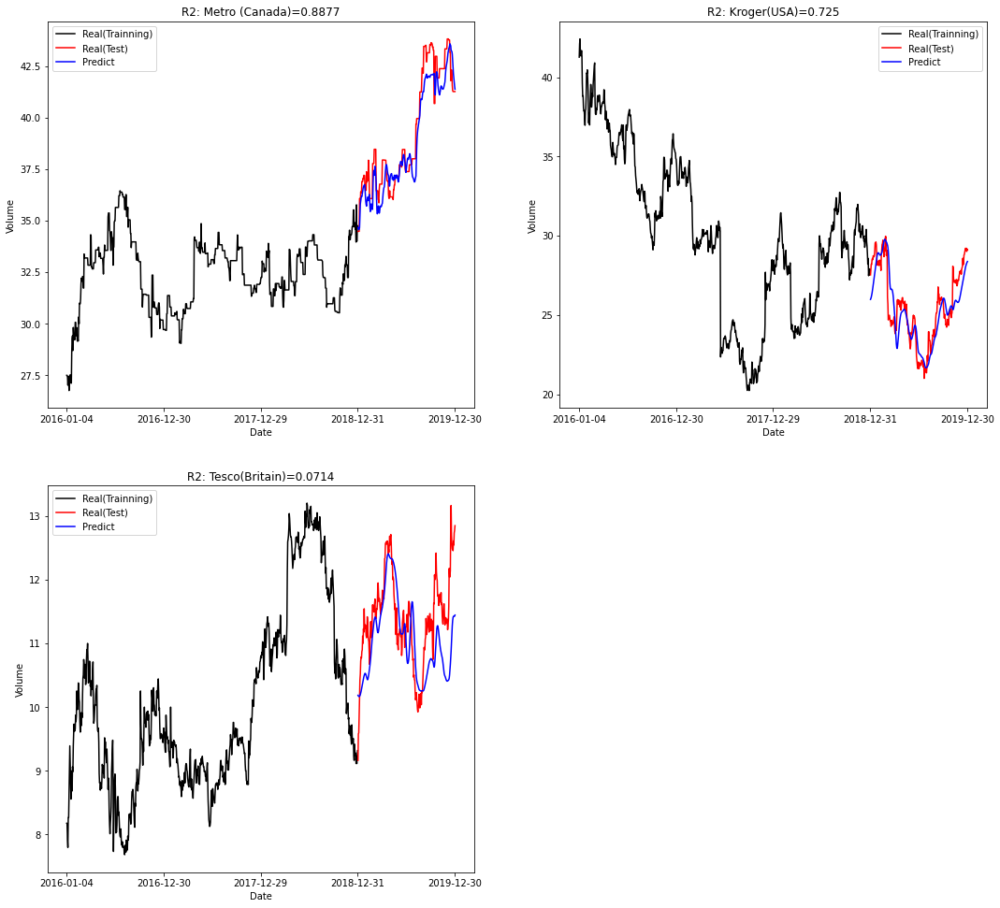

R2-3companies_average=0.5614
R2_scores_lists=[0.8877, 0.725, 0.0714, 0.5614]

5回目
[Arguments]
num_company=3社 ['Metro (Canada)', 'Seven & I Holdings (Japan)', 'George Weston(Canada)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.4869
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1818
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1722
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1569
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1707
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1213
Epoch 7/50
22/22 [=========================

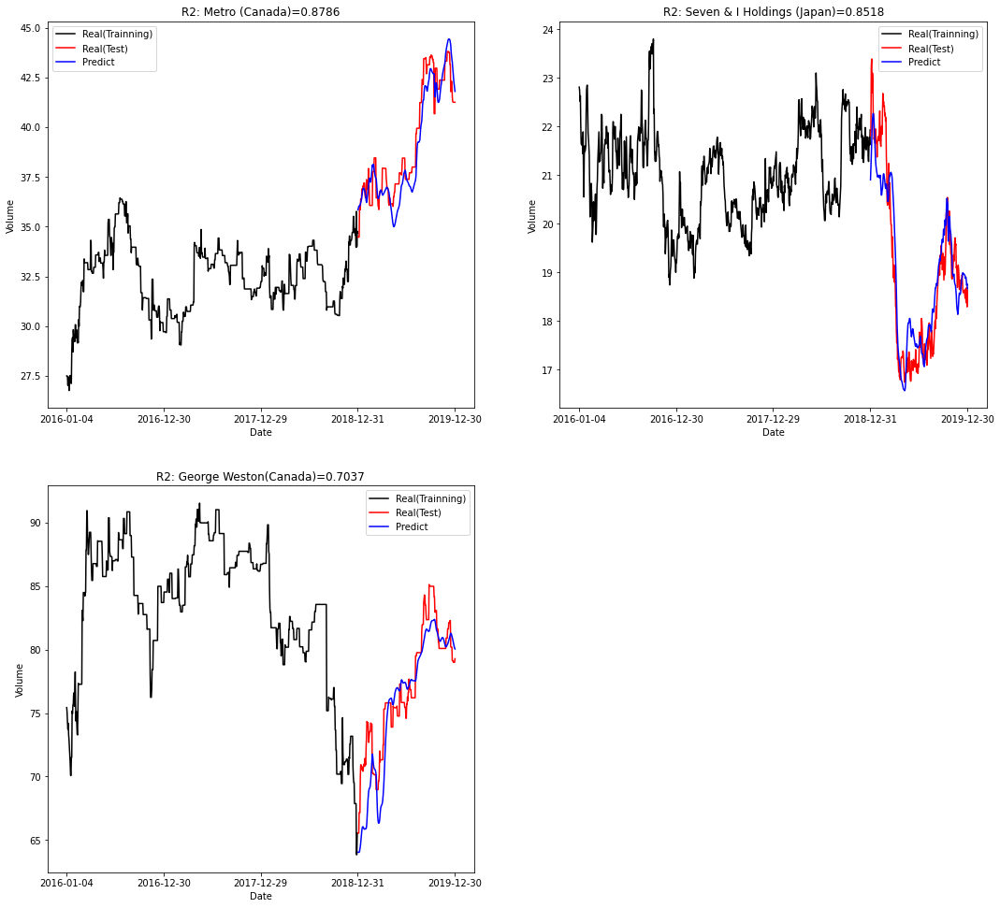

R2-3companies_average=0.8114
R2_scores_lists=[0.8786, 0.8518, 0.7037, 0.8114]

6回目
[Arguments]
num_company=3社 ['Carrefour(France)', 'J.Sainsbury(Britain)', 'Walgreens Boots Alliance (USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 21ms/step - loss: 0.3976
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1135
Epoch 3/50
22/22 [==============================] - 0s 21ms/step - loss: 0.0999
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0814
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0753
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0696
Epoch 7/50
22/22 [==================

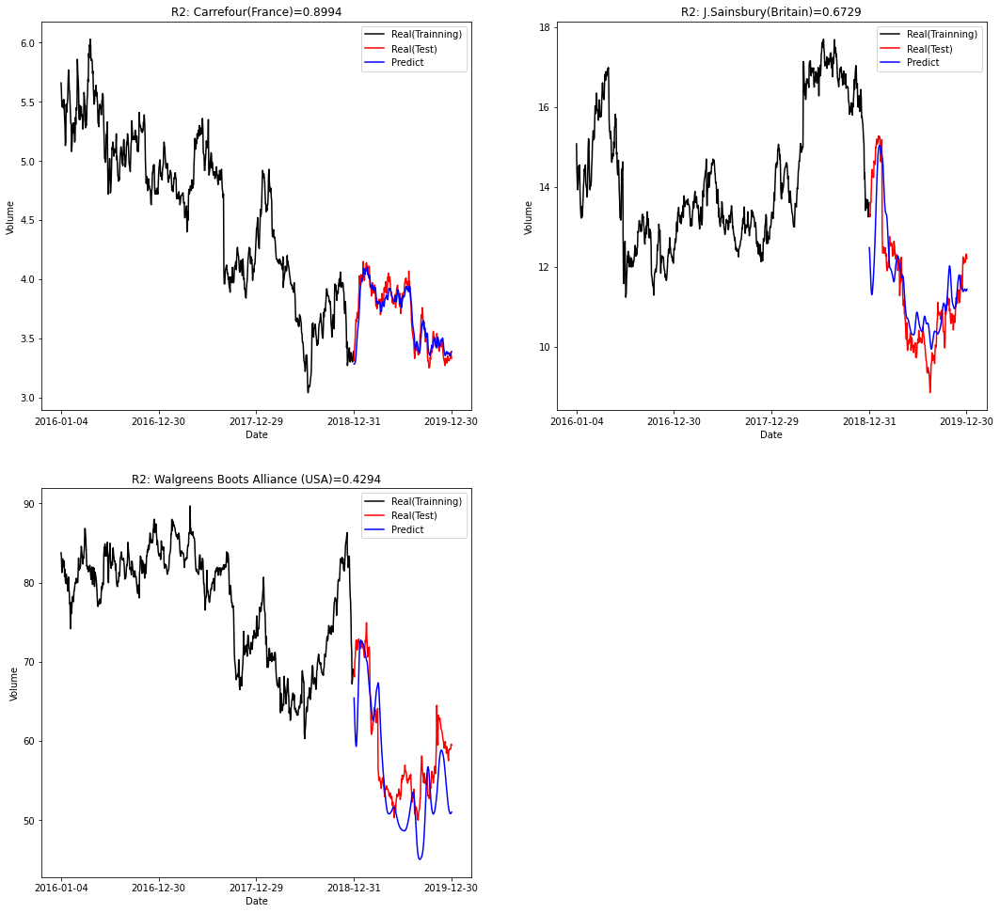

R2-3companies_average=0.6672
R2_scores_lists=[0.8994, 0.6729, 0.4294, 0.6672]

7回目
[Arguments]
num_company=3社 ['Metro (Canada)', 'Walgreens Boots Alliance (USA)', 'Kroger(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 8s 20ms/step - loss: 0.4891
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.2147
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1653
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1498
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1455
Epoch 6/50
22/22 [==============================] - 0s 21ms/step - loss: 0.1472
Epoch 7/50
22/22 [==============================

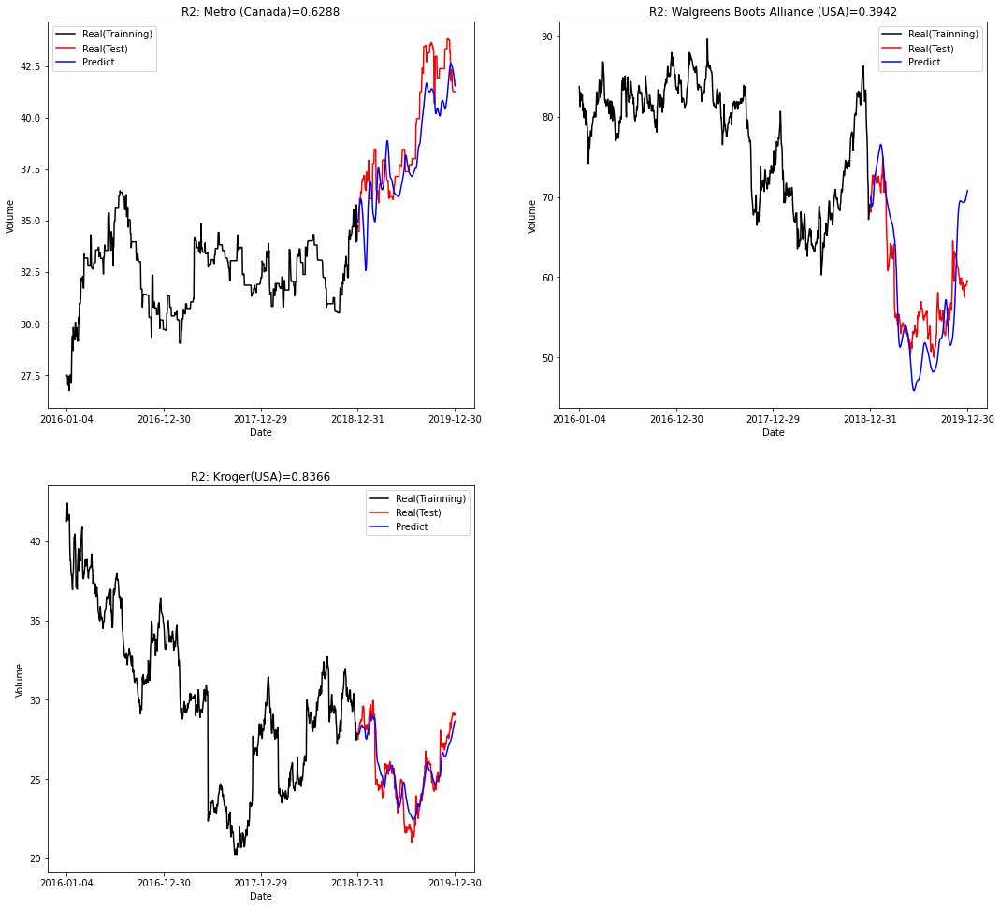

R2-3companies_average=0.6199
R2_scores_lists=[0.6288, 0.3942, 0.8366, 0.6199]

8回目
[Arguments]
num_company=3社 ['Walgreens Boots Alliance (USA)', 'Tesco(Britain)', 'Seven & I Holdings (Japan)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 21ms/step - loss: 0.5837
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1886
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1290
Epoch 4/50
22/22 [==============================] - 0s 21ms/step - loss: 0.1188
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0945
Epoch 6/50
22/22 [==============================] - 0s 21ms/step - loss: 0.1044
Epoch 7/50
22/22 [===============

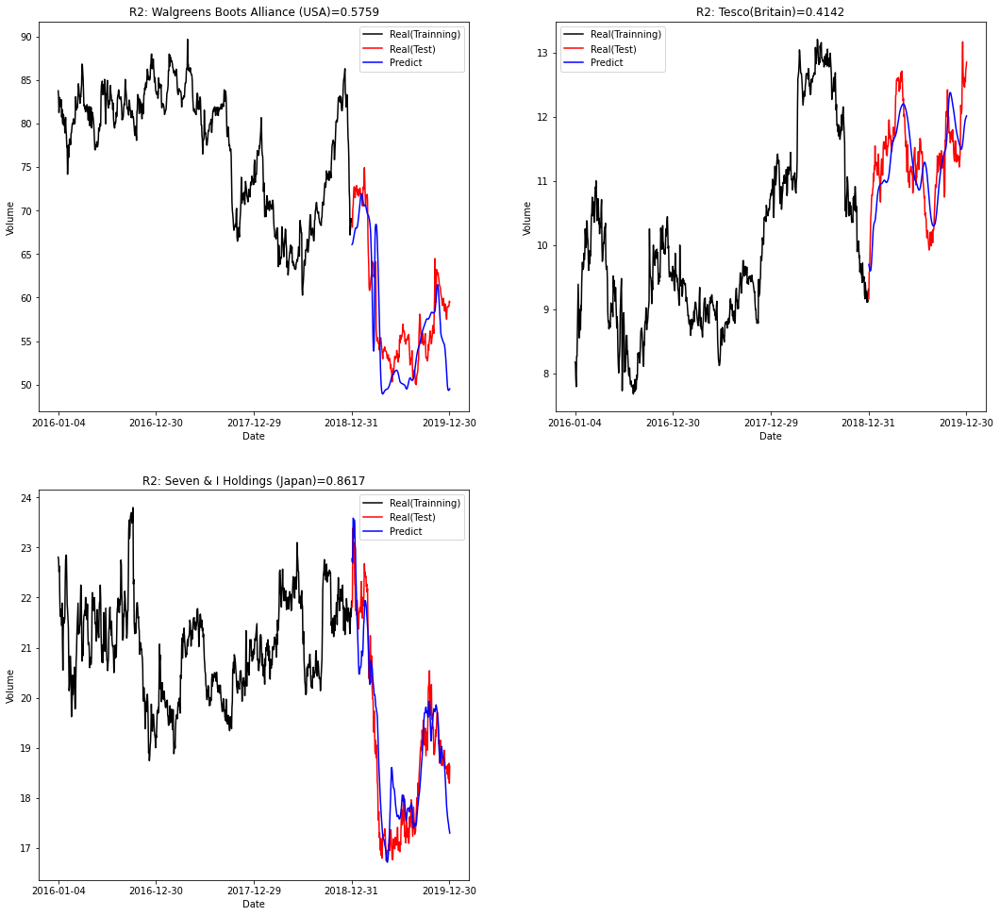

R2-3companies_average=0.6173
R2_scores_lists=[0.5759, 0.4142, 0.8617, 0.6173]

9回目
[Arguments]
num_company=3社 ['Carrefour(France)', 'J.Sainsbury(Britain)', 'Kroger(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 8s 20ms/step - loss: 0.4548
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1106
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0900
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0846
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0811
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0696
Epoch 7/50
22/22 [==============================] - 0s 

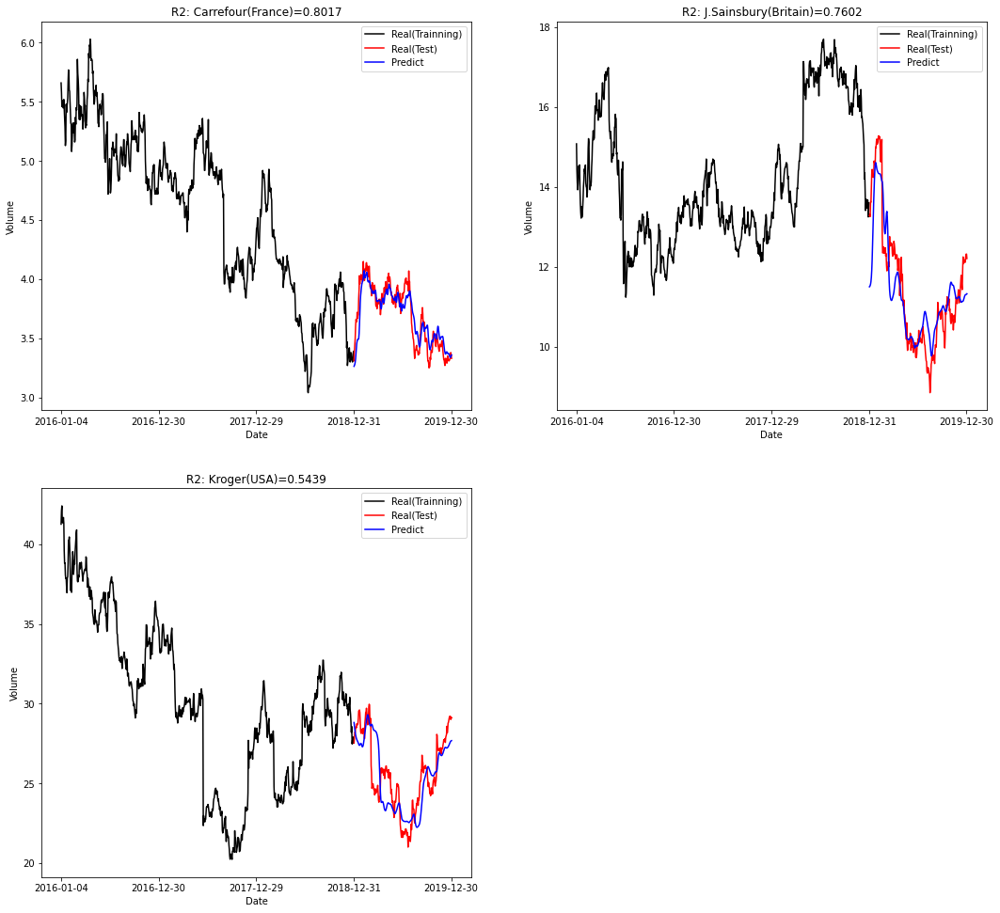

R2-3companies_average=0.7019
R2_scores_lists=[0.8017, 0.7602, 0.5439, 0.7019]

10回目
[Arguments]
num_company=3社 ['Royal Ahold Delhaize(Netherlands)', 'Metro (Canada)', 'Kroger(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 8s 19ms/step - loss: 0.5062
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1886
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1683
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1189
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1209
Epoch 6/50
22/22 [==============================] - 0s 21ms/step - loss: 0.1319
Epoch 7/50
22/22 [==========================

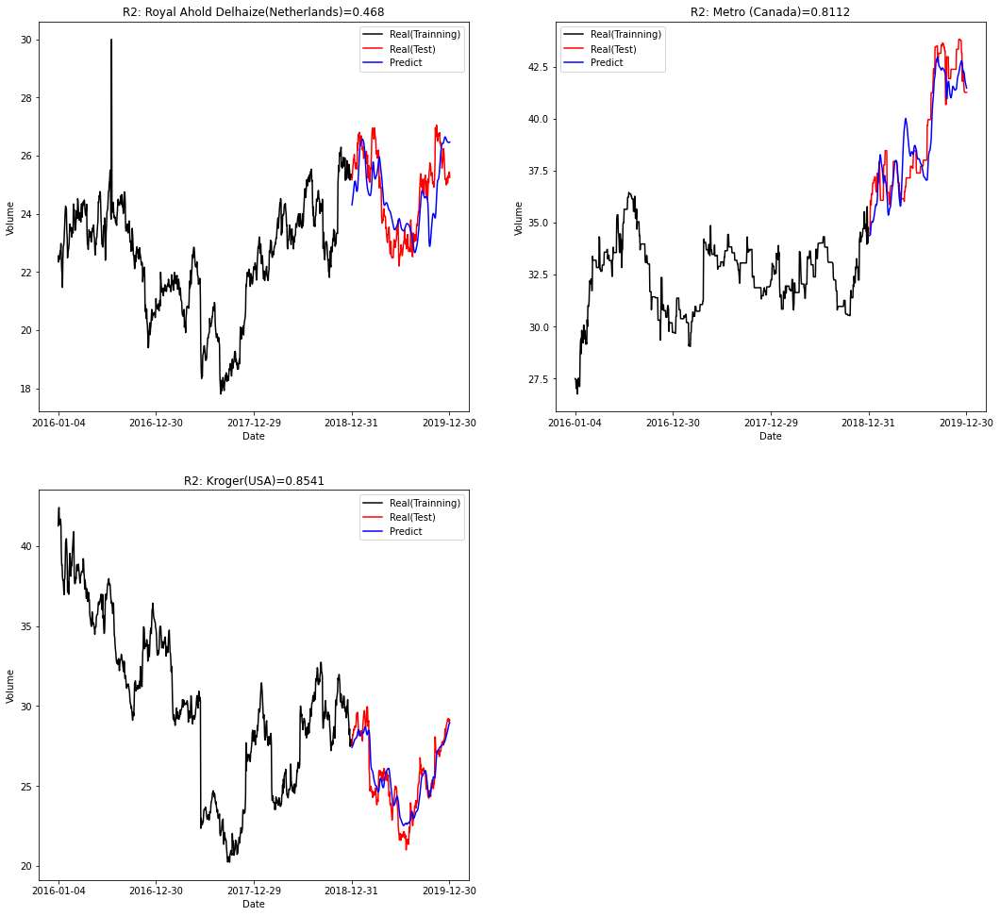

R2-3companies_average=0.7111
R2_scores_lists=[0.468, 0.8112, 0.8541, 0.7111]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=3, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=3, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

1回目
[Arguments]
num_company=4社 ['Seven & I Holdings (Japan)', 'Metro (Canada)', 'Coop Group (Switzerland)', 'Kroger(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.6257
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3526
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.2801
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.2424
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2442
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2290
Epoch 7/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1711
Epoch 8/50
22/22 [==

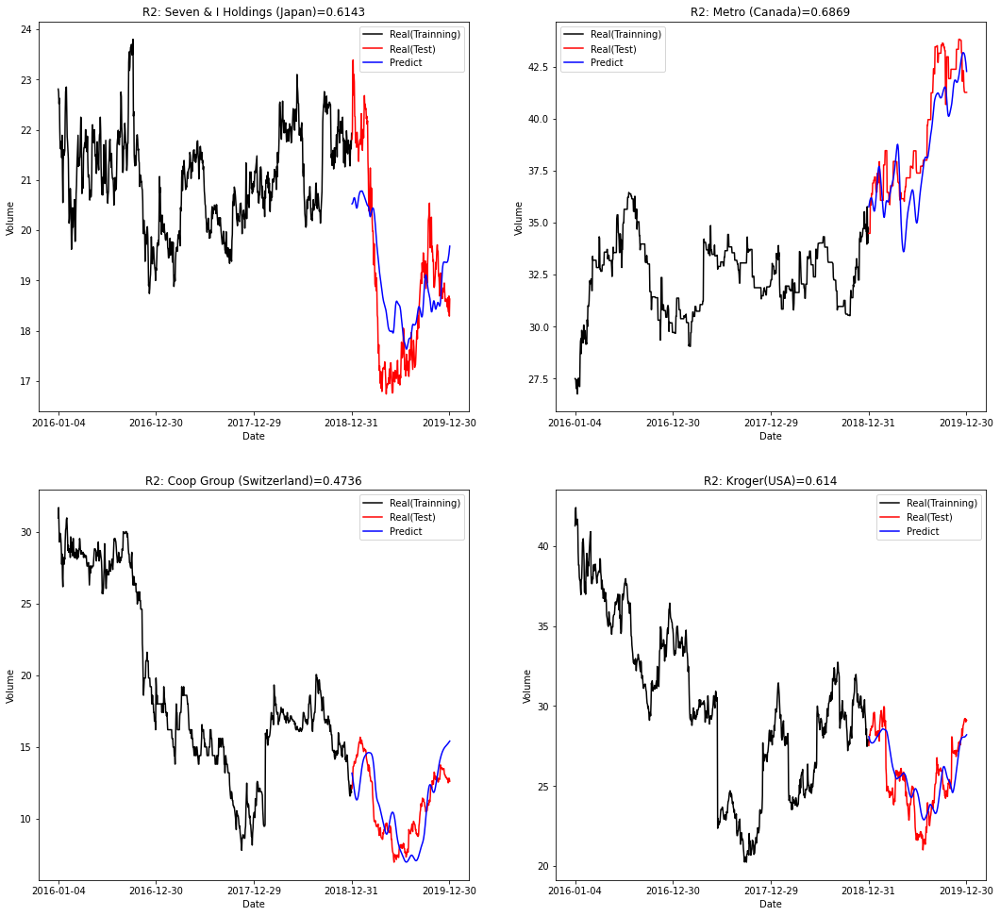

R2-4companies_average=0.5972
R2_scores_lists=[0.6143, 0.6869, 0.4736, 0.614, 0.5972]

2回目
[Arguments]
num_company=4社 ['Walgreens Boots Alliance (USA)', 'Tesco(Britain)', 'Kroger(USA)', 'Seven & I Holdings (Japan)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 8s 18ms/step - loss: 0.5127
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.1586
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1232
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0944
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0807
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.0905
Epoch 7/

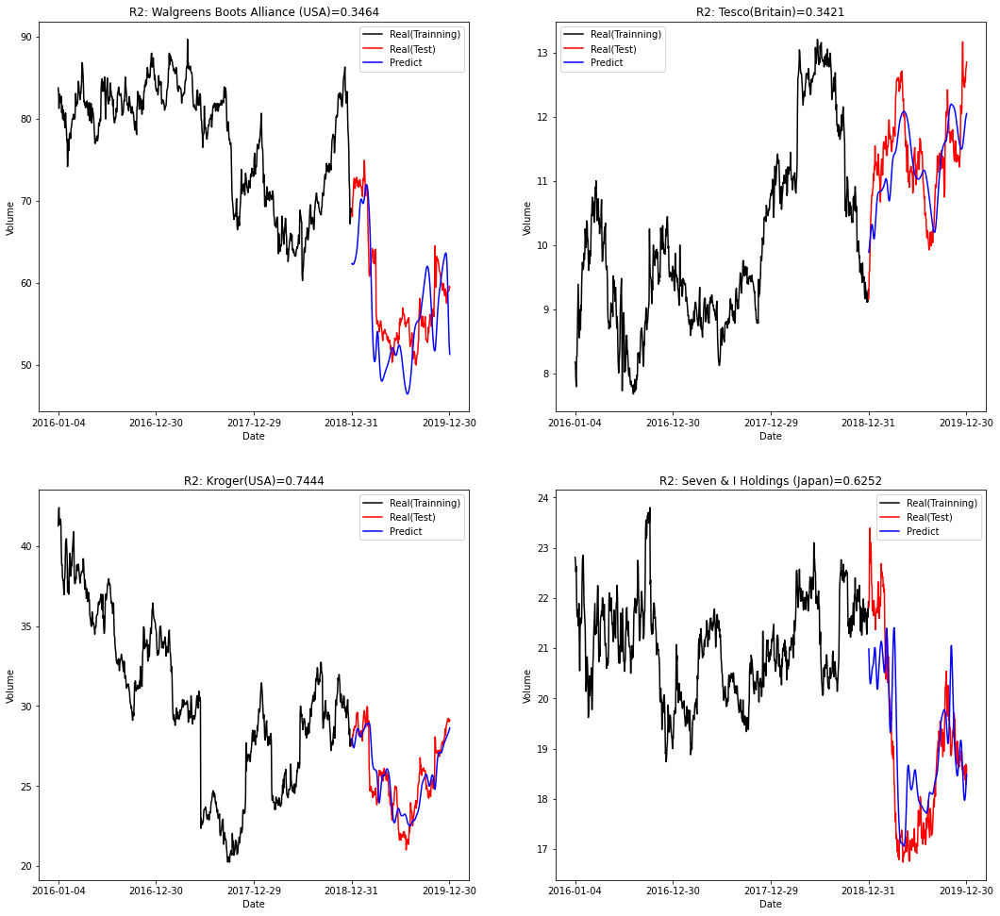

R2-4companies_average=0.5145
R2_scores_lists=[0.3464, 0.3421, 0.7444, 0.6252, 0.5145]

3回目
[Arguments]
num_company=4社 ['George Weston(Canada)', 'Walgreens Boots Alliance (USA)', 'Kroger(USA)', 'Metro (Canada)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 8s 20ms/step - loss: 0.3888
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.1269
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1083
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0972
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0901
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.0818
Epoch 7/50
2

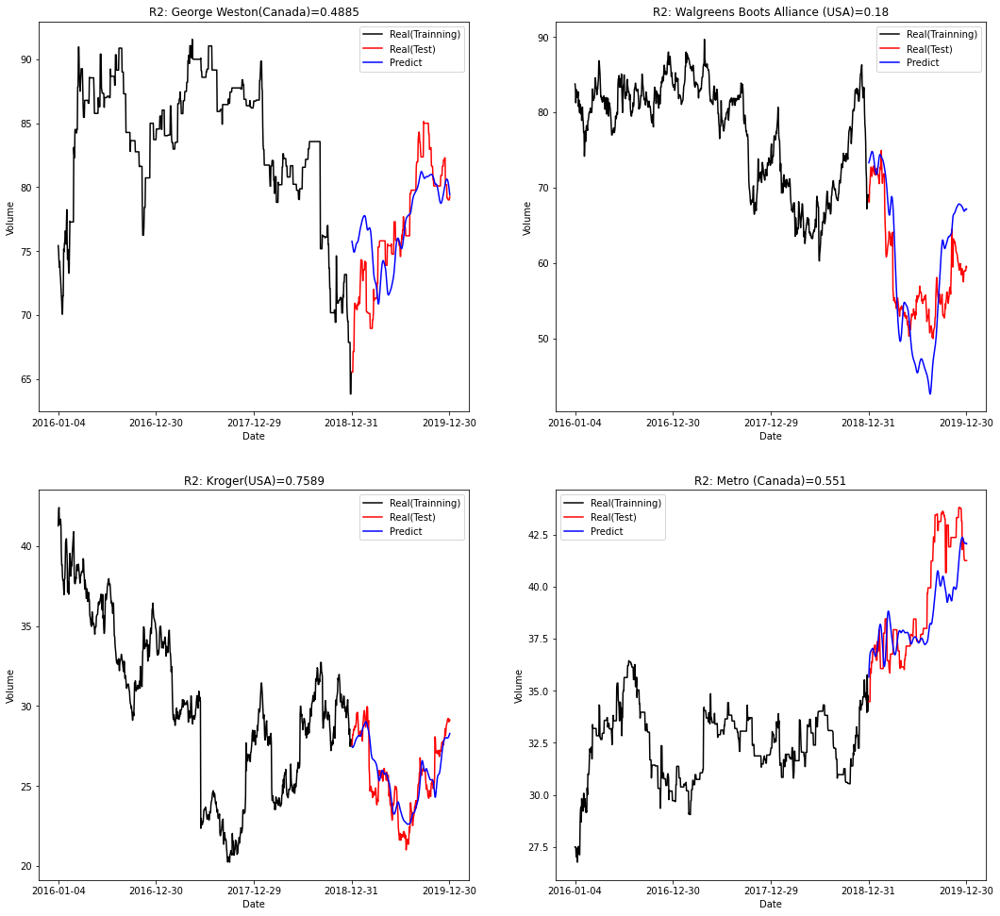

R2-4companies_average=0.4946
R2_scores_lists=[0.4885, 0.18, 0.7589, 0.551, 0.4946]

4回目
[Arguments]
num_company=4社 ['Metro (Canada)', 'Tesco(Britain)', 'AEON(Japan)', 'Walgreens Boots Alliance (USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 7s 19ms/step - loss: 0.4102
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1945
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1752
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1487
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1420
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1282
Epoch 7/50
22/22 [====

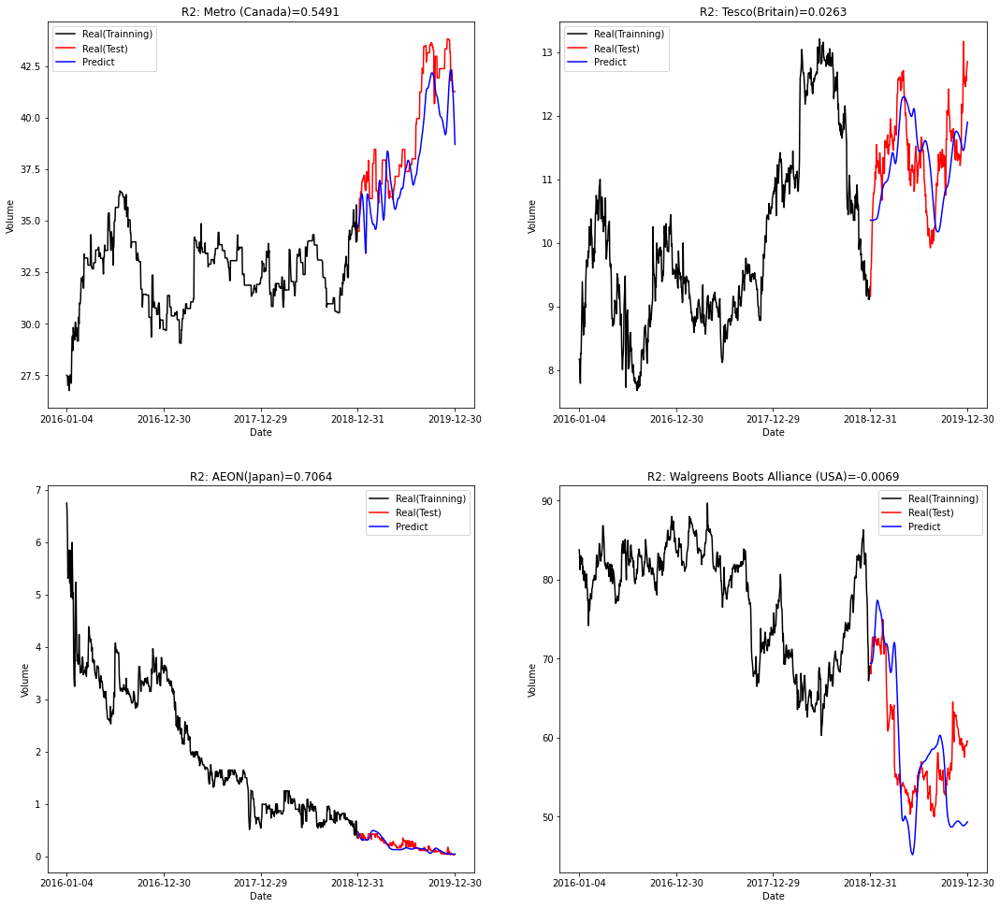

R2-4companies_average=0.3187
R2_scores_lists=[0.5491, 0.0263, 0.7064, -0.0069, 0.3187]

5回目
[Arguments]
num_company=4社 ['Tesco(Britain)', 'Coop Group (Switzerland)', 'Walgreens Boots Alliance (USA)', 'AEON(Japan)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 0.3565
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1148
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0815
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0702
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0753
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0631
Epoch 7/

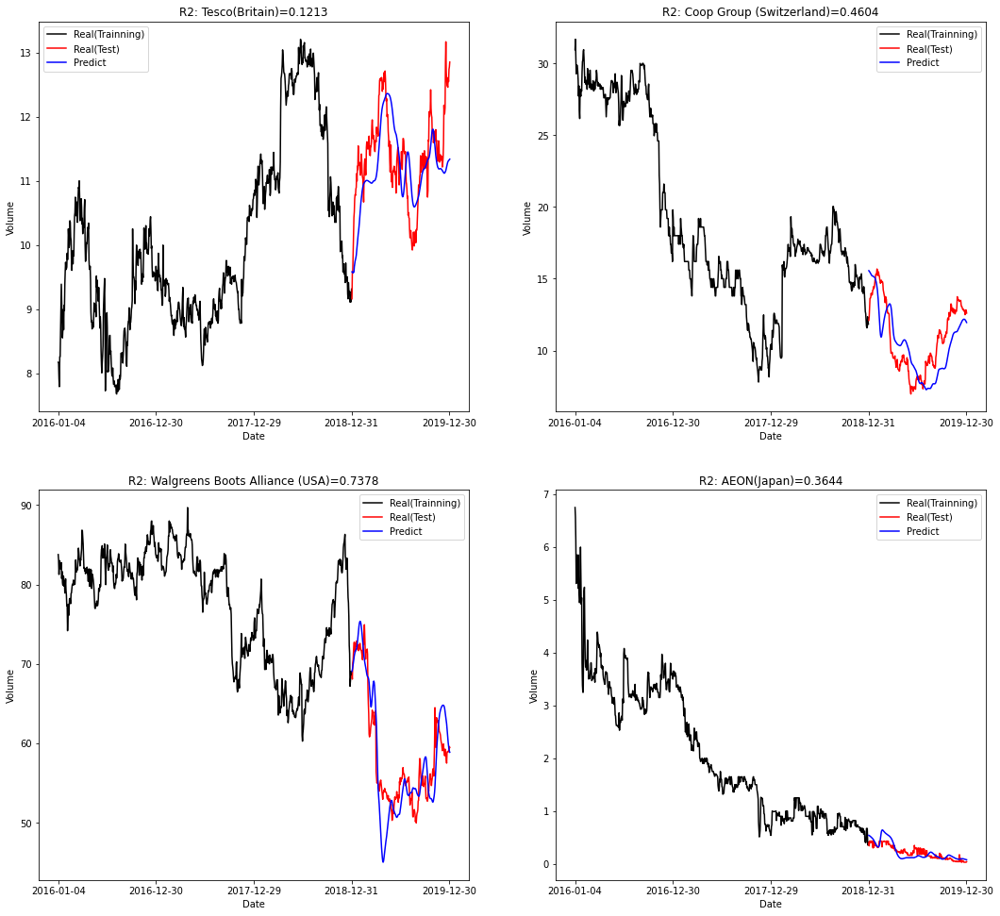

R2-4companies_average=0.421
R2_scores_lists=[0.1213, 0.4604, 0.7378, 0.3644, 0.421]

6回目
[Arguments]
num_company=4社 ['J.Sainsbury(Britain)', 'Carrefour(France)', 'Walgreens Boots Alliance (USA)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 7s 21ms/step - loss: 0.5081
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1203
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0879
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0858
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0913
Epoch 6/50
22/22 [==============================] - 0s 20ms/step - los

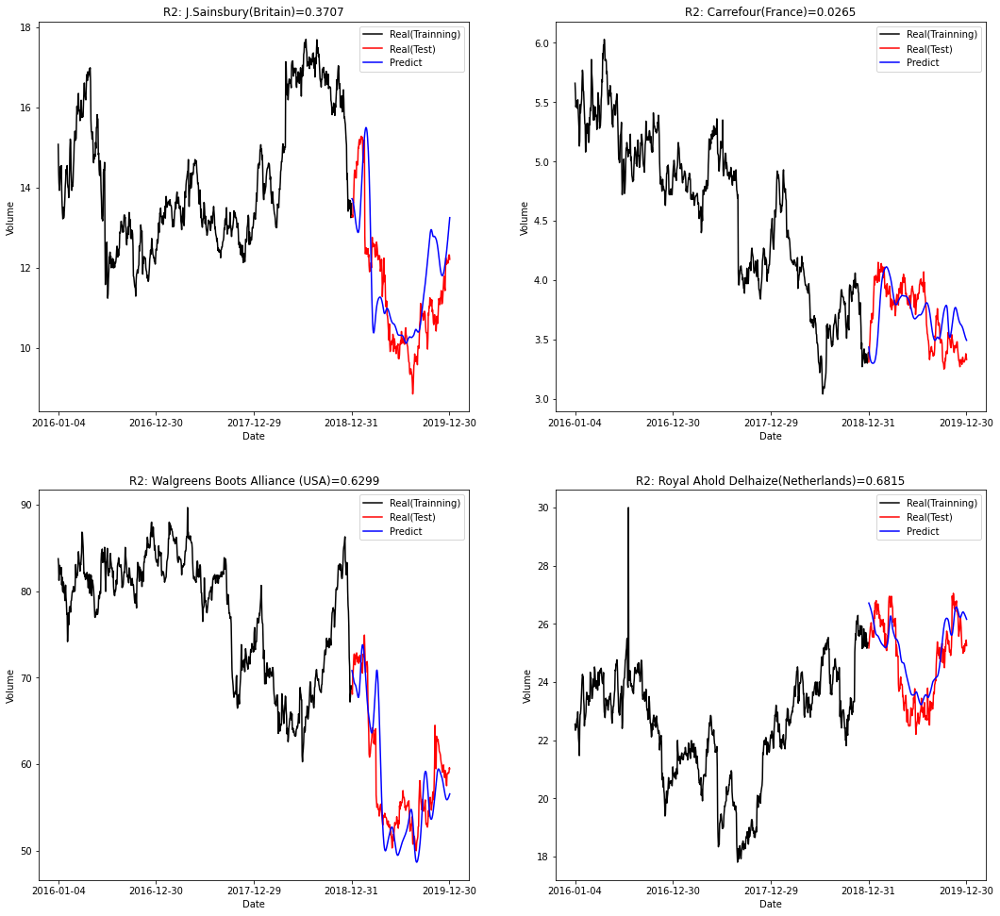

R2-4companies_average=0.4271
R2_scores_lists=[0.3707, 0.0265, 0.6299, 0.6815, 0.4271]

7回目
[Arguments]
num_company=4社 ['Carrefour(France)', 'Metro (Canada)', 'Royal Ahold Delhaize(Netherlands)', 'Coop Group (Switzerland)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 0.4181
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.1147
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0806
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0697
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0674
Epoch 6/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0812


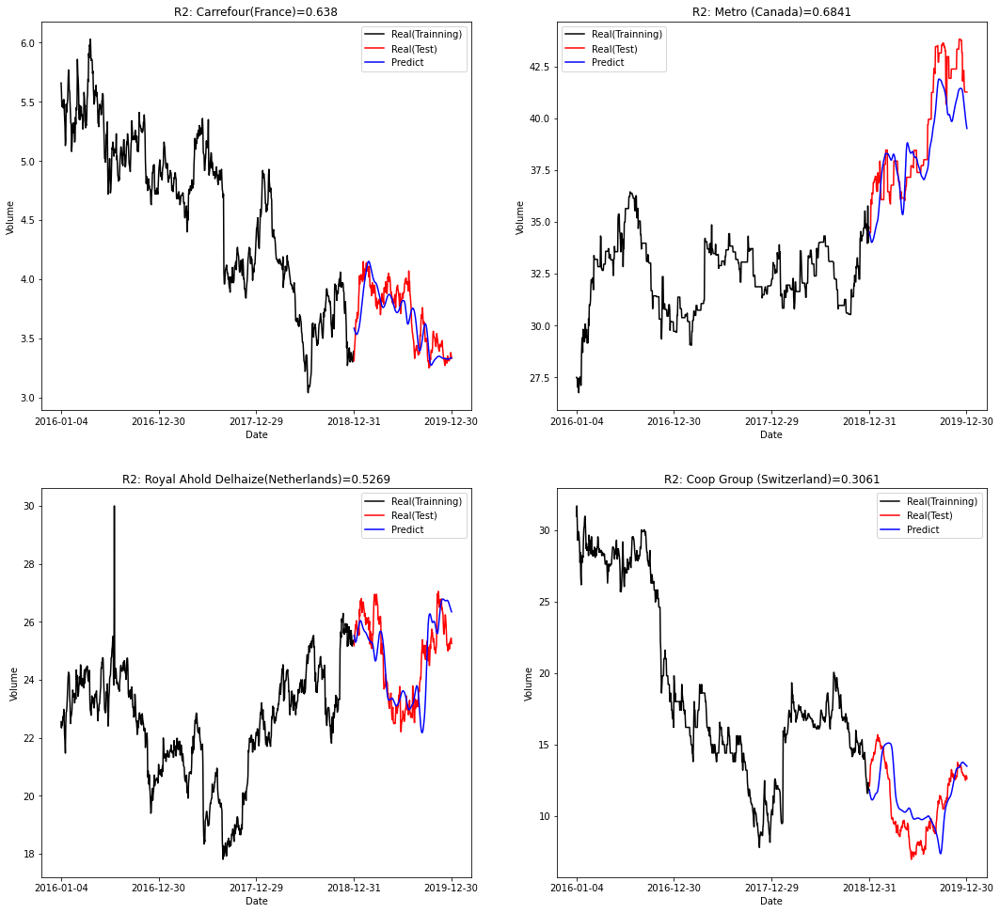

R2-4companies_average=0.5388
R2_scores_lists=[0.638, 0.6841, 0.5269, 0.3061, 0.5388]

8回目
[Arguments]
num_company=4社 ['Tesco(Britain)', 'Kroger(USA)', 'George Weston(Canada)', 'J.Sainsbury(Britain)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 8s 19ms/step - loss: 0.5428
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0930
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0892
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0696
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0894
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0742
Epoch 7/50
22/22 [=====

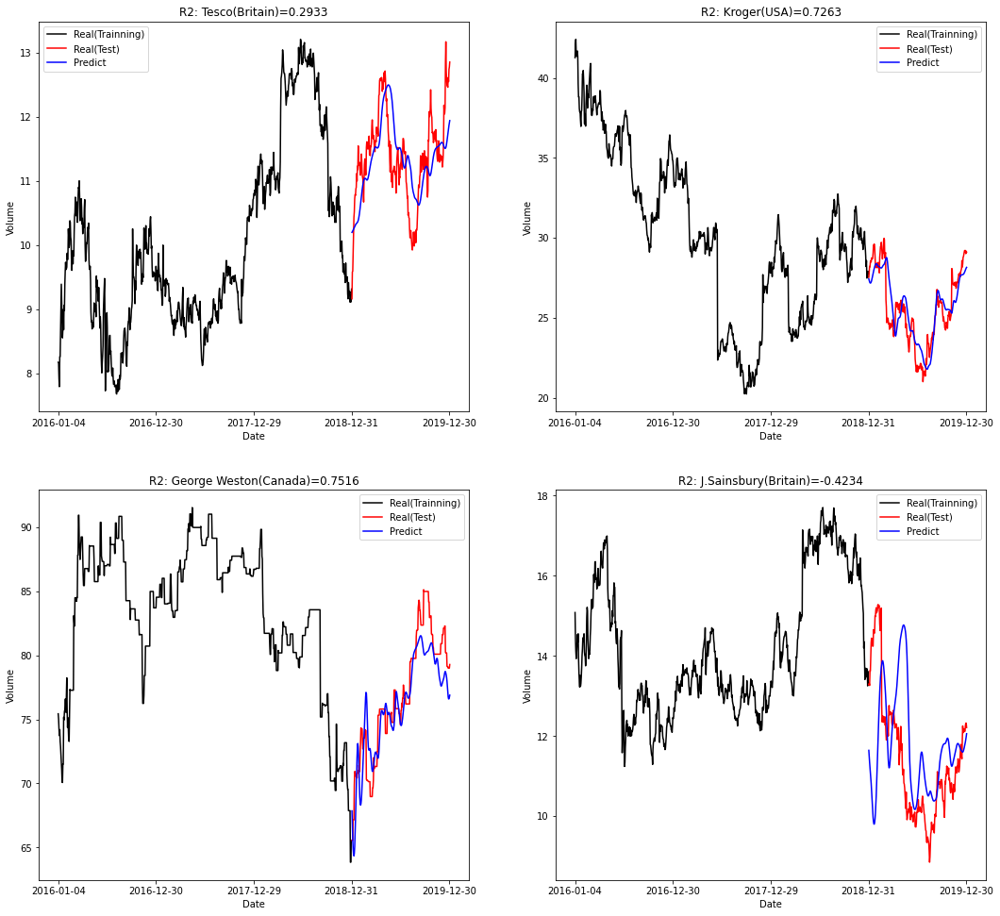

R2-4companies_average=0.3369
R2_scores_lists=[0.2933, 0.7263, 0.7516, -0.4234, 0.3369]

9回目
[Arguments]
num_company=4社 ['Seven & I Holdings (Japan)', 'Walgreens Boots Alliance (USA)', 'Metro (Canada)', 'Tesco(Britain)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 8s 20ms/step - loss: 0.6600
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.3326
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.3191
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.2464
Epoch 5/50
22/22 [==============================] - 0s 21ms/step - loss: 0.2565
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.2292
Epo

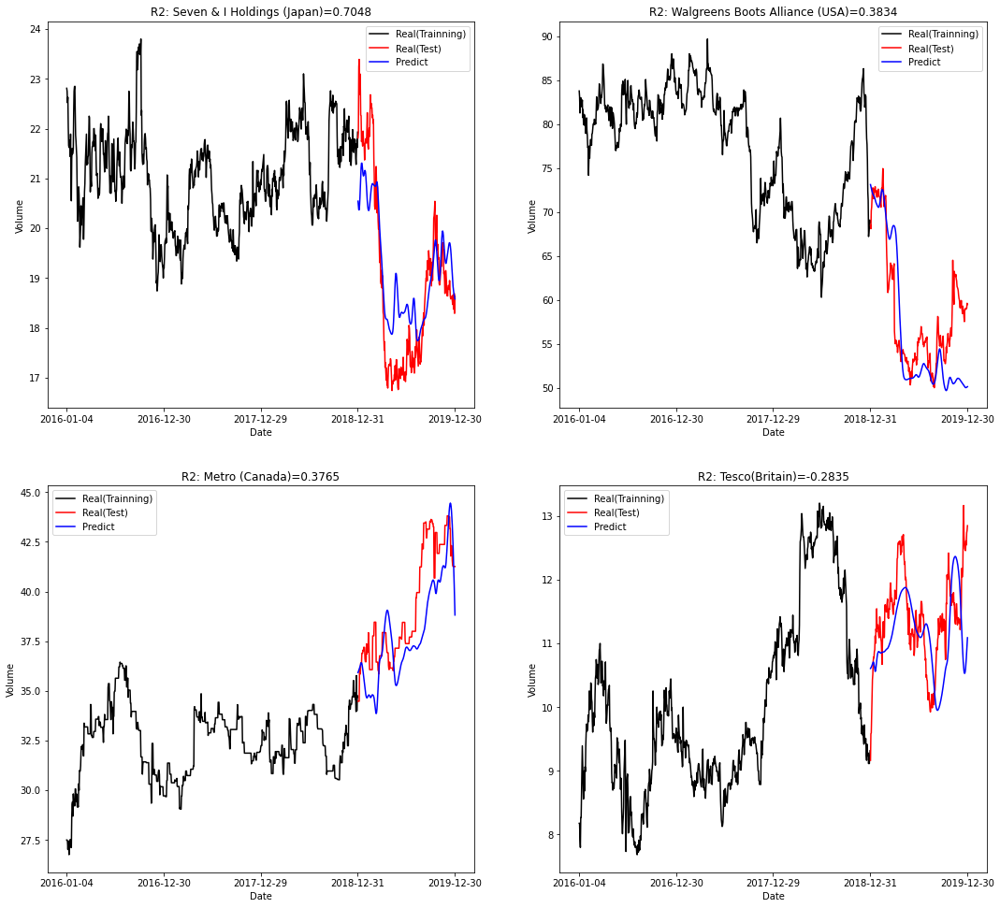

R2-4companies_average=0.2953
R2_scores_lists=[0.7048, 0.3834, 0.3765, -0.2835, 0.2953]

10回目
[Arguments]
num_company=4社 ['J.Sainsbury(Britain)', 'Tesco(Britain)', 'George Weston(Canada)', 'Walgreens Boots Alliance (USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 7s 22ms/step - loss: 0.4858
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.1438
Epoch 3/50
22/22 [==============================] - 0s 21ms/step - loss: 0.1178
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0939
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.0898
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.0863
E

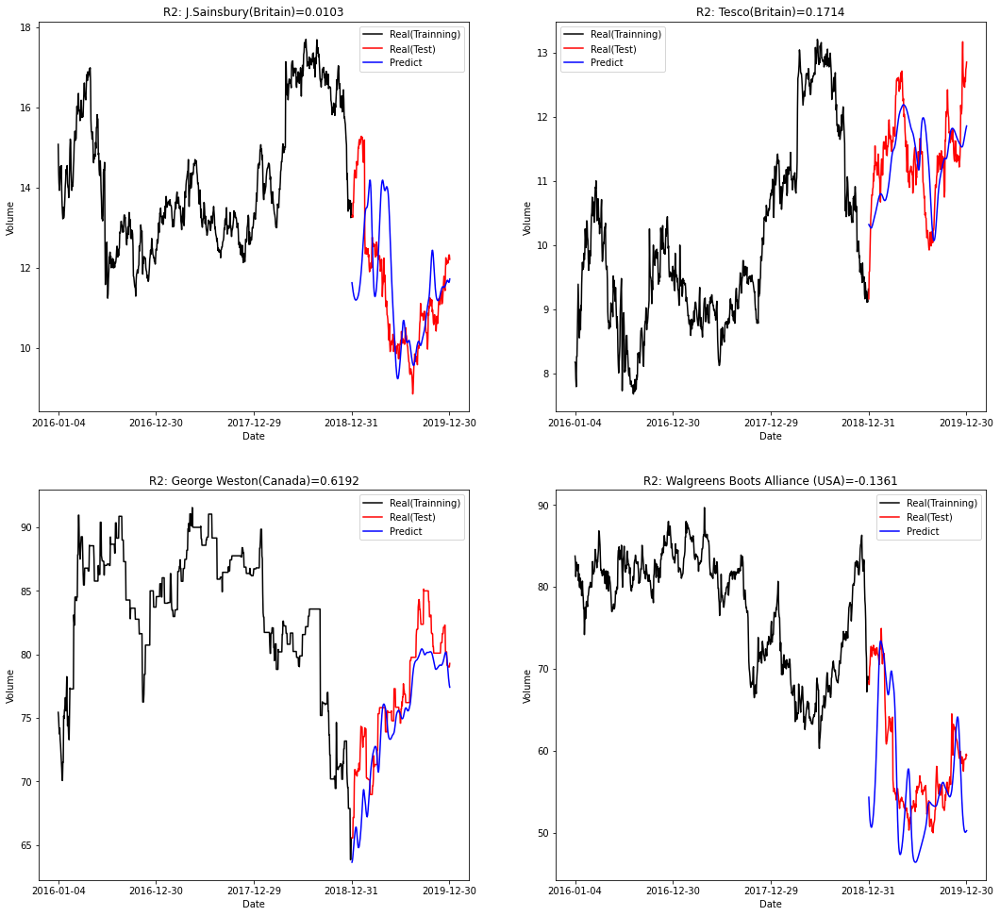

R2-4companies_average=0.1662
R2_scores_lists=[0.0103, 0.1714, 0.6192, -0.1361, 0.1662]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=4, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=4, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=5, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=5, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=6, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=6, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=7, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=7, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

# Result (High -> High)

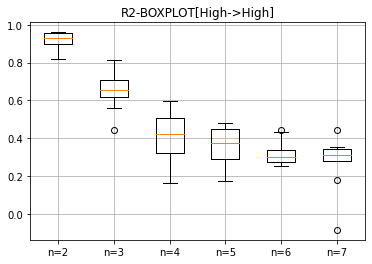

In [ ]:
import matplotlib.pyplot as plt
# experiment data
R2=[0.8217, 0.9503, 0.9607, 0.96, 0.9147, 0.9577, 0.9549, 0.9142, 0.8691, 0.8948]
R3=[0.6384, 0.4465, 0.7161, 0.5614, 0.8114, 0.6672, 0.6199, 0.6173, 0.7019, 0.7111]
R4=[0.5972, 0.5145, 0.4946, 0.3187, 0.421, 0.4271, 0.5388, 0.3369, 0.2953, 0.1662]
R5=[0.4607, 0.3341, 0.4637, 0.3706, 0.2751, 0.1982, 0.4829, 0.376, 0.1754, 0.4071]
R6=[0.4465, 0.2749, 0.2796, 0.4341, 0.2986, 0.3354, 0.2725, 0.3413, 0.2543, 0.2995]
R7=[0.4466, 0.3193, 0.3317, -0.0842, 0.1796, 0.2823, 0.3081, 0.2788, 0.3488, 0.3529]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT[High->High]')
plt.grid()
plt.show()

# Volume -> Volume

1回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 17ms/step - loss: 0.8253
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.2963
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9069
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 1.6014
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6095
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9427
Epoch 7/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9180
Epoch 8/50
22/22 [==============================] - 0s 16m

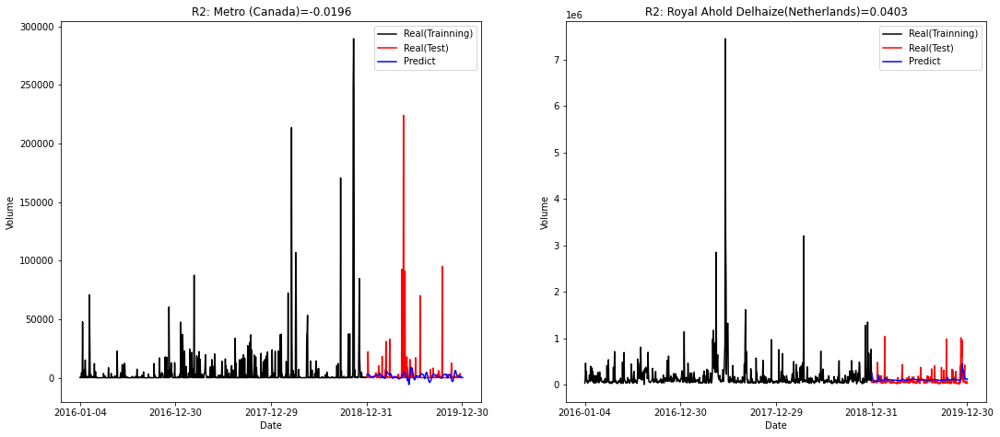

R2-2companies_average=0.0103
R2_scores_lists=[-0.0196, 0.0403, 0.0103]

2回目
[Arguments]
num_company=2社 ['Tesco(Britain)', 'AEON(Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 14ms/step - loss: 1.0243
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 1.1468
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.9622
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 1.0241
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 1.0250
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7861
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7278
Epoch 8/

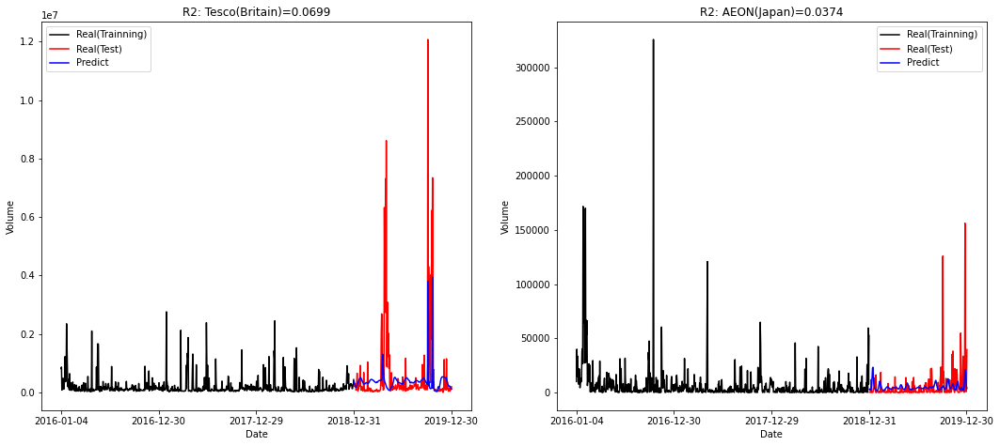

R2-2companies_average=0.0536
R2_scores_lists=[0.0699, 0.0374, 0.0536]

3回目
[Arguments]
num_company=2社 ['Walgreens Boots Alliance (USA)', 'Coop Group (Switzerland)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.8573
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.0045
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.9323
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 1.0769
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6836
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.9146
Epoch 7/50
22/22 [==============================] - 0s 15ms/

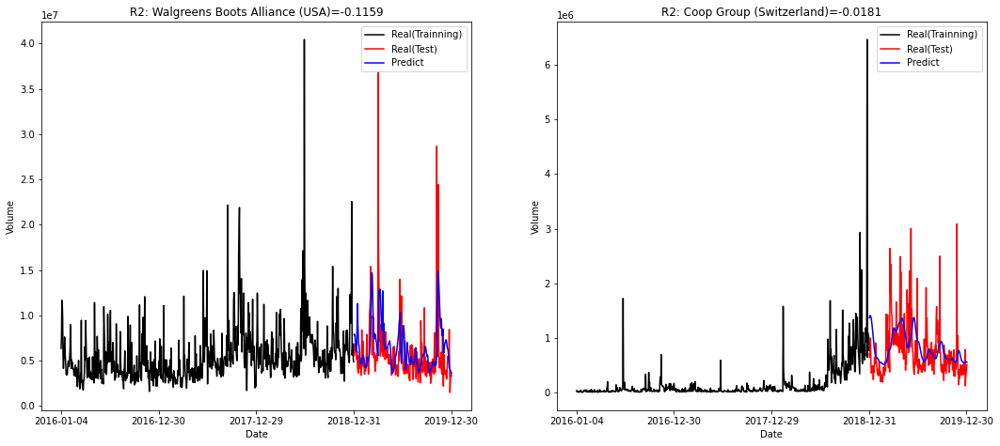

R2-2companies_average=-0.067
R2_scores_lists=[-0.1159, -0.0181, -0.067]

4回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'George Weston(Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 1.0322
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.1198
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9847
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 1.3095
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.5500
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7458
Epoch 7/50
22/22 [==============================] - 0s 16ms/step - loss: 1.31

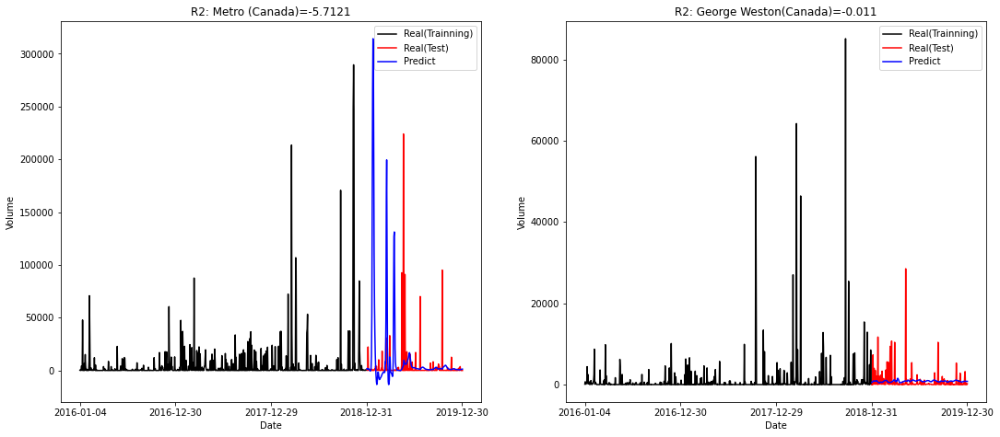

R2-2companies_average=-2.8616
R2_scores_lists=[-5.7121, -0.011, -2.8616]

5回目
[Arguments]
num_company=2社 ['Tesco(Britain)', 'Carrefour(France)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 18ms/step - loss: 1.0032
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1216
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6743
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.8523
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8583
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9699
Epoch 7/50
22/22 [==============================] - 0s 18ms/step - loss: 0.6714


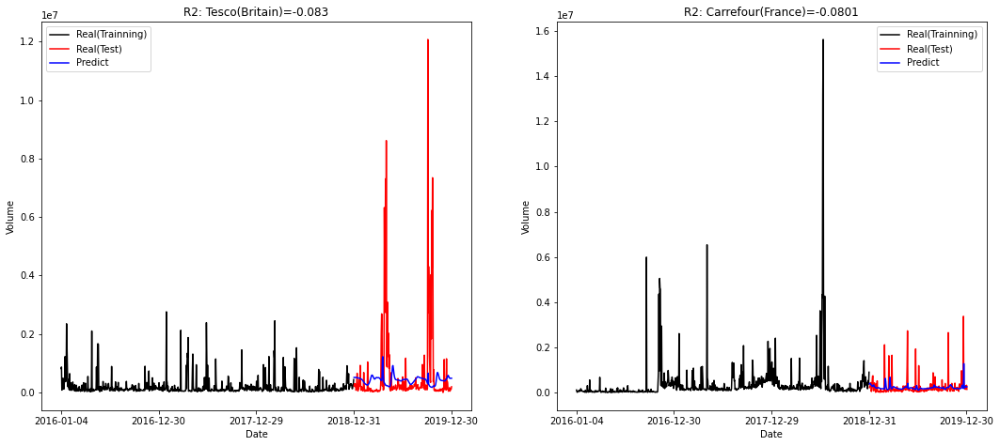

R2-2companies_average=-0.0816
R2_scores_lists=[-0.083, -0.0801, -0.0816]

6回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 15ms/step - loss: 0.4552
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9976
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7371
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 1.8640
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 1.2513
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 1.0150
Epoch 7/50
22/22 [==============================] - 0s 16ms/step

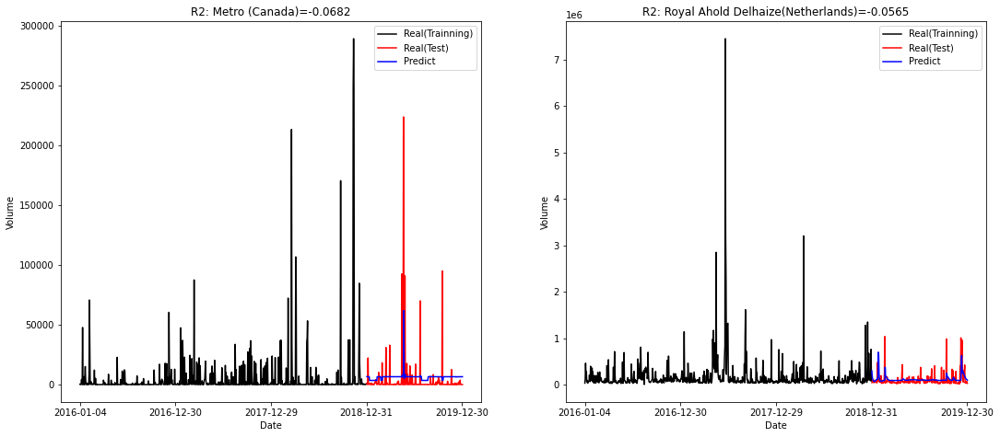

R2-2companies_average=-0.0624
R2_scores_lists=[-0.0682, -0.0565, -0.0624]

7回目
[Arguments]
num_company=2社 ['Metro (Canada)', 'Seven & I Holdings (Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.9613
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.2877
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 1.9953
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 1.4565
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.3539
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.5750
Epoch 7/50
22/22 [==============================] - 0s 16ms/step - los

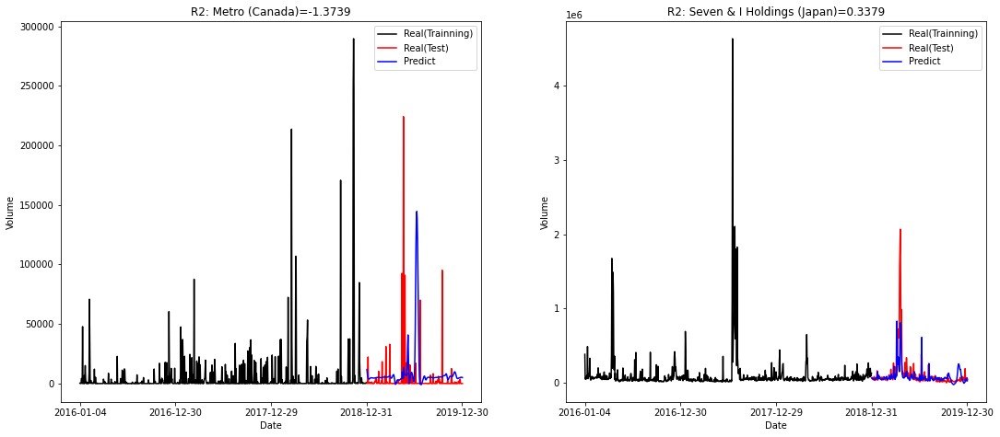

R2-2companies_average=-0.518
R2_scores_lists=[-1.3739, 0.3379, -0.518]

8回目
[Arguments]
num_company=2社 ['Tesco(Britain)', 'AEON(Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 17ms/step - loss: 1.0481
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8905
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1799
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8751
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1240
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 1.0686
Epoch 7/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9506
Epoch 8/

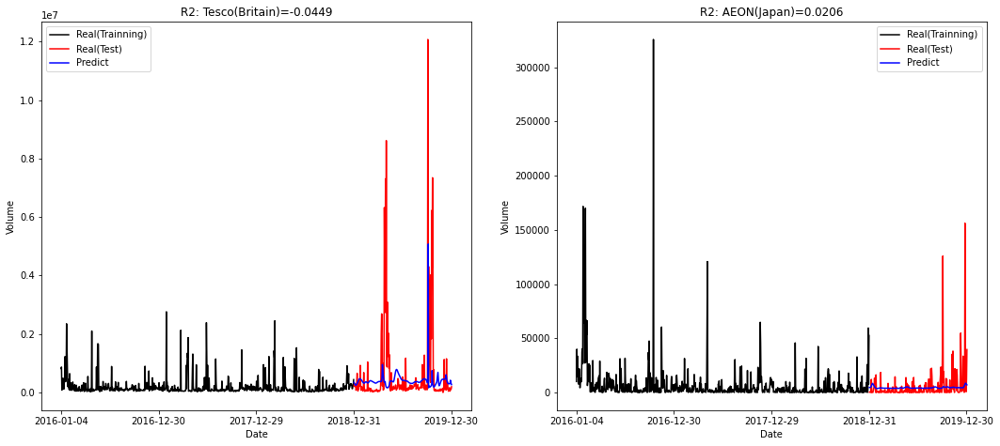

R2-2companies_average=-0.0121
R2_scores_lists=[-0.0449, 0.0206, -0.0121]

9回目
[Arguments]
num_company=2社 ['Coop Group (Switzerland)', 'George Weston(Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 18ms/step - loss: 0.8409
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.5319
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.4609
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.5851
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.6538
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.4182
Epoch 7/50
22/22 [==============================] - 0s 18ms/step -

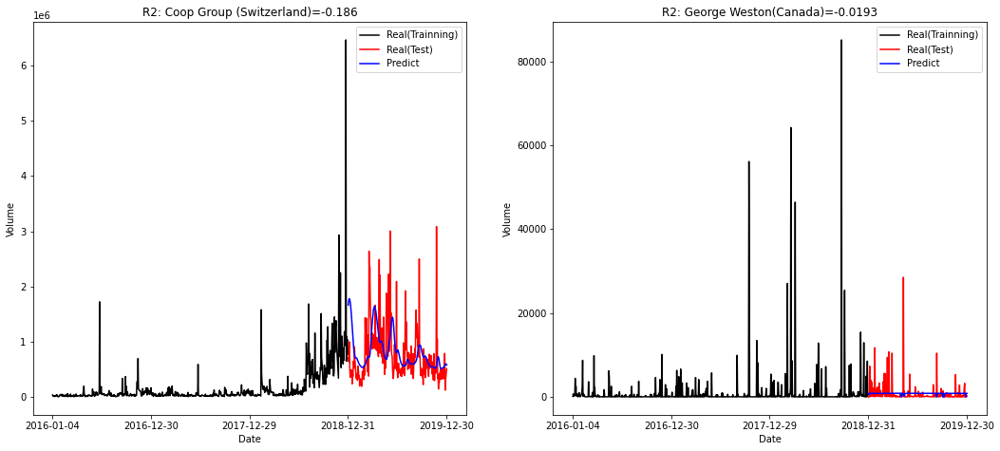

R2-2companies_average=-0.1027
R2_scores_lists=[-0.186, -0.0193, -0.1027]

10回目
[Arguments]
num_company=2社 ['Tesco(Britain)', 'AEON(Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(2, 754, 1)
training_set_all=(754, 2)
concat=(754, 2)
[0, 1]
X_train=(694, 60, 2), y_trains=(1388,)
y_trains2=(2, 694)
1/2
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 1.2407
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9117
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8436
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9480
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 1.0303
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6920
Epoch 7/50
22/22 [==============================] - 0s 17ms/step - loss: 0.7567
Epoch

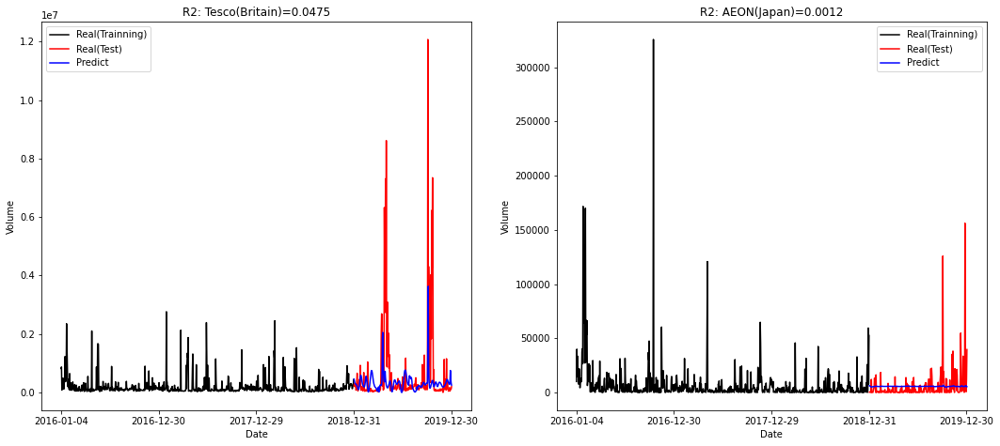

R2-2companies_average=0.0243
R2_scores_lists=[0.0475, 0.0012, 0.0243]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=2, input_category=['Volume'], input_vars=[6], output_category=['Volume'], 
                    output_vars=[6], outputs_company=2, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

1回目
[Arguments]
num_company=3社 ['Seven & I Holdings (Japan)', 'Carrefour(France)', 'George Weston(Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.9933
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8776
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.5367
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 1.0694
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7968
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.4051
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.6634
Epoch 8/50
22/22 [================

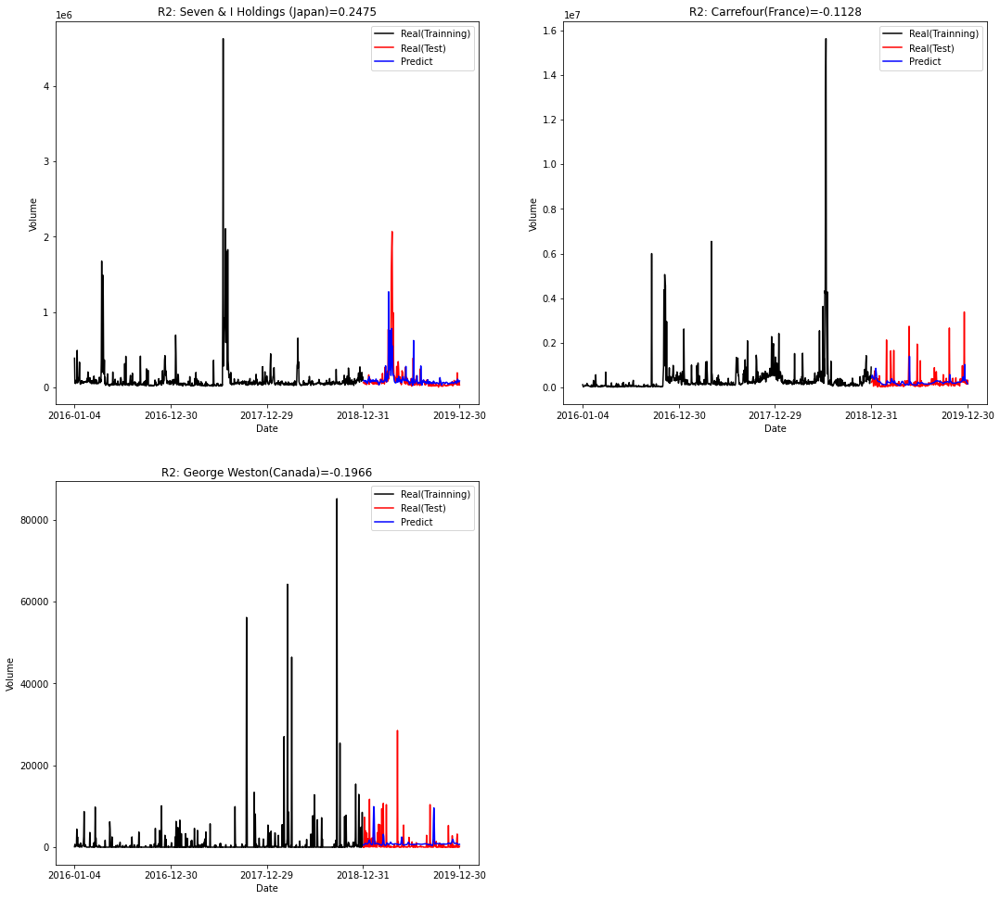

R2-3companies_average=-0.0206
R2_scores_lists=[0.2475, -0.1128, -0.1966, -0.0206]

2回目
[Arguments]
num_company=3社 ['Carrefour(France)', 'Tesco(Britain)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.7530
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.5761
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7687
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 1.2992
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8282
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6912
Epoch 7/50
22/22 [=============

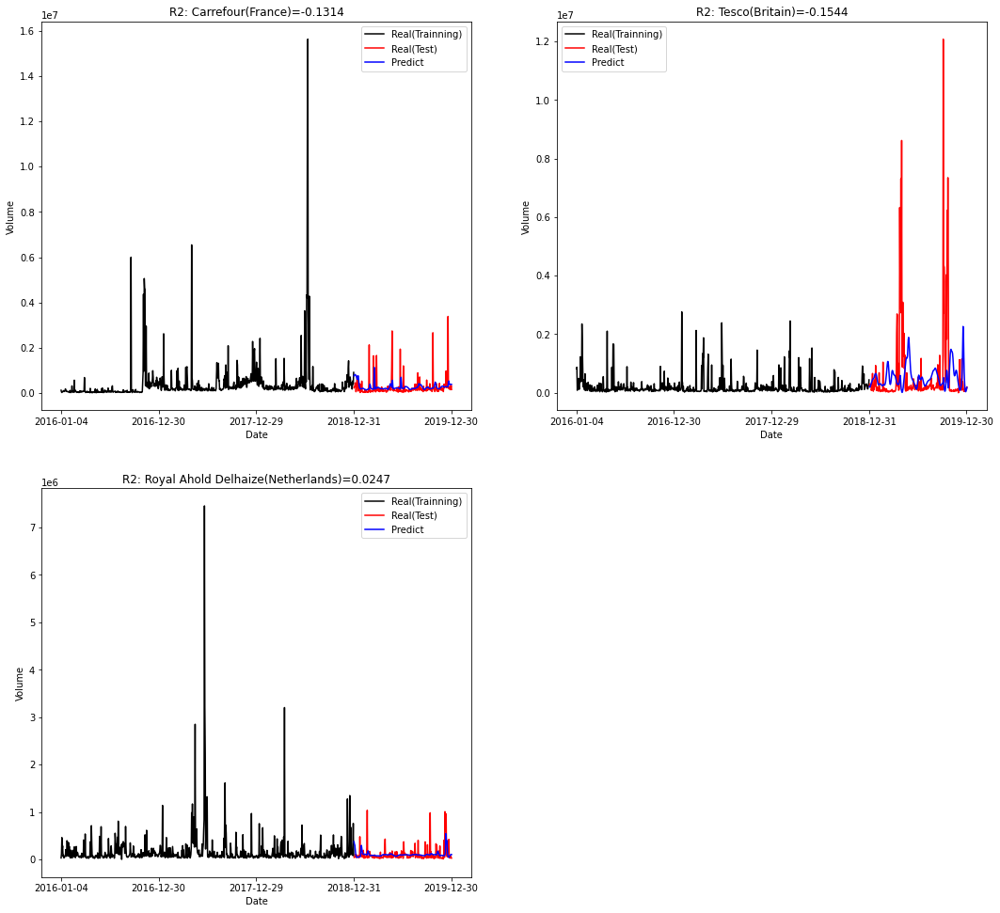

R2-3companies_average=-0.0871
R2_scores_lists=[-0.1314, -0.1544, 0.0247, -0.0871]

3回目
[Arguments]
num_company=3社 ['Metro (Canada)', 'Kroger(USA)', 'Seven & I Holdings (Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 17ms/step - loss: 0.8115
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6373
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 1.0832
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 1.3544
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 1.4802
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7233
Epoch 7/50
22/22 [==========================

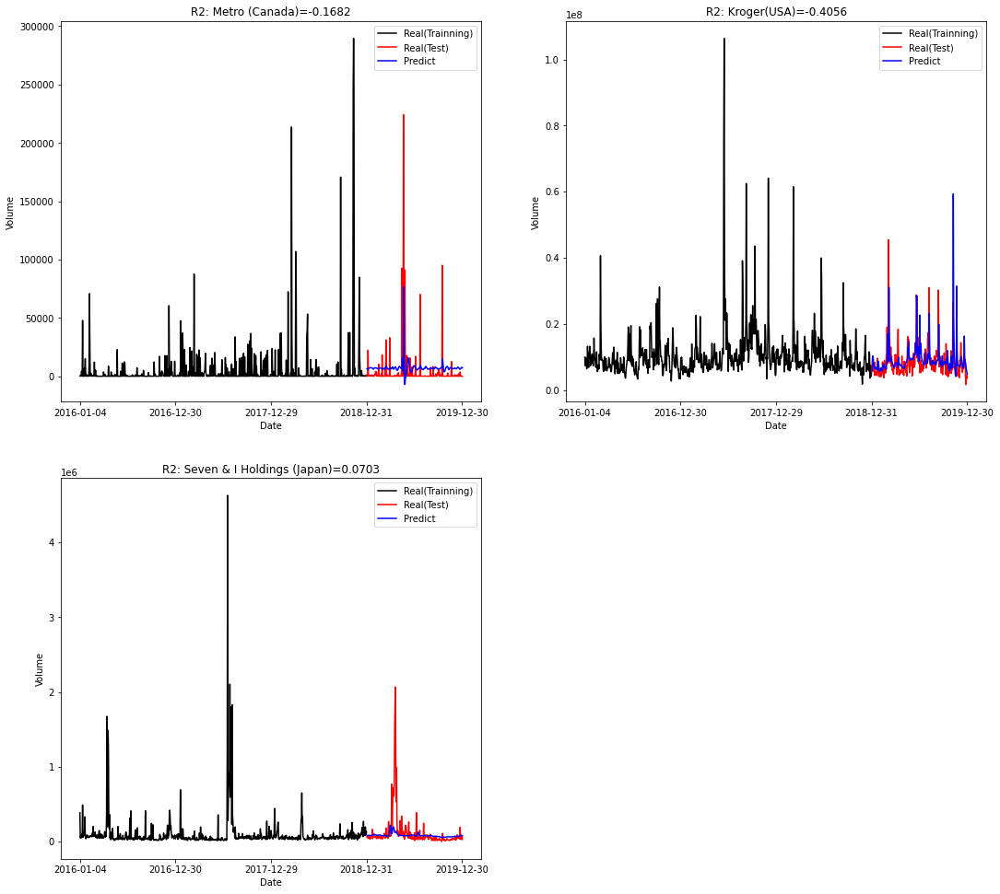

R2-3companies_average=-0.1678
R2_scores_lists=[-0.1682, -0.4056, 0.0703, -0.1678]

4回目
[Arguments]
num_company=3社 ['J.Sainsbury(Britain)', 'Metro (Canada)', 'Seven & I Holdings (Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.3422
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.6478
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9054
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.3112
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.4214
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.5036
Epoch 7/50
22/22 [=================

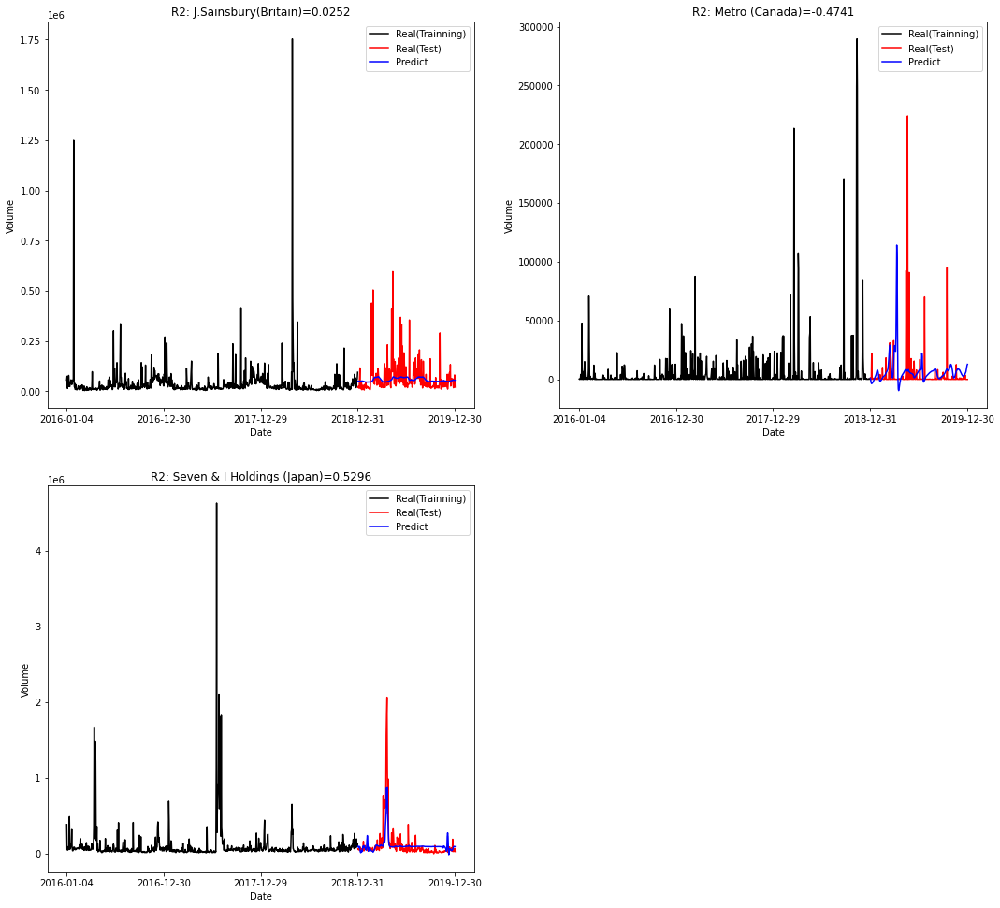

R2-3companies_average=0.0269
R2_scores_lists=[0.0252, -0.4741, 0.5296, 0.0269]

5回目
[Arguments]
num_company=3社 ['Tesco(Britain)', 'Royal Ahold Delhaize(Netherlands)', 'Walgreens Boots Alliance (USA)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 6s 18ms/step - loss: 0.8209
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.0288
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1655
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.7534
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6746
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9595
Epoch 7/50
22/22 [===

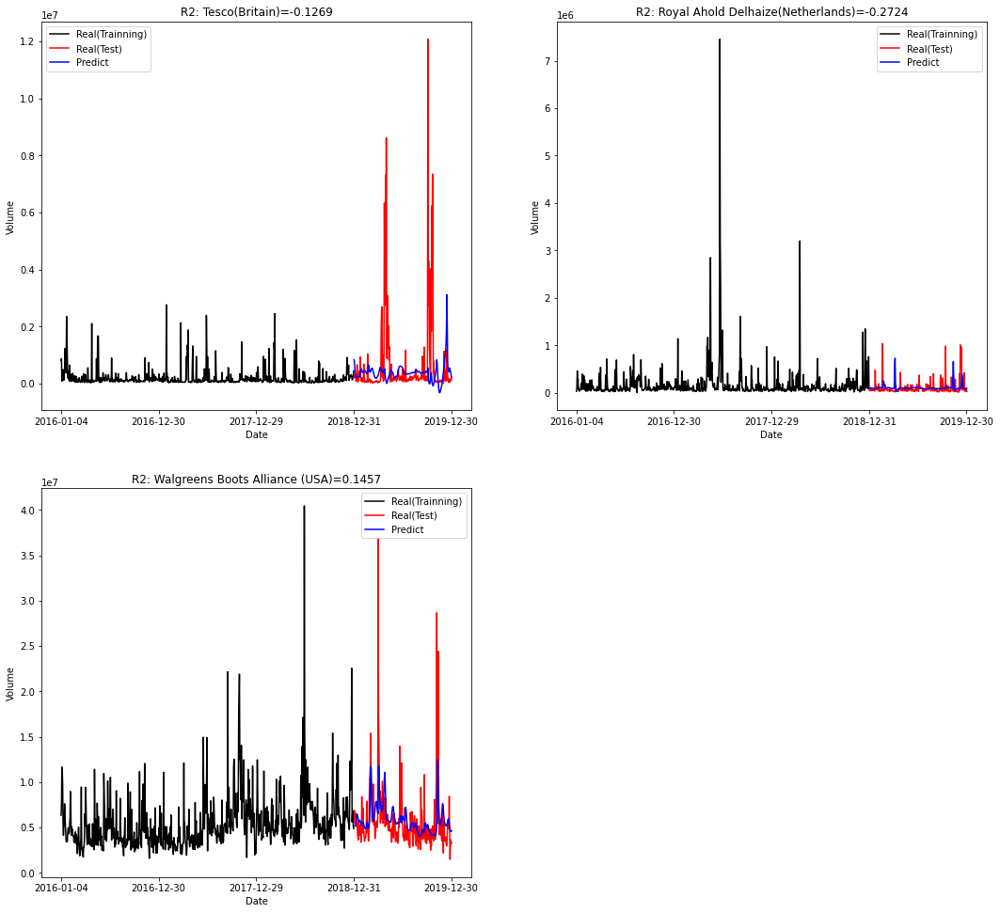

R2-3companies_average=-0.0845
R2_scores_lists=[-0.1269, -0.2724, 0.1457, -0.0845]

6回目
[Arguments]
num_company=3社 ['Coop Group (Switzerland)', 'Royal Ahold Delhaize(Netherlands)', 'Kroger(USA)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 6s 18ms/step - loss: 1.8457
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3998
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.5980
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.2567
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.8200
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.3870
Epoch 7/50
22/22 [=========

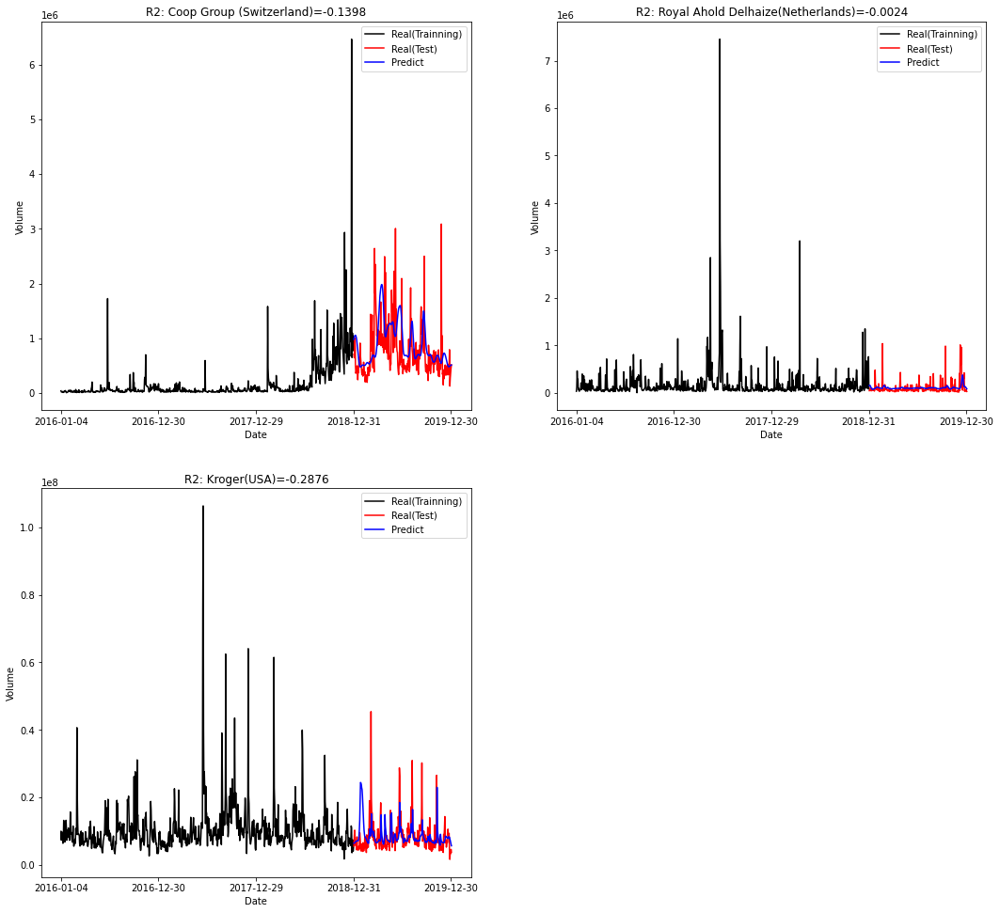

R2-3companies_average=-0.1433
R2_scores_lists=[-0.1398, -0.0024, -0.2876, -0.1433]

7回目
[Arguments]
num_company=3社 ['Metro (Canada)', 'George Weston(Canada)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 5s 17ms/step - loss: 0.6447
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1071
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.6864
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9888
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.5618
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.6406
Epoch 7/50
22/22 [========

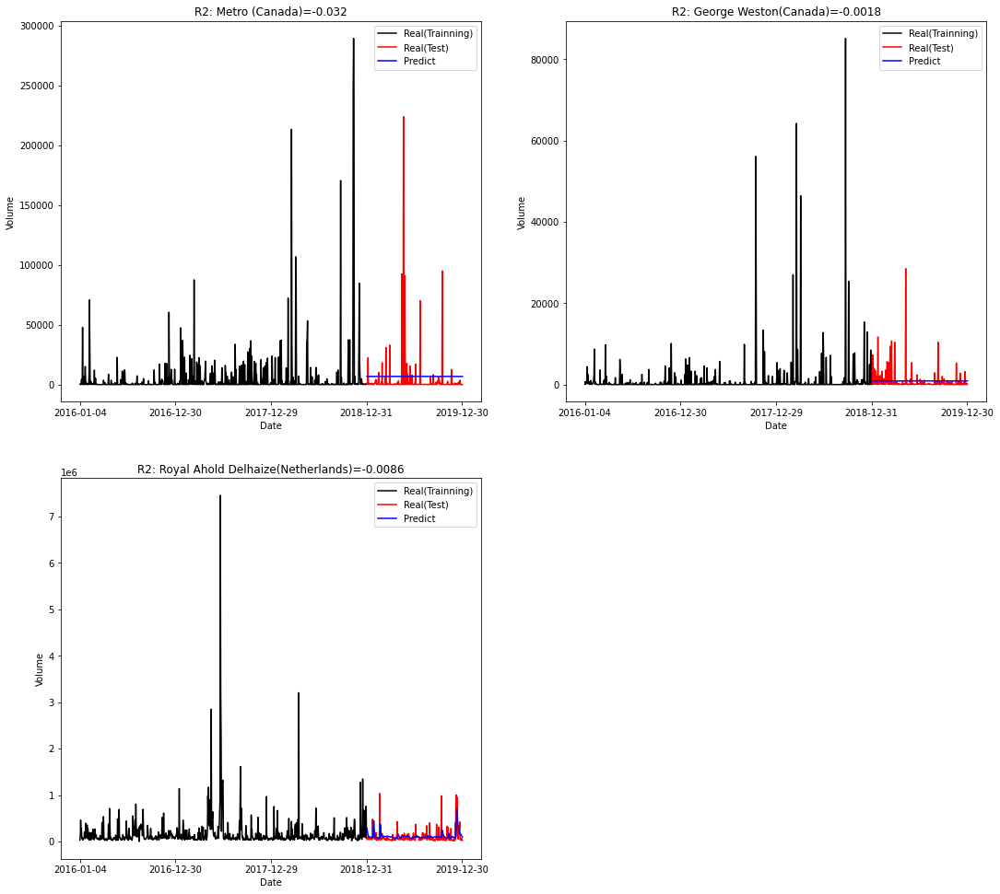

R2-3companies_average=-0.0141
R2_scores_lists=[-0.032, -0.0018, -0.0086, -0.0141]

8回目
[Arguments]
num_company=3社 ['Coop Group (Switzerland)', 'Walgreens Boots Alliance (USA)', 'Seven & I Holdings (Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 0.4724
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.3844
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.5234
Epoch 4/50
22/22 [==============================] - 0s 18ms/step - loss: 0.4025
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.3891
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - loss: 0.5733
Epoch 7/50
22/2

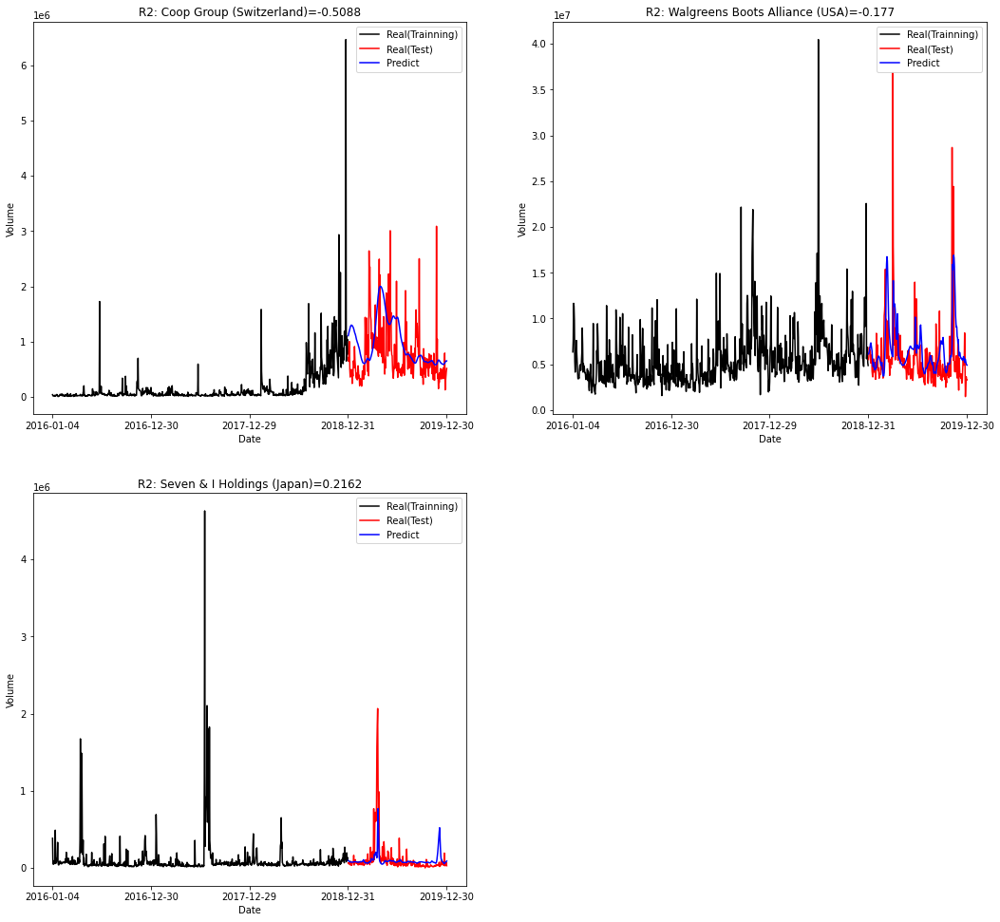

R2-3companies_average=-0.1565
R2_scores_lists=[-0.5088, -0.177, 0.2162, -0.1565]

9回目
[Arguments]
num_company=3社 ['Kroger(USA)', 'Metro (Canada)', 'Coop Group (Switzerland)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 7s 18ms/step - loss: 1.3469
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.8265
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.8724
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.6421
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.9283
Epoch 6/50
22/22 [==============================] - 0s 19ms/step - loss: 0.9273
Epoch 7/50
22/22 [=============================

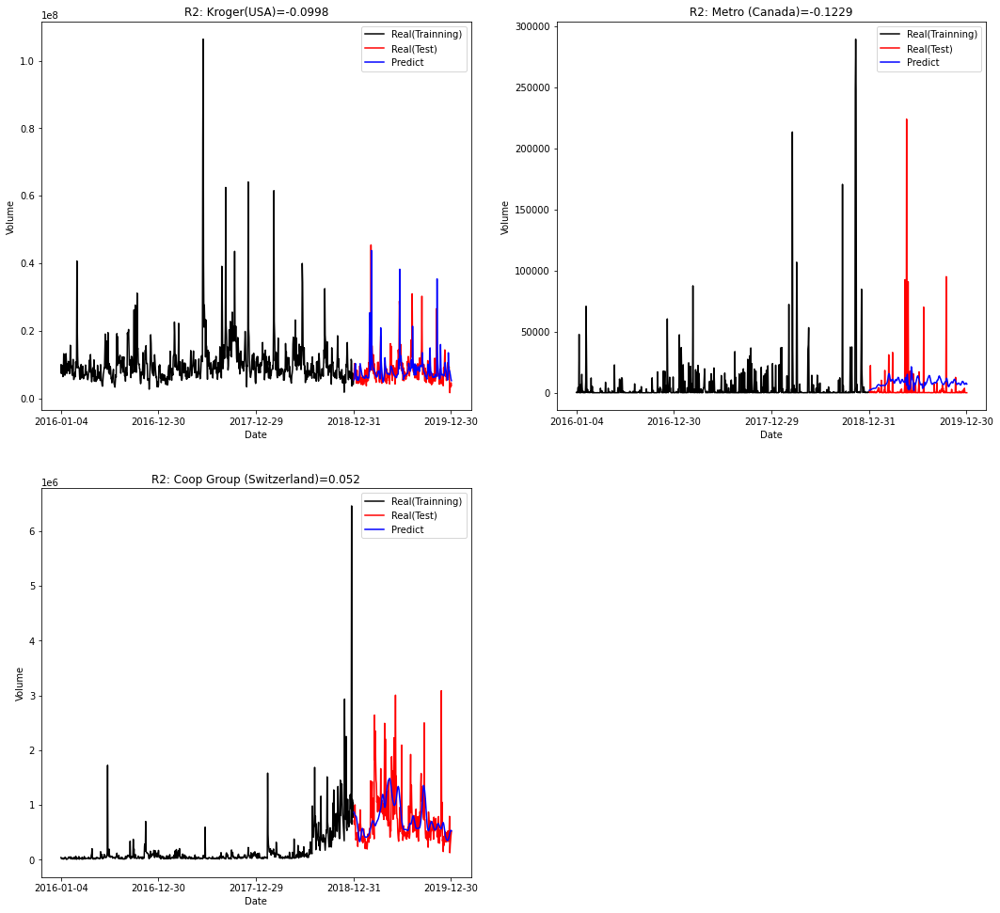

R2-3companies_average=-0.0569
R2_scores_lists=[-0.0998, -0.1229, 0.052, -0.0569]

10回目
[Arguments]
num_company=3社 ['AEON(Japan)', 'J.Sainsbury(Britain)', 'George Weston(Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(3, 754, 1)
training_set_all=(754, 3)
concat=(754, 3)
[0, 1, 2]
X_train=(694, 60, 3), y_trains=(2082,)
y_trains2=(3, 694)
1/3
Epoch 1/50
22/22 [==============================] - 5s 17ms/step - loss: 0.8501
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3452
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.7415
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.3782
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.5136
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 1.2585
Epoch 7/50
22/22 [=========================

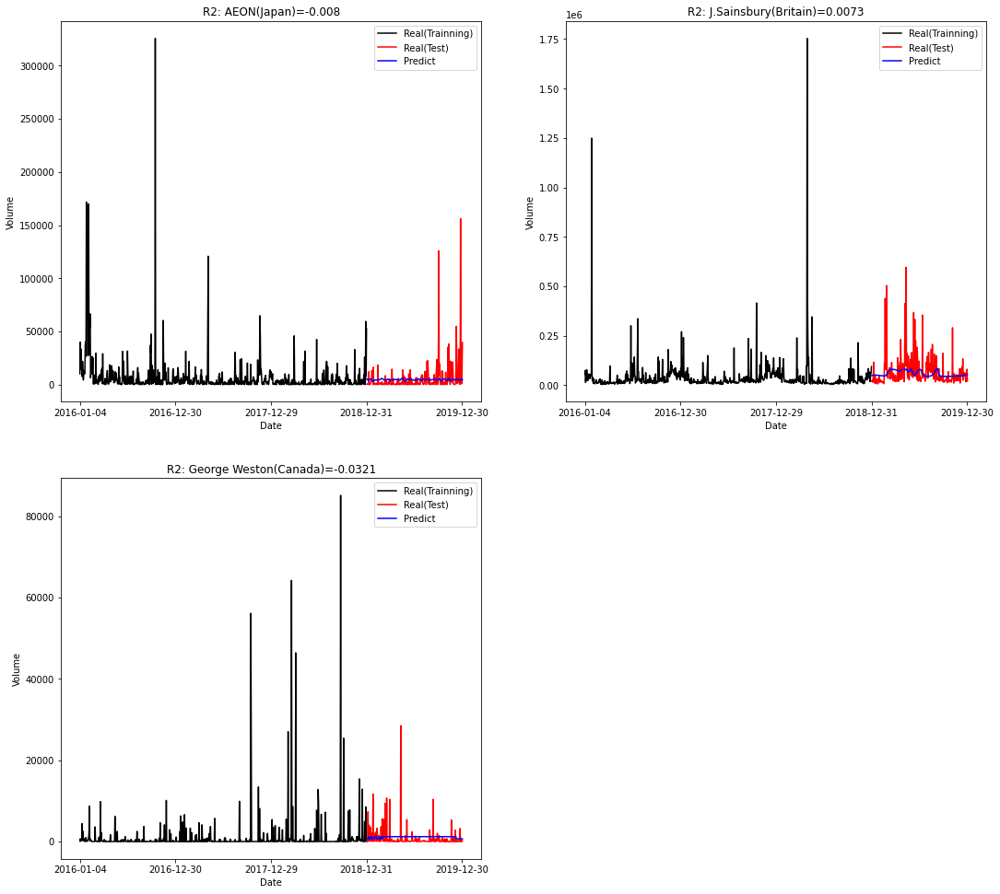

R2-3companies_average=-0.011
R2_scores_lists=[-0.008, 0.0073, -0.0321, -0.011]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=3, input_category=['Volume'], input_vars=[6], output_category=['Volume'], 
                    output_vars=[6], outputs_company=3, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

1回目
[Arguments]
num_company=4社 ['Walgreens Boots Alliance (USA)', 'Metro (Canada)', 'Kroger(USA)', 'George Weston(Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.9520
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 1.1866
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.8170
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.7137
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.5906
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.5601
Epoch 7/50
22/22 [==============================] - 0s 14ms/step - loss: 0.6400
Epoch 8/50
22/2

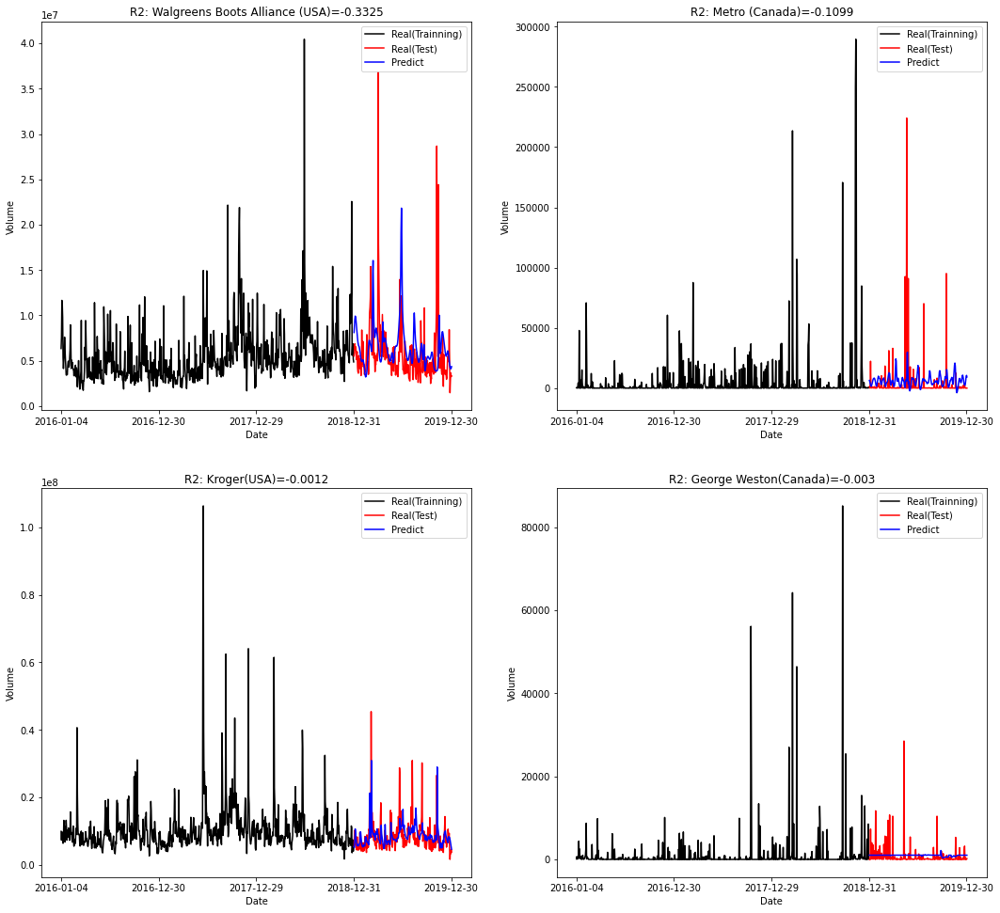

R2-4companies_average=-0.1116
R2_scores_lists=[-0.3325, -0.1099, -0.0012, -0.003, -0.1116]

2回目
[Arguments]
num_company=4社 ['Walgreens Boots Alliance (USA)', 'Royal Ahold Delhaize(Netherlands)', 'George Weston(Canada)', 'J.Sainsbury(Britain)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 1.2171
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.9850
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 1.3052
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.9061
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.6591
Epoch 6/50
22/22 [==============================] - 0s 

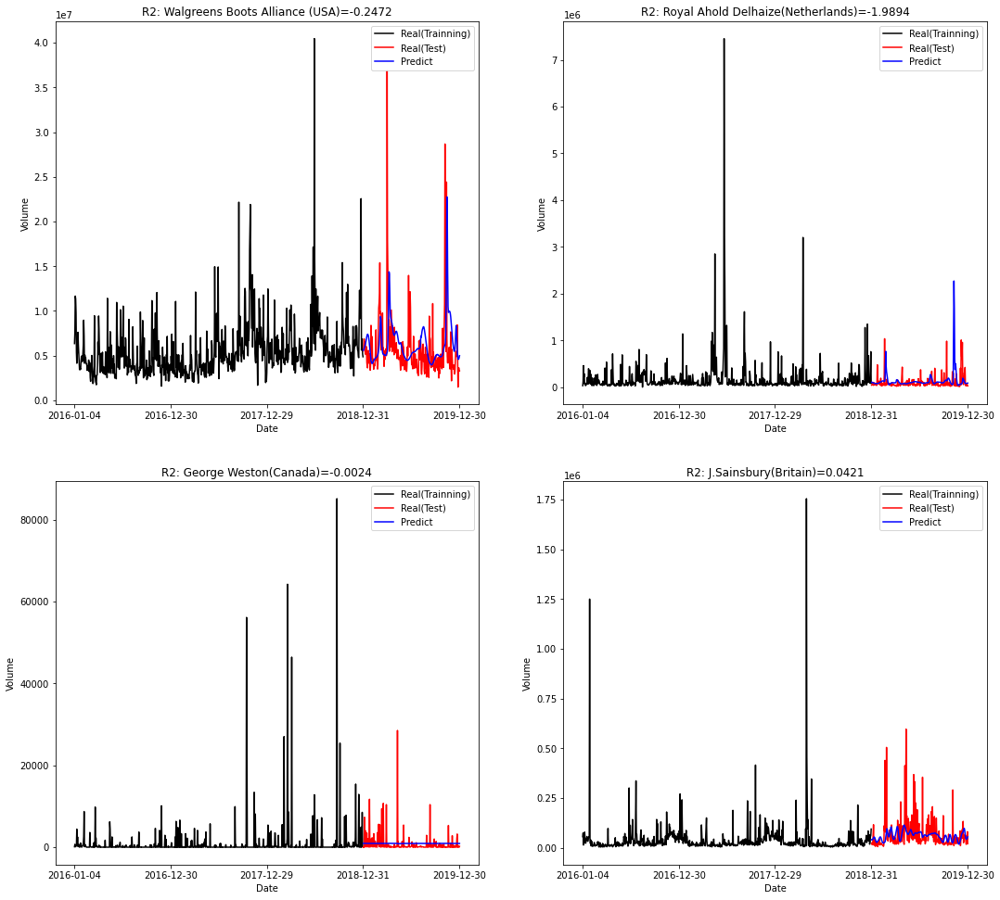

R2-4companies_average=-0.5492
R2_scores_lists=[-0.2472, -1.9894, -0.0024, 0.0421, -0.5492]

3回目
[Arguments]
num_company=4社 ['Royal Ahold Delhaize(Netherlands)', 'George Weston(Canada)', 'Metro (Canada)', 'Tesco(Britain)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 1.9582
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 1.1458
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.9999
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.9561
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 2.0639
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.88

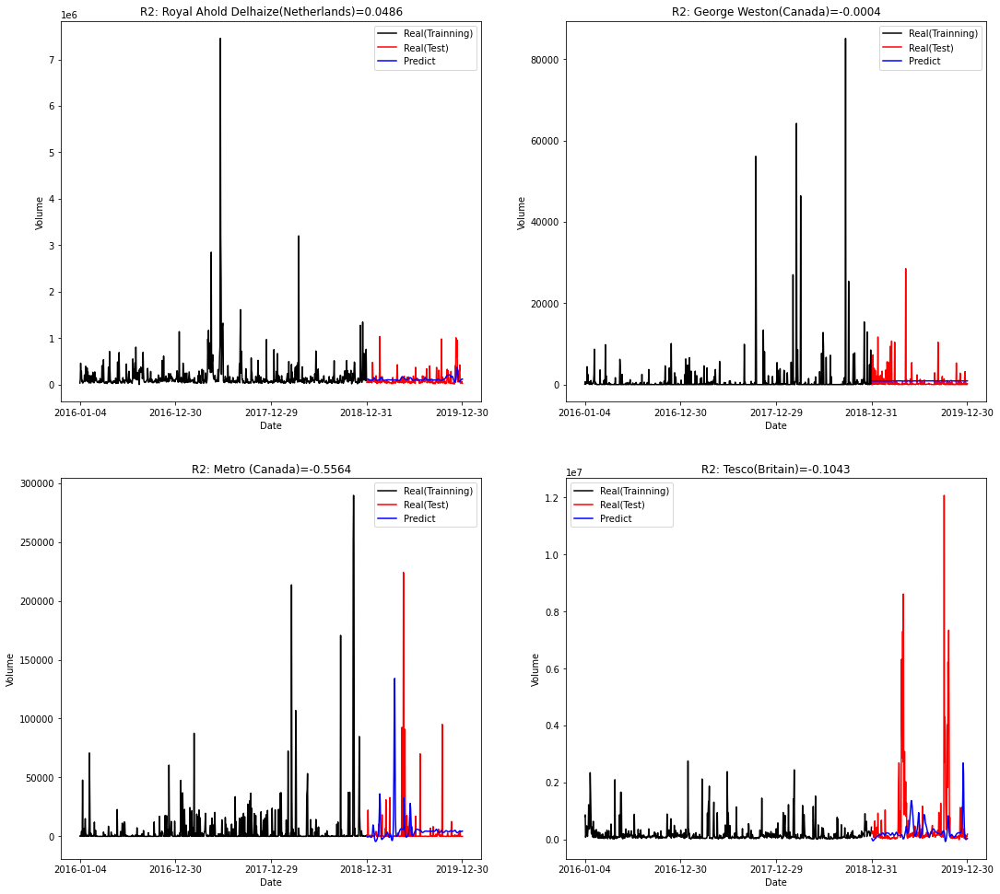

R2-4companies_average=-0.1531
R2_scores_lists=[0.0486, -0.0004, -0.5564, -0.1043, -0.1531]

4回目
[Arguments]
num_company=4社 ['Carrefour(France)', 'Walgreens Boots Alliance (USA)', 'Coop Group (Switzerland)', 'Seven & I Holdings (Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.6998
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7782
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.6188
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7032
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9275
Epoch 6/50
22/22 [==============================] - 0s 15ms/st

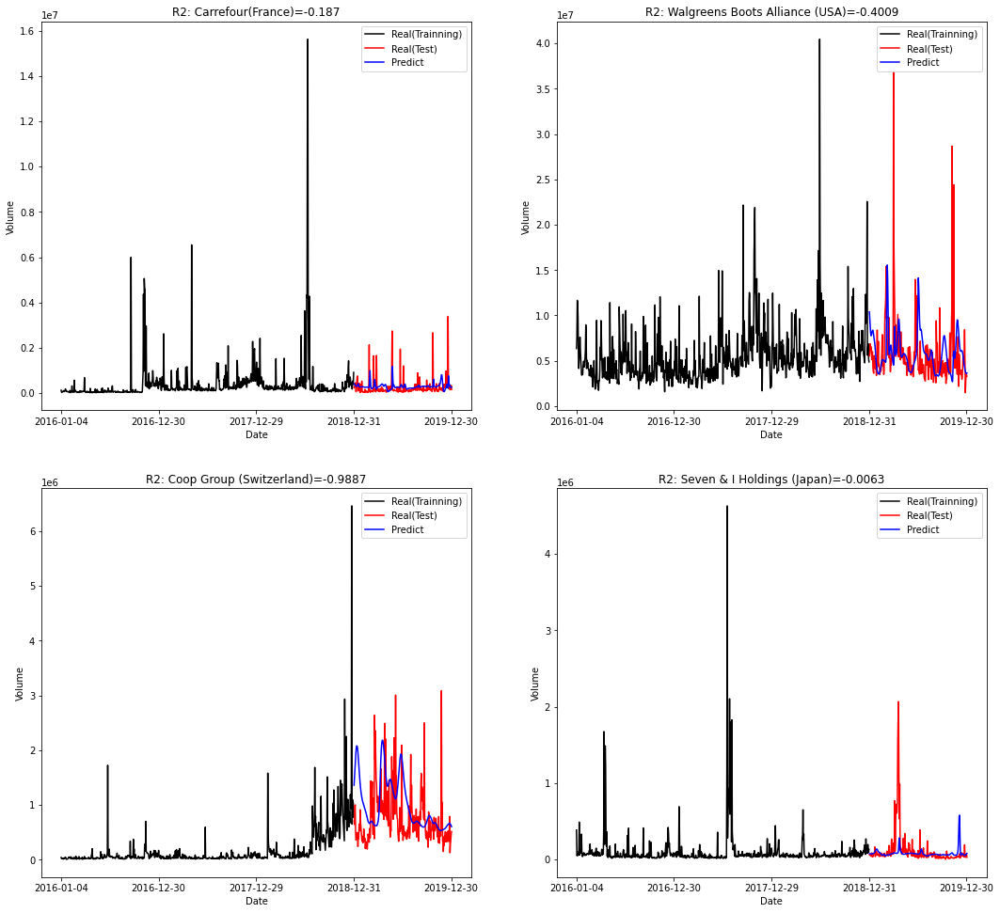

R2-4companies_average=-0.3957
R2_scores_lists=[-0.187, -0.4009, -0.9887, -0.0063, -0.3957]

5回目
[Arguments]
num_company=4社 ['Walgreens Boots Alliance (USA)', 'George Weston(Canada)', 'Coop Group (Switzerland)', 'J.Sainsbury(Britain)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.9817
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.8954
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.6454
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7636
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.7497
Epoch 6/50
22/22 [==============================] - 0s 16ms/step

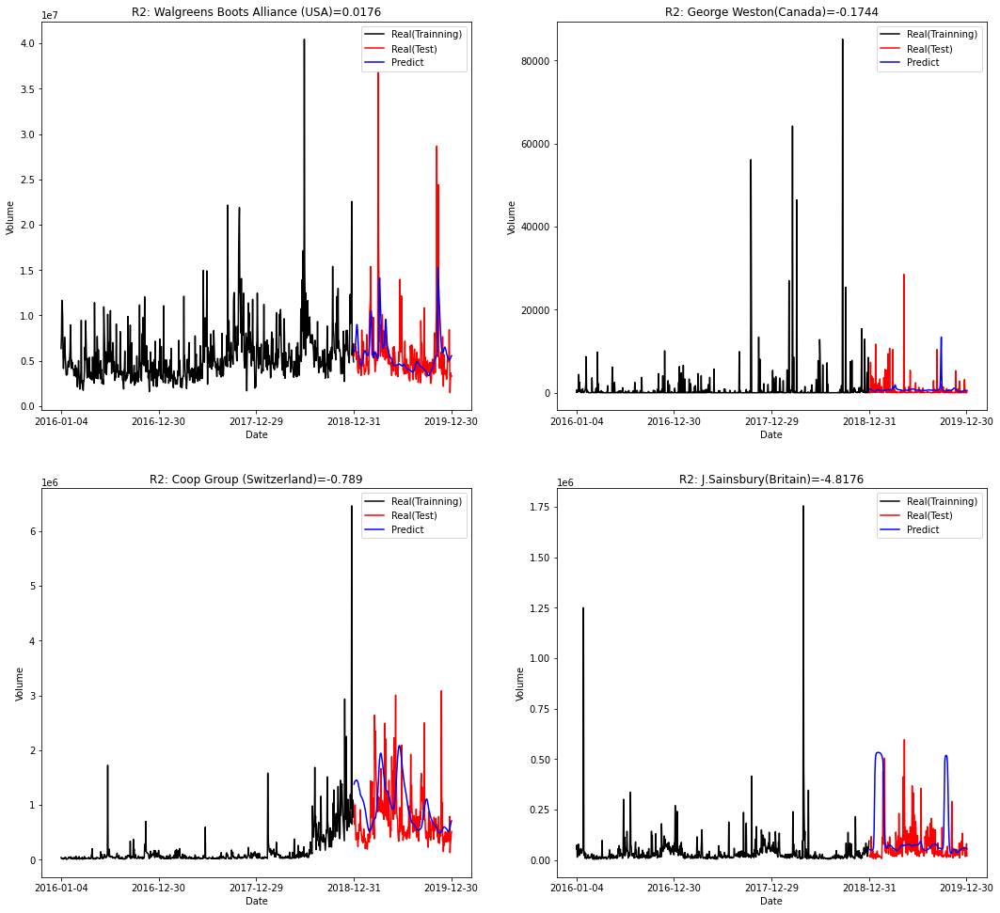

R2-4companies_average=-1.4408
R2_scores_lists=[0.0176, -0.1744, -0.789, -4.8176, -1.4408]

6回目
[Arguments]
num_company=4社 ['George Weston(Canada)', 'J.Sainsbury(Britain)', 'Tesco(Britain)', 'Kroger(USA)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.5799
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 1.1084
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8912
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 1.1566
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7026
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.8698
Epoch 7/50
22/

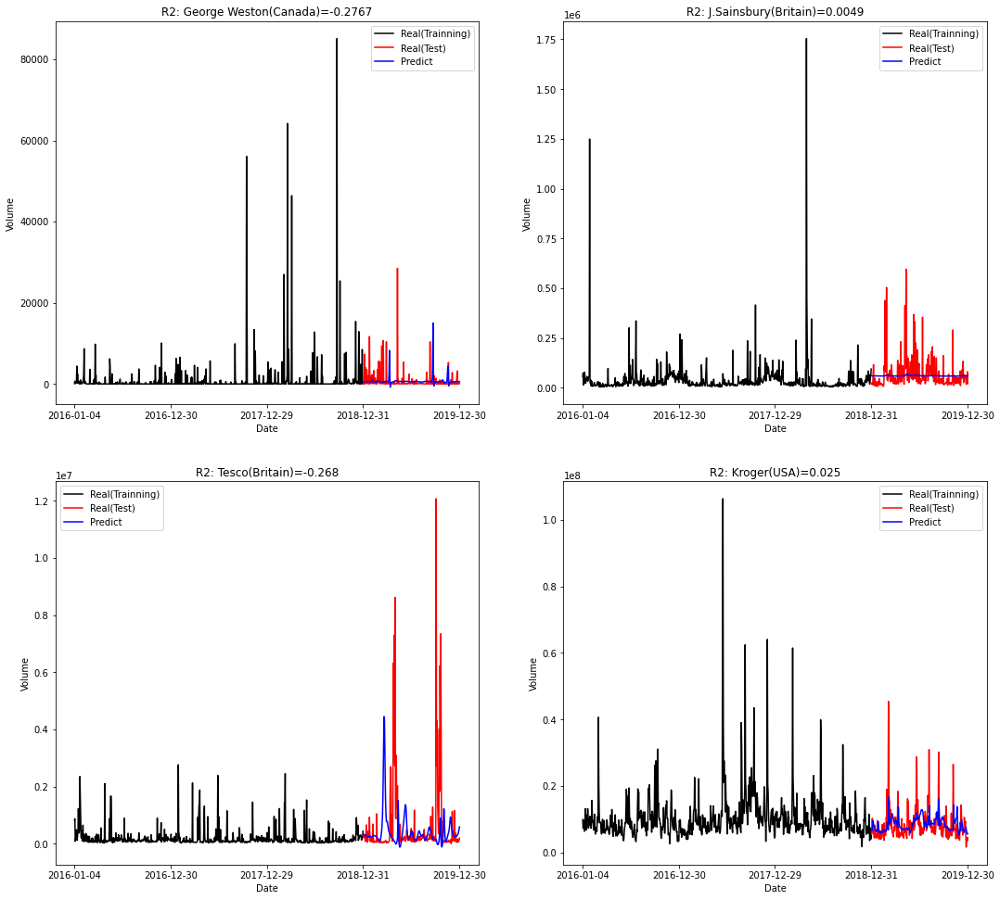

R2-4companies_average=-0.1287
R2_scores_lists=[-0.2767, 0.0049, -0.268, 0.025, -0.1287]

7回目
[Arguments]
num_company=4社 ['Coop Group (Switzerland)', 'Kroger(USA)', 'Carrefour(France)', 'Seven & I Holdings (Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 1.7487
Epoch 2/50
22/22 [==============================] - 0s 18ms/step - loss: 0.5566
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.4802
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.2646
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.4030
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 0.4623
Epoc

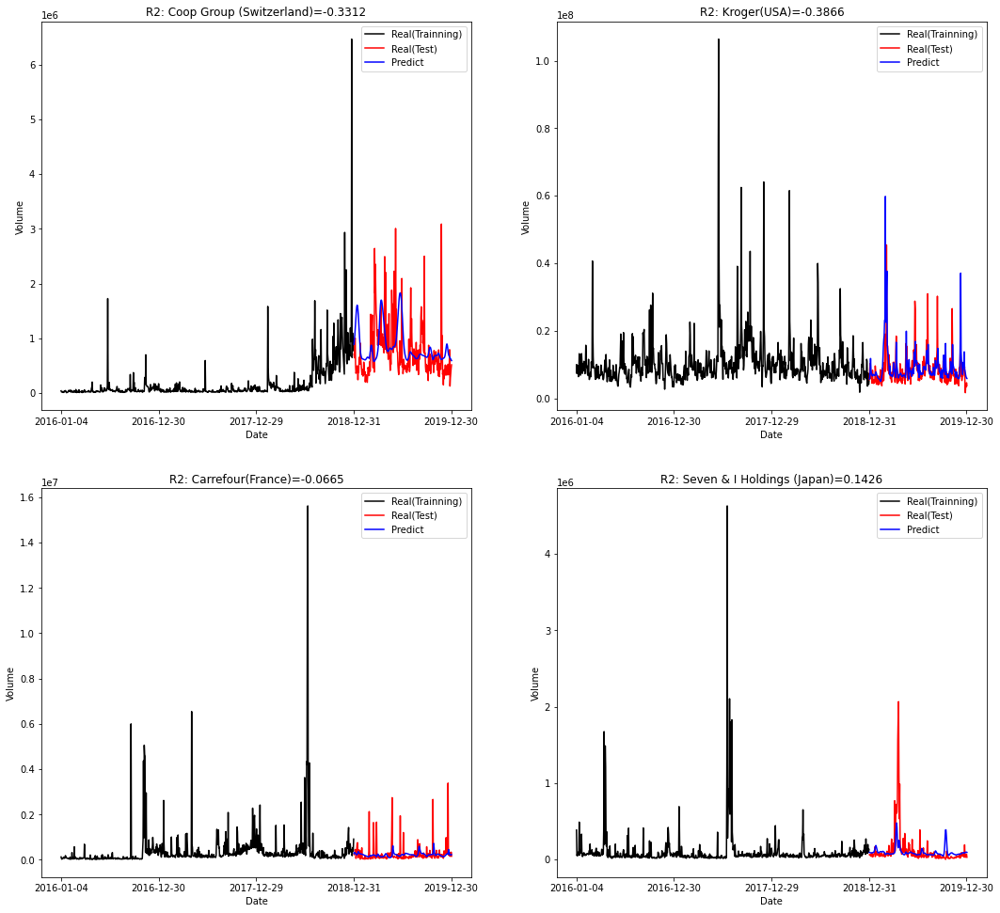

R2-4companies_average=-0.1605
R2_scores_lists=[-0.3312, -0.3866, -0.0665, 0.1426, -0.1605]

8回目
[Arguments]
num_company=4社 ['Carrefour(France)', 'J.Sainsbury(Britain)', 'AEON(Japan)', 'Walgreens Boots Alliance (USA)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.7074
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.3914
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 1.0295
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9274
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6915
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 1.0153
E

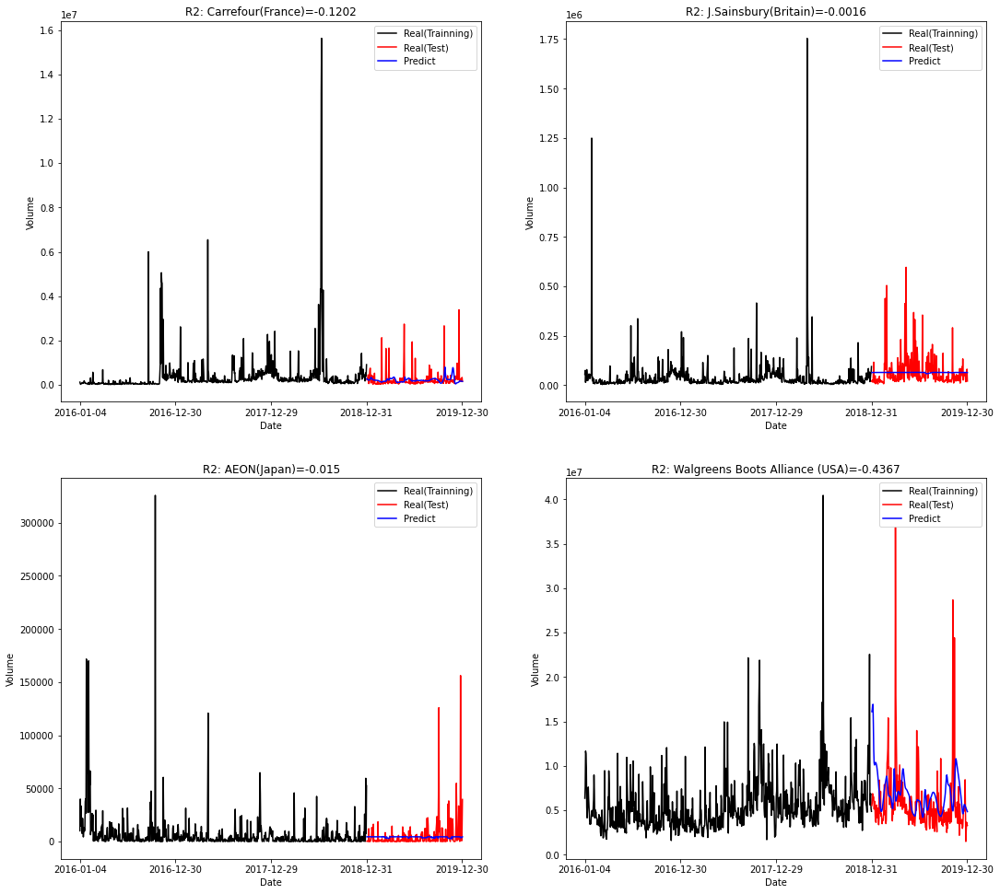

R2-4companies_average=-0.1434
R2_scores_lists=[-0.1202, -0.0016, -0.015, -0.4367, -0.1434]

9回目
[Arguments]
num_company=4社 ['Royal Ahold Delhaize(Netherlands)', 'Coop Group (Switzerland)', 'Kroger(USA)', 'Metro (Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 5s 17ms/step - loss: 0.6528
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 0.5951
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9315
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6686
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9737
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 1.09

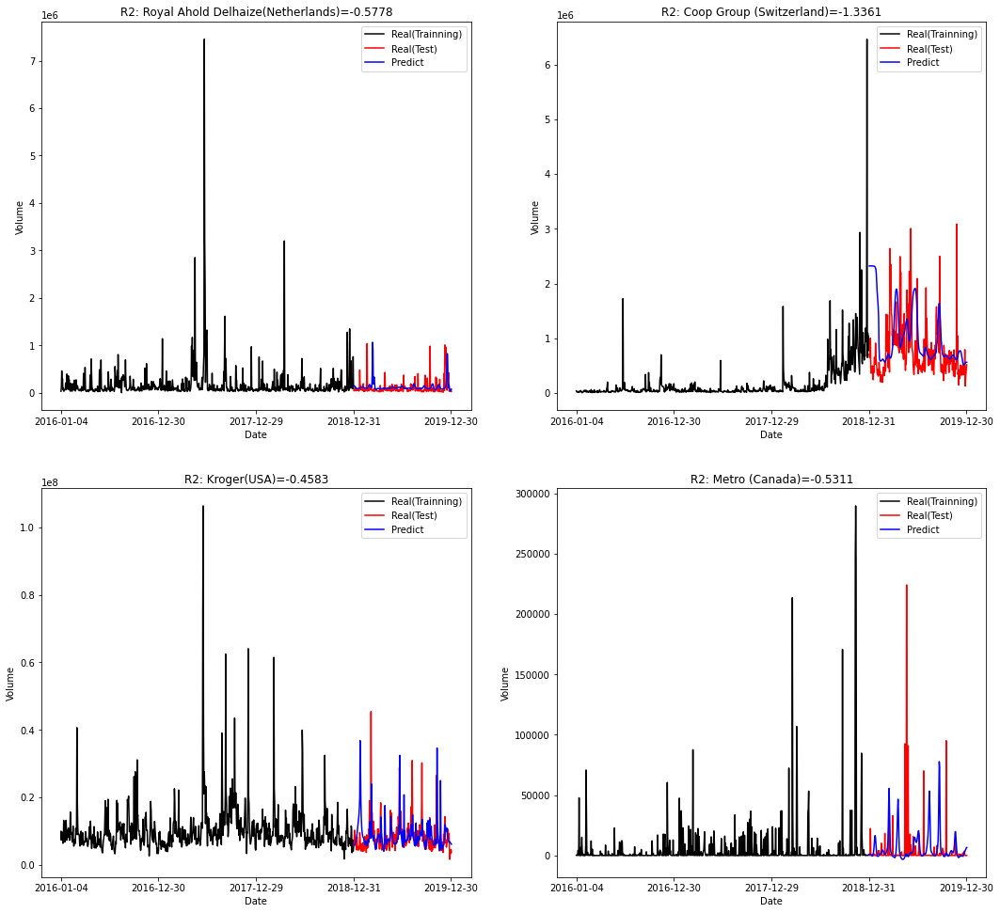

R2-4companies_average=-0.7258
R2_scores_lists=[-0.5778, -1.3361, -0.4583, -0.5311, -0.7258]

10回目
[Arguments]
num_company=4社 ['George Weston(Canada)', 'Walgreens Boots Alliance (USA)', 'Carrefour(France)', 'Metro (Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(4, 754, 1)
training_set_all=(754, 4)
concat=(754, 4)
[0, 1, 2, 3]
X_train=(694, 60, 4), y_trains=(2776,)
y_trains2=(4, 694)
1/4
Epoch 1/50
22/22 [==============================] - 6s 16ms/step - loss: 0.6636
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 1.7126
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 1.3973
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.7250
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 1.6584
Epoch 6/50
22/22 [==============================] - 0s 16ms/step - loss: 1.

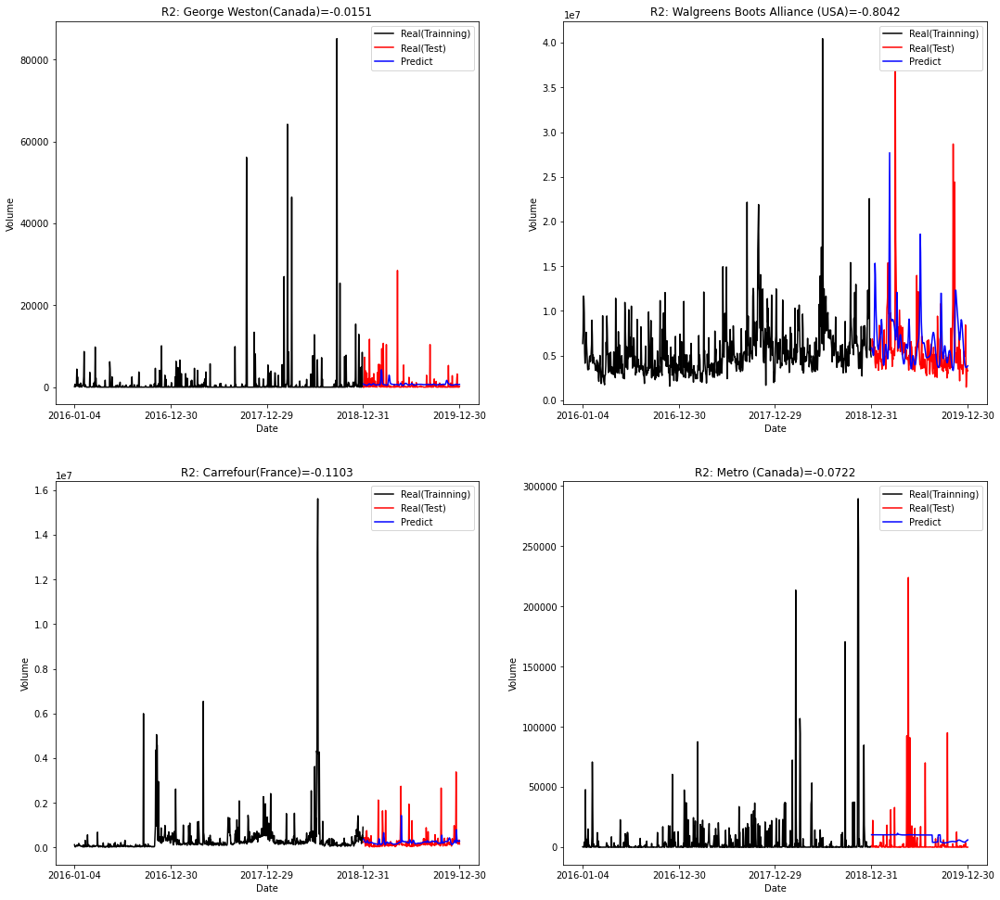

R2-4companies_average=-0.2504
R2_scores_lists=[-0.0151, -0.8042, -0.1103, -0.0722, -0.2504]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=4, input_category=['Volume'], input_vars=[6], output_category=['Volume'], 
                    output_vars=[6], outputs_company=4, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

1回目
[Arguments]
num_company=5社 ['Carrefour(France)', 'George Weston(Canada)', 'Kroger(USA)', 'Seven & I Holdings (Japan)', 'J.Sainsbury(Britain)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 21s 16ms/step - loss: 1.7063
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.5571
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.7113
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.6133
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9629
Epoch 6/50
22/22 [==============================] - 0s 17ms/step - loss: 1.1934
Epoch 7/50
22/22 [==============================] - 0s 18ms/step - l

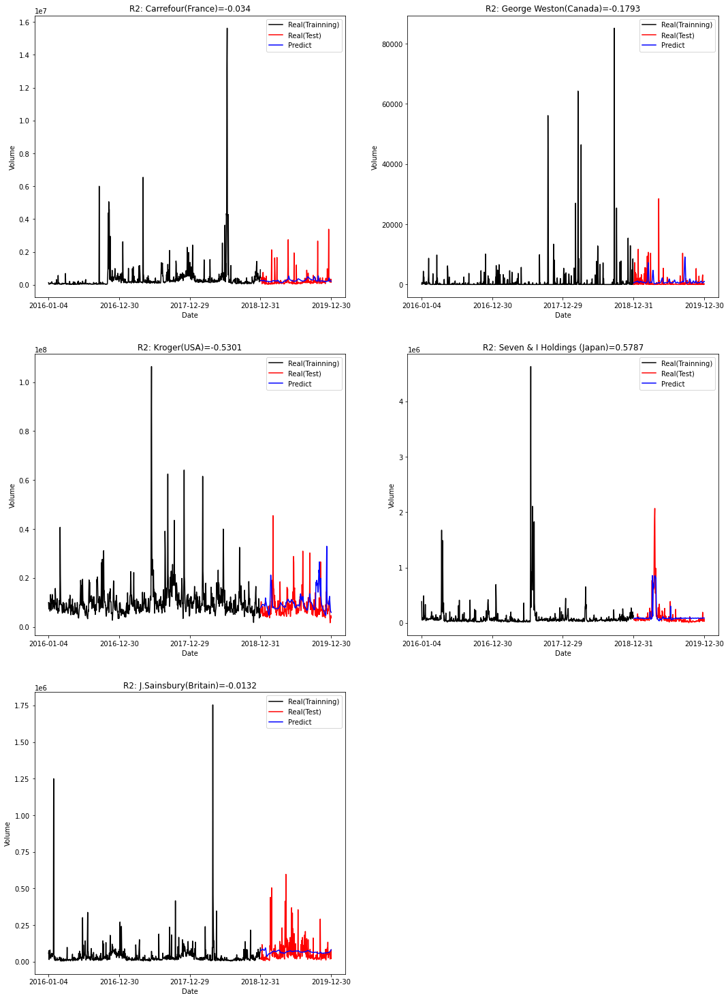

R2-5companies_average=-0.0356
R2_scores_lists=[-0.034, -0.1793, -0.5301, 0.5787, -0.0132, -0.0356]

2回目
[Arguments]
num_company=5社 ['Seven & I Holdings (Japan)', 'J.Sainsbury(Britain)', 'Coop Group (Switzerland)', 'AEON(Japan)', 'Carrefour(France)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 1.3812
Epoch 2/50
22/22 [==============================] - 0s 17ms/step - loss: 1.2303
Epoch 3/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8458
Epoch 4/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6116
Epoch 5/50
22/22 [==============================] - 0s 16ms/step - loss: 0.6710
Epoch 6/50
22/22 [============================

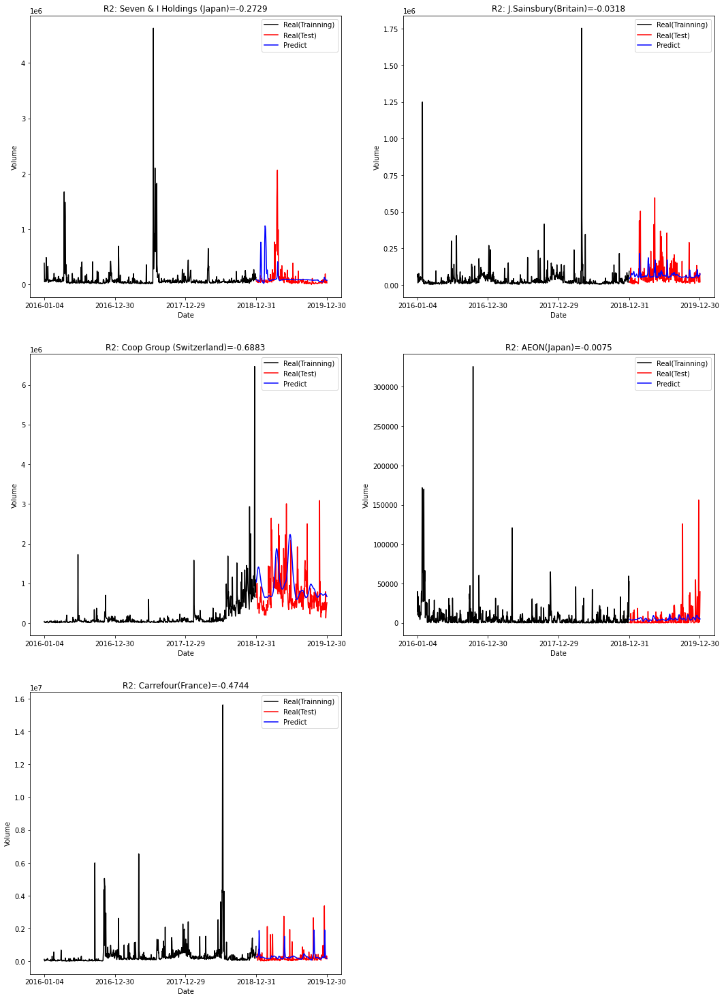

R2-5companies_average=-0.295
R2_scores_lists=[-0.2729, -0.0318, -0.6883, -0.0075, -0.4744, -0.295]

3回目
[Arguments]
num_company=5社 ['Seven & I Holdings (Japan)', 'J.Sainsbury(Britain)', 'Tesco(Britain)', 'Royal Ahold Delhaize(Netherlands)', 'George Weston(Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.6733
Epoch 2/50
22/22 [==============================] - 0s 16ms/step - loss: 0.9887
Epoch 3/50
22/22 [==============================] - 0s 16ms/step - loss: 0.4507
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8408
Epoch 5/50
22/22 [==============================] - 0s 17ms/step - loss: 0.8692
Epoch 6/50
22/22 [============

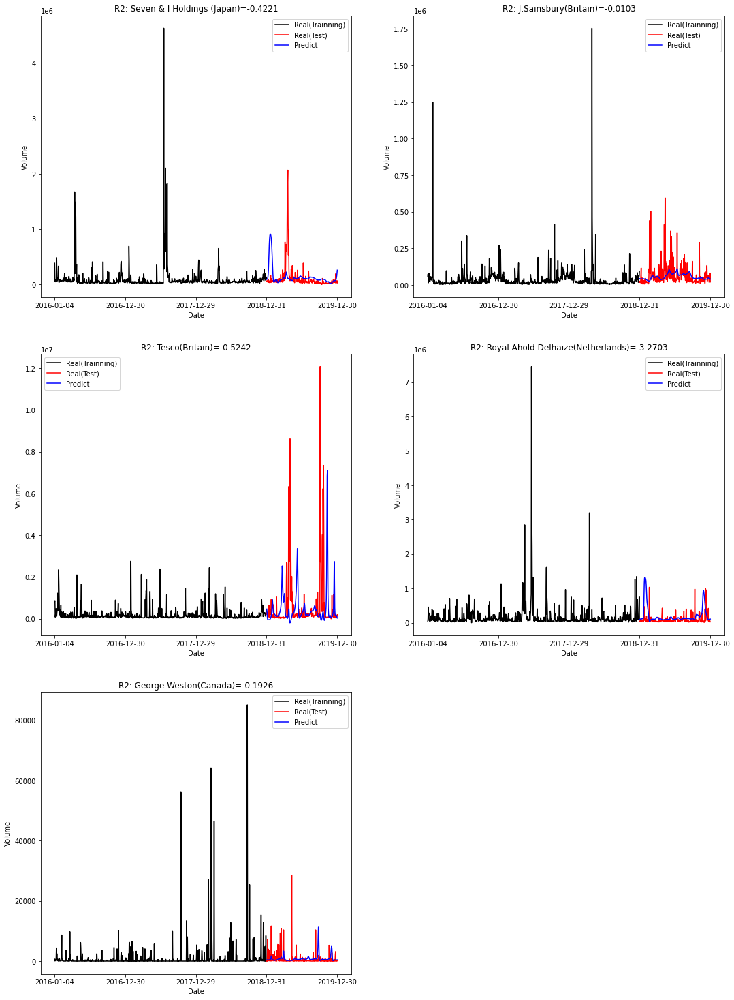

R2-5companies_average=-0.8839
R2_scores_lists=[-0.4221, -0.0103, -0.5242, -3.2703, -0.1926, -0.8839]

4回目
[Arguments]
num_company=5社 ['J.Sainsbury(Britain)', 'Coop Group (Switzerland)', 'Walgreens Boots Alliance (USA)', 'Tesco(Britain)', 'Metro (Canada)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 7s 19ms/step - loss: 1.6788
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.7061
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.4256
Epoch 4/50
22/22 [==============================] - 0s 19ms/step - loss: 0.4225
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.4348
Epoch 6/50
22/22 [======================

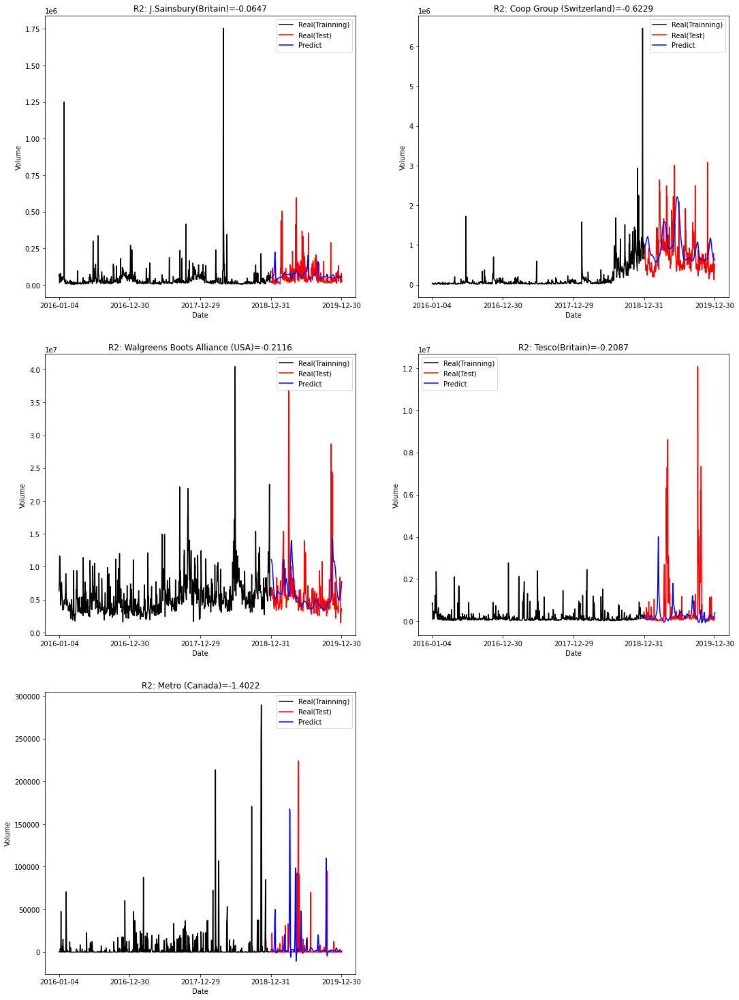

R2-5companies_average=-0.502
R2_scores_lists=[-0.0647, -0.6229, -0.2116, -0.2087, -1.4022, -0.502]

5回目
[Arguments]
num_company=5社 ['Tesco(Britain)', 'Walgreens Boots Alliance (USA)', 'Kroger(USA)', 'AEON(Japan)', 'Coop Group (Switzerland)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 1.1804
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.8394
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.7775
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.9457
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.8060
Epoch 6/50
22/22 [==============================] - 0s

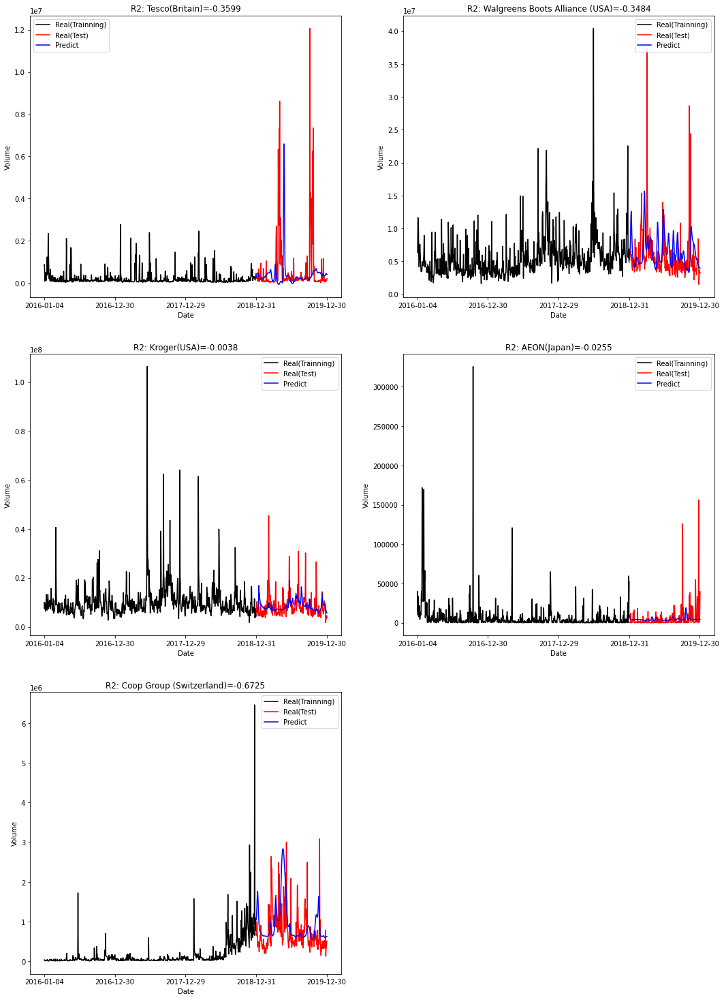

R2-5companies_average=-0.282
R2_scores_lists=[-0.3599, -0.3484, -0.0038, -0.0255, -0.6725, -0.282]

6回目
[Arguments]
num_company=5社 ['Kroger(USA)', 'AEON(Japan)', 'Metro (Canada)', 'Coop Group (Switzerland)', 'Tesco(Britain)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 5s 18ms/step - loss: 1.6371
Epoch 2/50
22/22 [==============================] - 0s 19ms/step - loss: 0.8670
Epoch 3/50
22/22 [==============================] - 0s 18ms/step - loss: 0.9057
Epoch 4/50
22/22 [==============================] - 0s 17ms/step - loss: 0.9373
Epoch 5/50
22/22 [==============================] - 0s 18ms/step - loss: 0.8596
Epoch 6/50
22/22 [==============================] - 0s 18ms/step - los

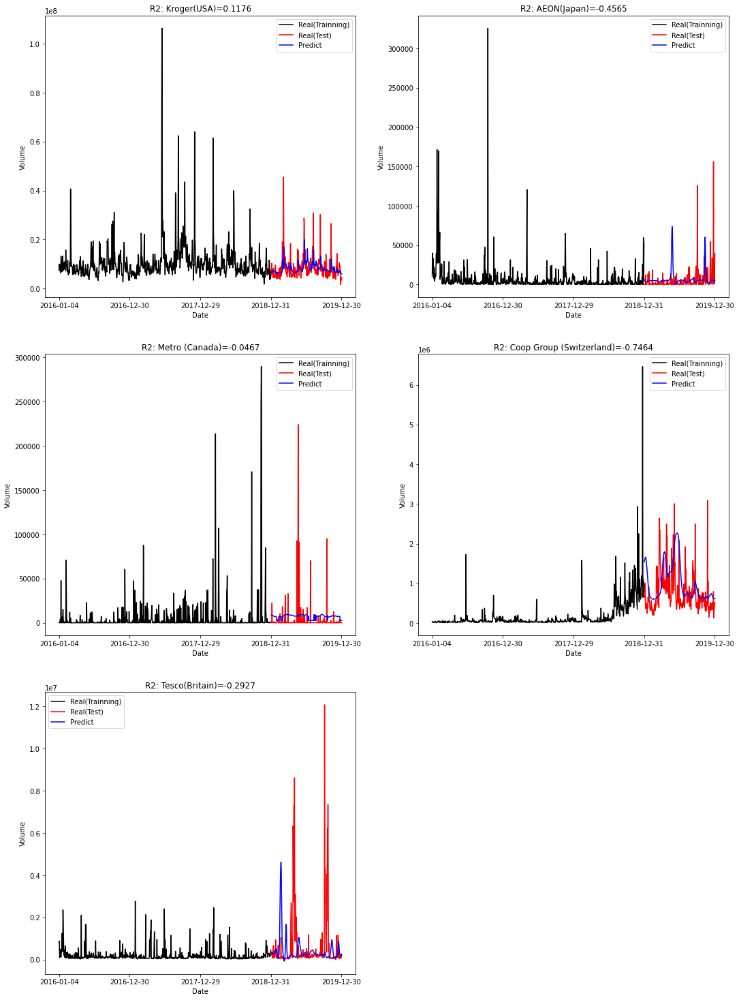

R2-5companies_average=-0.2849
R2_scores_lists=[0.1176, -0.4565, -0.0467, -0.7464, -0.2927, -0.2849]

7回目
[Arguments]
num_company=5社 ['George Weston(Canada)', 'Kroger(USA)', 'Coop Group (Switzerland)', 'Royal Ahold Delhaize(Netherlands)', 'Tesco(Britain)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 7s 20ms/step - loss: 1.3621
Epoch 2/50
22/22 [==============================] - 0s 22ms/step - loss: 0.8011
Epoch 3/50
22/22 [==============================] - 0s 20ms/step - loss: 0.6508
Epoch 4/50
22/22 [==============================] - 0s 21ms/step - loss: 0.6543
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.9175
Epoch 6/50
22/22 [======================

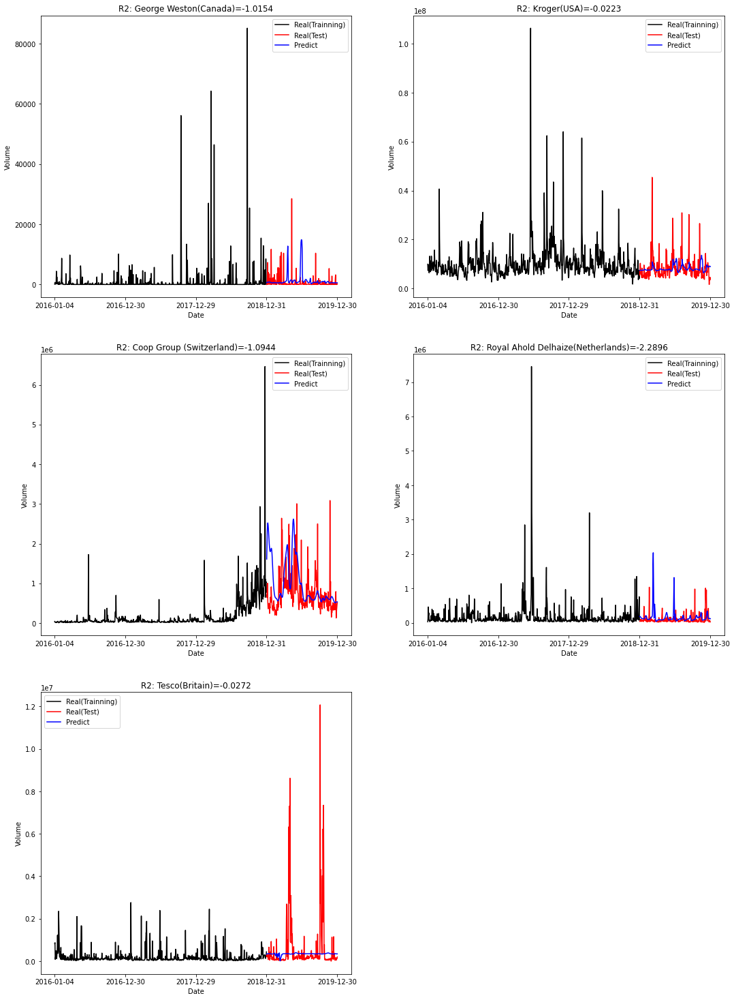

R2-5companies_average=-0.8898
R2_scores_lists=[-1.0154, -0.0223, -1.0944, -2.2896, -0.0272, -0.8898]

8回目
[Arguments]
num_company=5社 ['Walgreens Boots Alliance (USA)', 'Coop Group (Switzerland)', 'AEON(Japan)', 'Kroger(USA)', 'Royal Ahold Delhaize(Netherlands)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 5s 19ms/step - loss: 1.1473
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.8399
Epoch 3/50
22/22 [==============================] - 0s 19ms/step - loss: 0.7998
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.7818
Epoch 5/50
22/22 [==============================] - 0s 20ms/step - loss: 0.8445
Epoch 6/50
22/22 [===============

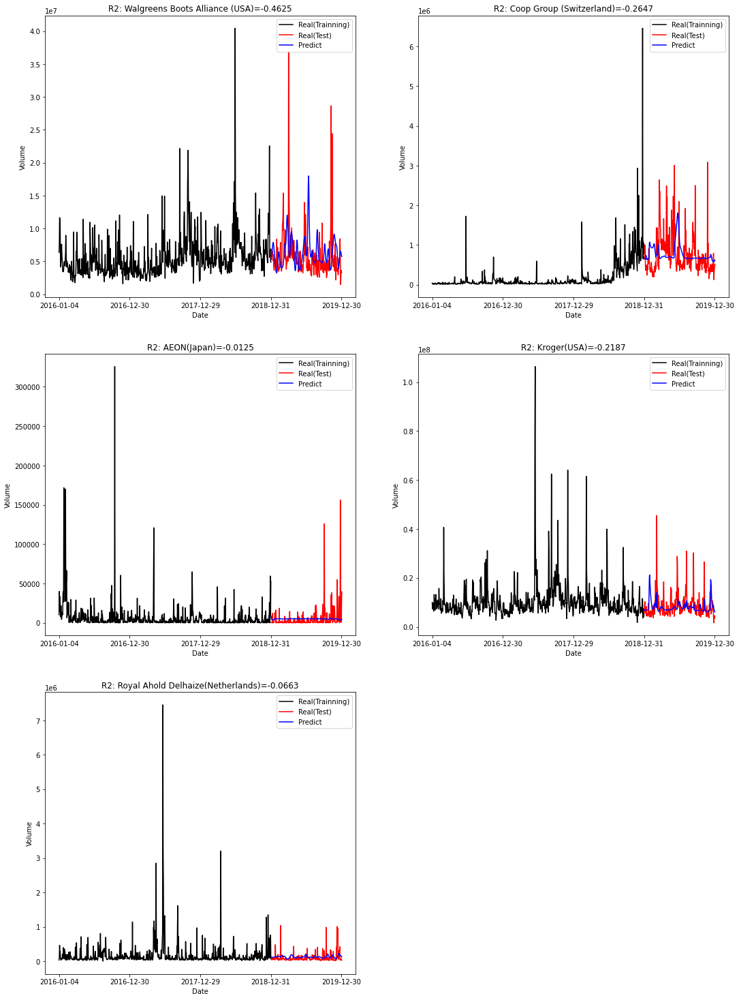

R2-5companies_average=-0.205
R2_scores_lists=[-0.4625, -0.2647, -0.0125, -0.2187, -0.0663, -0.205]

9回目
[Arguments]
num_company=5社 ['Walgreens Boots Alliance (USA)', 'George Weston(Canada)', 'Kroger(USA)', 'Seven & I Holdings (Japan)', 'Coop Group (Switzerland)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 6s 21ms/step - loss: 0.7746
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.8434
Epoch 3/50
22/22 [==============================] - 0s 22ms/step - loss: 0.8141
Epoch 4/50
22/22 [==============================] - 0s 20ms/step - loss: 0.6530
Epoch 5/50
22/22 [==============================] - 0s 22ms/step - loss: 0.9976
Epoch 6/50
22/22 [==============

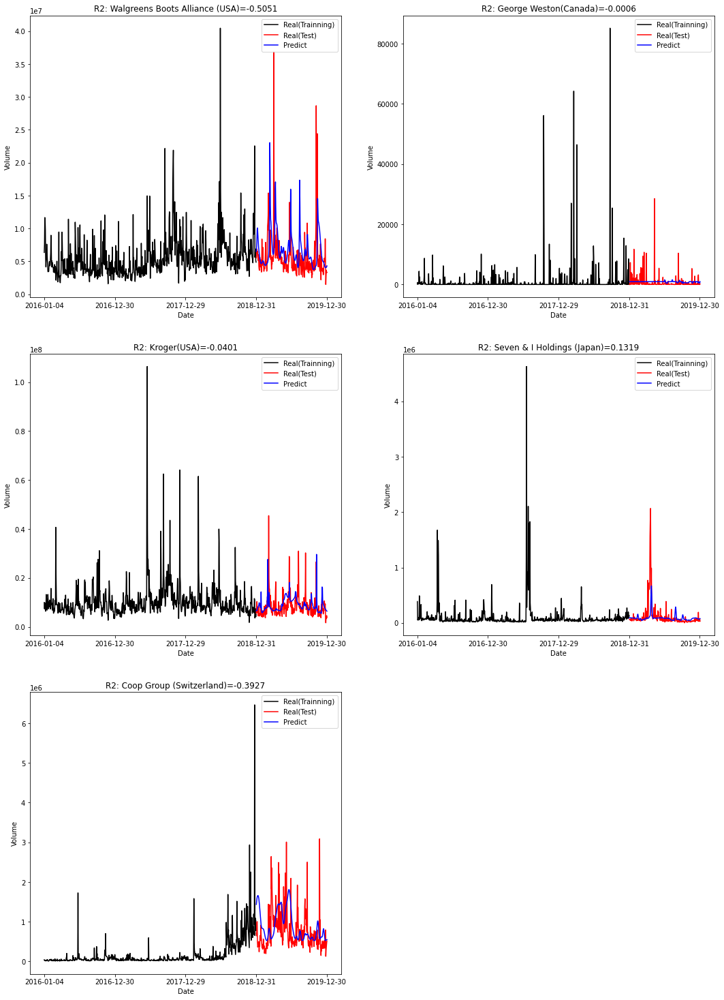

R2-5companies_average=-0.1613
R2_scores_lists=[-0.5051, -0.0006, -0.0401, 0.1319, -0.3927, -0.1613]

10回目
[Arguments]
num_company=5社 ['Seven & I Holdings (Japan)', 'Walgreens Boots Alliance (USA)', 'Kroger(USA)', 'Carrefour(France)', 'AEON(Japan)']
input_variables=['Volume'], ====> output_variables=['Volume']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(5, 754, 1)
training_set_all=(754, 5)
concat=(754, 5)
[0, 1, 2, 3, 4]
X_train=(694, 60, 5), y_trains=(3470,)
y_trains2=(5, 694)
1/5
Epoch 1/50
22/22 [==============================] - 5s 20ms/step - loss: 2.2247
Epoch 2/50
22/22 [==============================] - 0s 20ms/step - loss: 0.7320
Epoch 3/50
22/22 [==============================] - 0s 21ms/step - loss: 1.1031
Epoch 4/50
22/22 [==============================] - 0s 21ms/step - loss: 1.1138
Epoch 5/50
22/22 [==============================] - 0s 19ms/step - loss: 0.9325
Epoch 6/50
22/22 [=============================

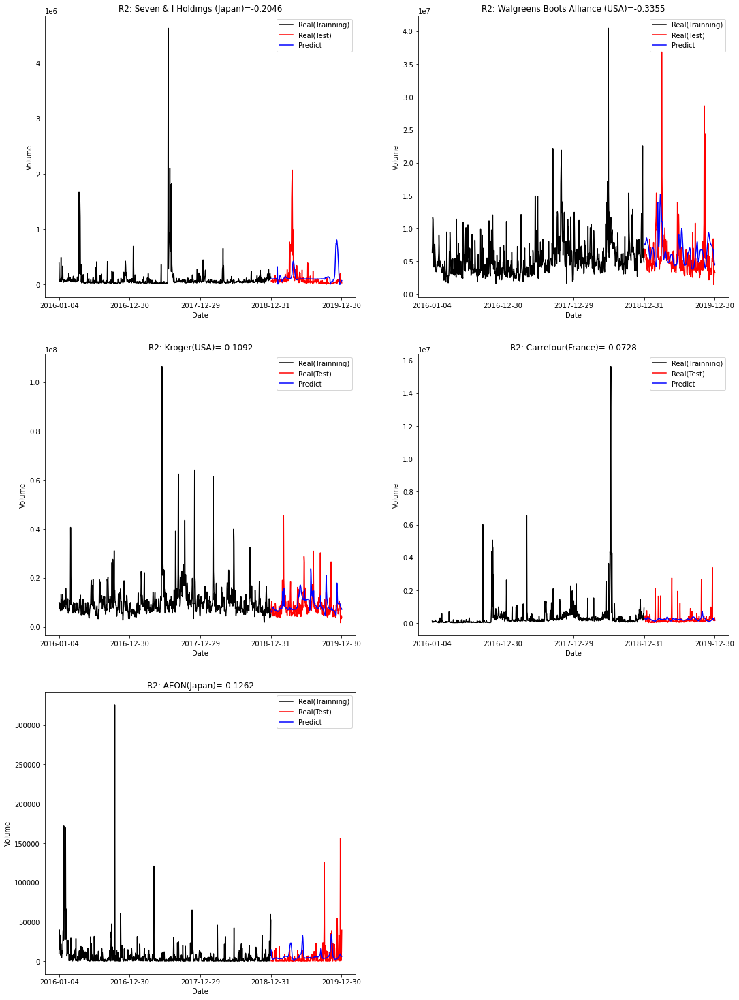

R2-5companies_average=-0.1697
R2_scores_lists=[-0.2046, -0.3355, -0.1092, -0.0728, -0.1262, -0.1697]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=5, input_category=['Volume'], input_vars=[6], output_category=['Volume'], 
                    output_vars=[6], outputs_company=5, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=6, input_category=['Volume'], input_vars=[6], output_category=['Volume'], 
                    output_vars=[6], outputs_company=6, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=7, input_category=['Volume'], input_vars=[6], output_category=['Volume'], 
                    output_vars=[6], outputs_company=7, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, cm_switch=False)

Output hidden; open in https://colab.research.google.com to view.

# Result (Volume -> Volume)

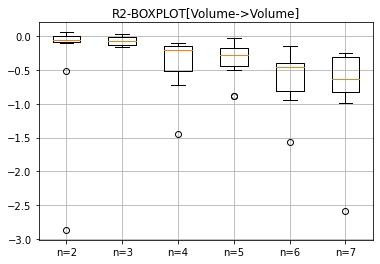

In [ ]:
import matplotlib.pyplot as plt
# experiment data
R2=[0.0103, 0.0536, -0.067, -2.8616, -0.0816, -0.0624, -0.518, -0.0121, -0.1027, 0.0243]
R3=[-0.0206, -0.0871, -0.1678, 0.0269, -0.0845, -0.1433, -0.0141, -0.1565, -0.0569, -0.011]
R4=[-0.1116, -0.5492, -0.1531, -0.3957, -1.4408, -0.1287, -0.1605, -0.1434, -0.7258, -0.2504]
R5=[-0.0356, -0.295, -0.8839, -0.502, -0.282, -0.2849, -0.8898, -0.205, -0.1613, -0.1697]
R6=[-0.4263, -0.4885, -0.1943, -1.5644, -0.3983, -0.4149, -0.1434, -0.8919, -0.9437, -0.5905]
R7=[-0.2526, -0.6461, -0.3531, -0.9952, -0.295, -0.6223, -0.866, -2.589, -0.7419, -0.2933]
R2_scores=(R2, R3, R4, R5, R6, R7)
fix, ax = plt.subplots()
boxplots = ax.boxplot(R2_scores)
ax.set_xticklabels(['n=2', 'n=3', 'n=4', 'n=5', 'n=6', 'n=7'])
plt.title('R2-BOXPLOT[Volume->Volume]')
plt.grid()
plt.show()

# Google Univariate (High->High)　
## comparative purpose

In [ ]:
df12=pd.read_csv("GOOGL.csv", index_col=0) 

1回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 21s 16ms/step - loss: 0.3752
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0930
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0594
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0537
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0461
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0470
Epoch 7/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0393
Epoch 8/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0441
Epoch 9/50
22/22 [========

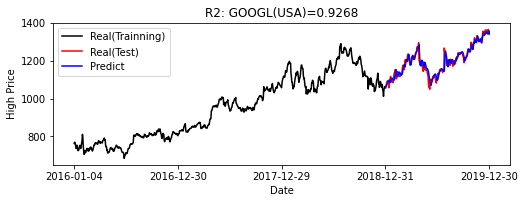

R2-1companies_average=0.9268
R2_scores_lists=[0.9268, 0.9268]

2回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 15ms/step - loss: 0.3607
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0740
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0571
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0520
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0508
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0442
Epoch 7/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0445
Epoch 8/50
22/22 [==========================

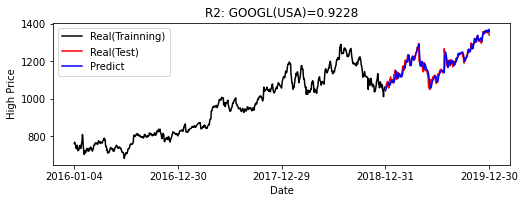

R2-1companies_average=0.9228
R2_scores_lists=[0.9228, 0.9228]

3回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 14ms/step - loss: 0.3741
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0640
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0541
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0577
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0500
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0520
Epoch 7/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0436
Epoch 8/50
22/22 [==========================

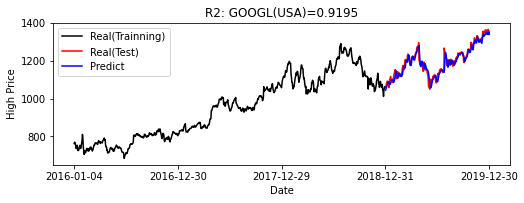

R2-1companies_average=0.9195
R2_scores_lists=[0.9195, 0.9195]

4回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.3046
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0724
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0494
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0437
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0461
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0398
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0488
Epoch 8/50
22/22 [==========================

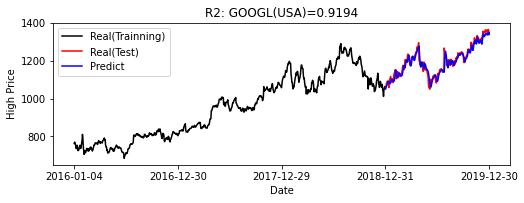

R2-1companies_average=0.9194
R2_scores_lists=[0.9194, 0.9194]

5回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 14ms/step - loss: 0.3105
Epoch 2/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0772
Epoch 3/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0499
Epoch 4/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0659
Epoch 5/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0547
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0444
Epoch 7/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0471
Epoch 8/50
22/22 [==========================

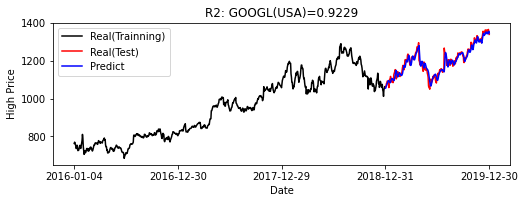

R2-1companies_average=0.9229
R2_scores_lists=[0.9229, 0.9229]

6回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.3850
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0872
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0587
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0477
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0534
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0453
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0478
Epoch 8/50
22/22 [==========================

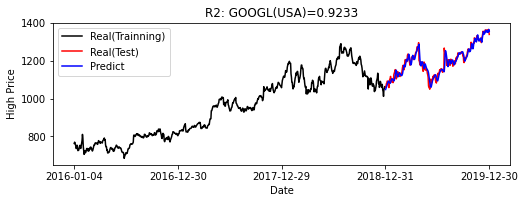

R2-1companies_average=0.9233
R2_scores_lists=[0.9233, 0.9233]

7回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 6s 15ms/step - loss: 0.3144
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0642
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0517
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0584
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0447
Epoch 6/50
22/22 [==============================] - 0s 14ms/step - loss: 0.0421
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0483
Epoch 8/50
22/22 [==========================

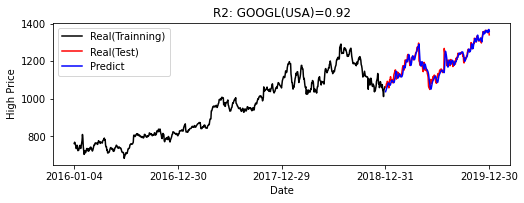

R2-1companies_average=0.92
R2_scores_lists=[0.92, 0.92]

8回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 17ms/step - loss: 0.3607
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0882
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0546
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0563
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0581
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0464
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0473
Epoch 8/50
22/22 [==============================] 

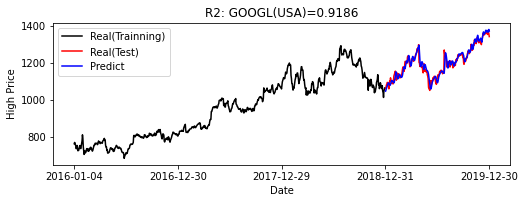

R2-1companies_average=0.9186
R2_scores_lists=[0.9186, 0.9186]

9回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 6s 15ms/step - loss: 0.4239
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0783
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0462
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0516
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0516
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0483
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0467
Epoch 8/50
22/22 [==========================

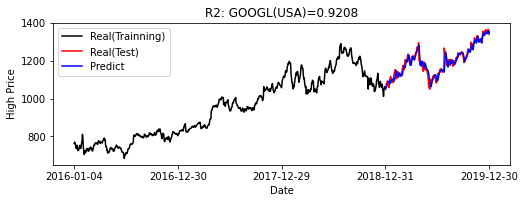

R2-1companies_average=0.9208
R2_scores_lists=[0.9208, 0.9208]

10回目
[Arguments]
num_company=1社 ['GOOGL(USA)']
input_variables=['High'], ====> output_variables=['High']
train_size=754, time_step=60, num_epoch=50, num_units(neurons)=100, batch_size=32

~~Make models~~
train_data=(1, 754, 1)
training_set_all=(754, 1)
concat=(754, 1)
[0]
X_train=(694, 60, 1), y_trains=(694,)
y_trains2=(1, 694)
1/1
Epoch 1/50
22/22 [==============================] - 5s 16ms/step - loss: 0.3608
Epoch 2/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0664
Epoch 3/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0552
Epoch 4/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0485
Epoch 5/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0474
Epoch 6/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0394
Epoch 7/50
22/22 [==============================] - 0s 15ms/step - loss: 0.0434
Epoch 8/50
22/22 [=========================

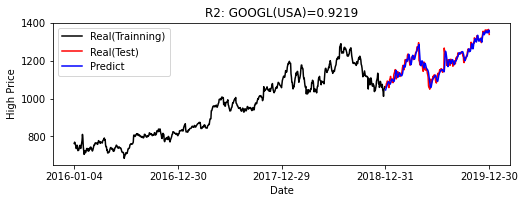

R2-1companies_average=0.9219
R2_scores_lists=[0.9219, 0.9219]



In [ ]:
for i in range(10):
  print(f"{i+1}回目")
  multivariate_LSTM(all_data, num_company=1, input_category=['High'], input_vars=[2], output_category=['High'], 
                    output_vars=[2], outputs_company=1, train_size=754, time_step=60, epochs=50, units=100, batch_size=32, 
                    cm_switch=False, uni_regression1='GOOGL(USA)', uni_regression2=df12)